<a href="https://colab.research.google.com/github/parisa-foroozande/chestx-ray14/blob/main/ForoozandeNejad_ReyhaniKivi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project C3: Lung Disease Prediction from X-ray

## Libraries

In [ ]:
pip install medmnist

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 3.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=8502d528e66afa3d50e5ab2fb8c82cd34dd6ac38bf0b2b6bb5a5610a4f442a84
  Stored in directory: /root/.cache/pip/wheels/19/39/2f/2d3cadc408a8804103f1c34ddd4b9f6a93497b11fa96fe738e
Successfully built fire


In [ ]:
import os
import random
import time
import pickle
import zipfile
import logging
import requests
import psutil

import math
import pickle
import time

import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from PIL import ImageFont
from tqdm import tqdm
from skimage.measure import label
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import holoviews as hv
from holoviews import opts

import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, losses, metrics
from tensorflow.keras.applications import ResNet50, VGG19
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import AvgPool2D, GlobalAveragePooling2D, MaxPool2D, Input, Conv2D, BatchNormalization, Dense, ReLU, concatenate, Lambda
from tensorflow.keras.models import load_model, clone_model, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow.keras.backend as K

## Downloading the data set

In [ ]:
train_dataset1 = ChestMNIST(split="train", download=True, size=64)
val_dataset1 = ChestMNIST(split="val", download=True, size=64)
test_dataset1 = ChestMNIST(split="test", download=True, size=64)

train_dataset2 = ChestMNIST(split="train", download=True, size=128)
val_dataset2 = ChestMNIST(split="val", download=True, size=128)
test_dataset2 = ChestMNIST(split="test", download=True, size=128)

train_dataset3 = ChestMNIST(split="train", download=True, size=224)
val_dataset3 = ChestMNIST(split="val", download=True, size=224)
test_dataset3 = ChestMNIST(split="test", download=True, size=224)

100%|██████████| 402M/402M [00:43<00:00, 9.17MB/s]


Using downloaded and verified file: /root/.medmnist/chestmnist_64.npz
Using downloaded and verified file: /root/.medmnist/chestmnist_64.npz


100%|██████████| 1.43G/1.43G [01:41<00:00, 14.0MB/s]


Using downloaded and verified file: /root/.medmnist/chestmnist_128.npz
Using downloaded and verified file: /root/.medmnist/chestmnist_128.npz


100%|██████████| 3.89G/3.89G [07:04<00:00, 9.17MB/s]


Using downloaded and verified file: /root/.medmnist/chestmnist_224.npz
Using downloaded and verified file: /root/.medmnist/chestmnist_224.npz


## Mounting Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
dir1 = '/content/drive/My Drive/ChestMNIST/64'
dir2 = '/content/drive/My Drive/ChestMNIST/128'
dir3 = '/content/drive/My Drive/ChestMNIST/224'

## Loading and splitting the data

In [ ]:
train_images_64 = np.load(f"{dir1}/chestmnist_64.npz", mmap_mode="r")["train_images"]
train_labels_64 = np.load(f"{dir1}/chestmnist_64.npz", mmap_mode="r")["train_labels"]
val_images_64 = np.load(f"{dir1}/chestmnist_64.npz", mmap_mode="r")["val_images"]
val_labels_64 = np.load(f"{dir1}/chestmnist_64.npz", mmap_mode="r")["val_labels"]
test_images_64 = np.load(f"{dir1}/chestmnist_64.npz", mmap_mode="r")["test_images"]
test_labels_64 = np.load(f"{dir1}/chestmnist_64.npz", mmap_mode="r")["test_labels"]

In [ ]:
seed = 42
np.random.seed(seed)
percentage = 0.1

n1 = train_images_64.shape[0]
n2 = val_images_64.shape[0]
n3 = test_images_64.shape[0]

num_samples1 = int(n1 * percentage)
random_indices1 = np.random.choice(n1, num_samples1, replace=False)
num_samples2 = int(n2 * percentage)
random_indices2 = np.random.choice(n2, num_samples2, replace=False)
num_samples3 = int(n3 * percentage)
random_indices3 = np.random.choice(n3, num_samples3, replace=False)

train_images_64 = train_images_64[random_indices1]
train_labels_64 = train_labels_64[random_indices1]
val_images_64 = val_images_64[random_indices2]
val_labels_64 = val_labels_64[random_indices2]
test_images_64 = test_images_64[random_indices3]
test_labels_64 = test_labels_64[random_indices3]

In [ ]:
train_images_128 = np.load(f"{dir2}/chestmnist_128.npz",mmap_mode="r")["train_images"]
train_labels_128 = np.load(f"{dir2}/chestmnist_128.npz",mmap_mode="r")["train_labels"]
val_images_128 = np.load(f"{dir2}/chestmnist_128.npz",mmap_mode="r")["val_images"]
val_labels_128 = np.load(f"{dir2}/chestmnist_128.npz",mmap_mode="r")["val_labels"]
test_images_128 = np.load(f"{dir2}/chestmnist_128.npz",mmap_mode="r")["test_images"]
test_labels_128 = np.load(f"{dir2}/chestmnist_128.npz",mmap_mode="r")["test_labels"]

In [ ]:
seed = 42
np.random.seed(seed)
percentage = 0.1

n1 = train_images_128.shape[0]
n2 = val_images_128.shape[0]
n3 = test_images_128.shape[0]

num_samples1 = int(n1 * percentage)
random_indices1 = np.random.choice(n1, num_samples1, replace=False)
num_samples2 = int(n2 * percentage)
random_indices2 = np.random.choice(n2, num_samples2, replace=False)
num_samples3 = int(n3 * percentage)
random_indices3 = np.random.choice(n3, num_samples3, replace=False)

train_images_128 = train_images_128[random_indices1]
train_labels_128 = train_labels_128[random_indices1]
val_images_128 = val_images_128[random_indices2]
val_labels_128 = val_labels_128[random_indices2]
test_images_128 = test_images_128[random_indices3]
test_labels_128 = test_labels_128[random_indices3]

In [ ]:
train_images_224 = np.load(f"{dir3}/chestmnist_224.npz", mmap_mode="r")["train_images"]
train_labels_224 = np.load(f"{dir3}/chestmnist_224.npz", mmap_mode="r")["train_labels"]
val_images_224 = np.load(f"{dir3}/chestmnist_224.npz", mmap_mode="r")["val_images"]
val_labels_224 = np.load(f"{dir3}/chestmnist_224.npz", mmap_mode="r")["val_labels"]
test_images_224 = np.load(f"{dir3}/chestmnist_224.npz", mmap_mode="r")["test_images"]
test_labels_224 = np.load(f"{dir3}/chestmnist_224.npz", mmap_mode="r")["test_labels"]

In [ ]:
seed = 42
np.random.seed(seed)
percentage = 0.1

n1 = train_images_224.shape[0]
n2 = val_images_224.shape[0]
n3 = test_images_224.shape[0]

num_samples1 = int(n1 * percentage)
random_indices1 = np.random.choice(n1, num_samples1, replace=False)
num_samples2 = int(n2 * percentage)
random_indices2 = np.random.choice(n2, num_samples2, replace=False)
num_samples3 = int(n3 * percentage)
random_indices3 = np.random.choice(n3, num_samples3, replace=False)

train_images_224 = train_images_224[random_indices1]
train_labels_224 = train_labels_224[random_indices1]
val_images_224 = val_images_224[random_indices2]
val_labels_224 = val_labels_224[random_indices2]
test_images_224 = test_images_224[random_indices3]
test_labels_224 = test_labels_224[random_indices3]

array([[146, 118,  80, ...,  19,  19,  19],
       [ 32,  23,  19, ...,  19,  18,  18],
       [ 14,  15,  16, ...,  18,  18,  18],
       ...,
       [ 75, 114,  59, ...,  78,  57,  23],
       [ 17,  77, 104, ...,  82,  60,  28],
       [ 11,  29,  74, ...,  84,  64,  32]], dtype=uint8)
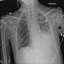

In [ ]:
train_images_64[0]

In [ ]:
train_labels_64[0]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=uint8)

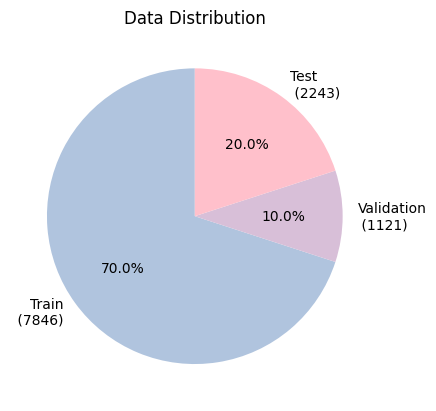

In [ ]:
train_size = len(train_images_64)
val_size = len(val_images_64)
test_size = len(test_images_64)

total_size = train_size + val_size + test_size

train_percentage = (train_size / total_size) * 100
val_percentage = (val_size / total_size) * 100
test_percentage = (test_size / total_size) * 100

labels = ['Train\n (7846)', 'Validation\n (1121)', 'Test\n (2243)']
sizes = [train_percentage, val_percentage, test_percentage]

plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=['lightsteelblue','thistle','pink'])
plt.title('Data Distribution')
plt.show()

In [ ]:
print(len(train_images_224),
len(val_images_224),
len(test_images_128))

7846 1121 2243


In [ ]:
print(len(train_images_64),
      len(val_images_64),
      len(test_images_64))

7846 1121 2243


In [ ]:
print(len(train_images_128),
len(val_images_128),
len(test_images_128))

7846 1121 2243


## Plotting some samples from trainset

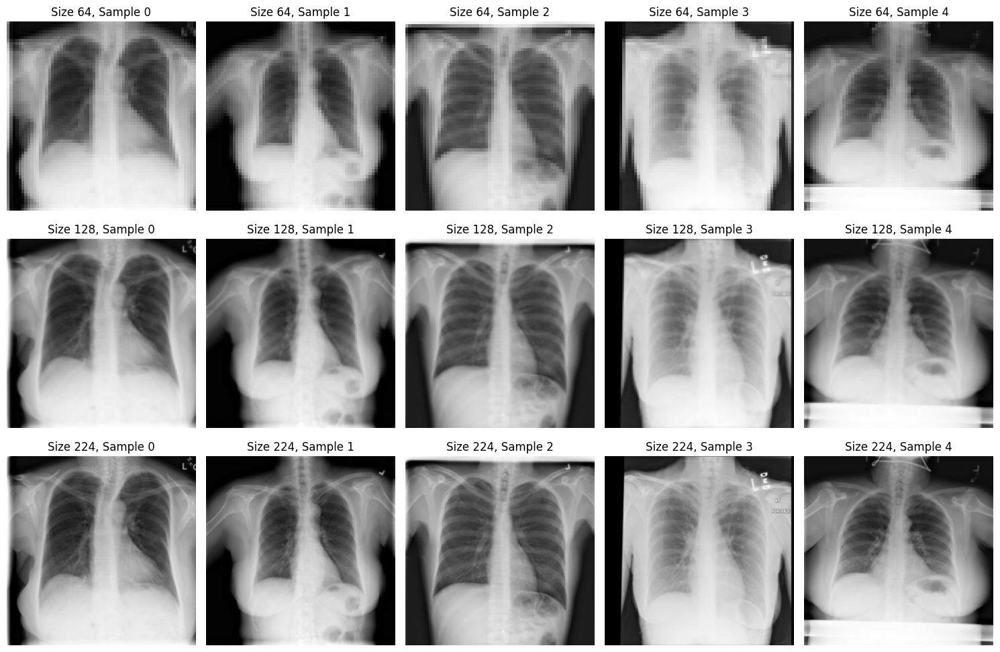

In [ ]:
fig, axes = plt.subplots(3, 5, figsize=(15, 10))

# Plot samples from size 64
for i in range(5):
    axes[0, i].imshow(train_images_64[i], cmap='gray')
    axes[0, i].set_title(f"Size 64, Sample {i}")
    axes[0,i].axis('off')

# Plot samples from size 128
for i in range(5):
    axes[1, i].imshow(train_images_128[i], cmap='gray')
    axes[1, i].set_title(f"Size 128, Sample {i}")
    axes[1,i].axis('off')

# Plot samples from size 224
for i in range(5):
    axes[2, i].imshow(train_images_224[i], cmap='gray')
    axes[2, i].set_title(f"Size 224, Sample {i}")
    axes[2,i].axis('off')

plt.tight_layout()
plt.show()

## Preprocessing

In [ ]:
# Create an instance of ImageDataGenerator with augmentations
datagen = ImageDataGenerator(
    rotation_range=360,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.1,
    horizontal_flip=True,
    featurewise_center=True,
    featurewise_std_normalization=True,
    rescale=1./255
)

datagen_val = ImageDataGenerator(rescale=1./255)

# Custom generator for multi-label data
def data_generator(images, labels, batch_size, datagen):
    while True:
        indices = np.arange(len(images))
        #np.random.shuffle(indices)

        for start in range(0, len(images), batch_size):
            end = min(start + batch_size, len(images))
            batch_indices = indices[start:end]
            batch_images = images[batch_indices]
            batch_labels = labels[batch_indices]

            augmented_images = []
            for img in batch_images:
                # Apply augmentations
                img = np.expand_dims(img, axis=-1)
                augmented = datagen.random_transform(img)
                augmented_images.append(augmented)

            # Convert to numpy arrays
            augmented_images = np.array(augmented_images)
            batch_labels = np.array(batch_labels)

            yield augmented_images, batch_labels

batch_size = 32

In [ ]:
train_generator_64 = data_generator(train_images_64, train_labels_64, batch_size, datagen)
train_generator_128 = data_generator(train_images_128, train_labels_128, batch_size,datagen)
train_generator_224 = data_generator(train_images_224, train_labels_224, batch_size, datagen)

In [ ]:
val_generator_64 = data_generator(val_images_64, val_labels_64, batch_size, datagen_val)
val_generator_128 = data_generator(val_images_128, val_labels_128, batch_size, datagen_val)
val_generator_224 = data_generator(val_images_224, val_labels_224, batch_size, datagen_val)

In [ ]:
test_generator_64 = data_generator(test_images_64, test_labels_64, batch_size, datagen_val)
test_generator_128 = data_generator(test_images_128, test_labels_128, batch_size, datagen_val)
test_generator_224 = data_generator(test_images_224, test_labels_224, batch_size, datagen_val)

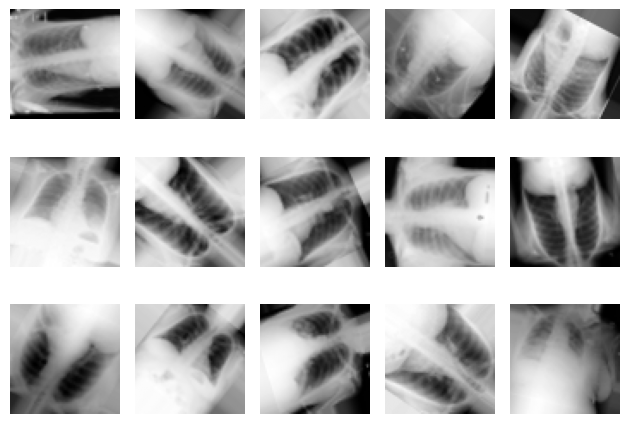

In [ ]:
def visualize_augmented_images(generator, num_images=5):
    plt.figure()
    for i in range(num_images):
        img, label = next(generator)
        ax = plt.subplot(3,5, i + 1)
        ax.imshow(img[0].reshape(64, 64), cmap='gray')
        ax.axis('off')
    plt.tight_layout()
    plt.show()


visualize_augmented_images(train_generator_64, num_images=15)


In [ ]:
labels_dict = {
    'hernia': [0,0,0,0,0,0,0,0,0,0,0,0,0,1],
    'pleural': [0,0,0,0,0,0,0,0,0,0,0,0,1,0],
    'fibrosis': [0,0,0,0,0,0,0,0,0,0,0,1,0,0],
    'emphysema': [0,0,0,0,0,0,0,0,0,0,1,0,0,0],
    'edema': [0,0,0,0,0,0,0,0,0,1,0,0,0,0],
    'consolidation': [0,0,0,0,0,0,0,0,1,0,0,0,0,0],
    'pneumothorax': [0,0,0,0,0,0,0,1,0,0,0,0,0,0],
    'pneumonia':[0,0,0,0,0,0,1,0,0,0,0,0,0,0],
    'nodule': [0,0,0,0,0,1,0,0,0,0,0,0,0,0],
    'mass': [0,0,0,0,1,0,0,0,0,0,0,0,0,0],
    "infiltration": [0,0,0,1,0,0,0,0,0,0,0,0,0,0],
    'effusion': [0,0,1,0,0,0,0,0,0,0,0,0,0,0],
    'cardiomegaly': [0,1,0,0,0,0,0,0,0,0,0,0,0,0],
    'atelectasis': [1,0,0,0,0,0,0,0,0,0,0,0,0,0],
    'normal': [0,0,0,0,0,0,0,0,0,0,0,0,0,0]
}

# Statistics of ChestX-ray14 dataset

In [ ]:
def sum_of_columns(labels):
    if isinstance(labels, list):
      labels = np.array(labels)
    return np.sum(labels, axis=0)

train_sums = sum_of_columns(train_labels_64)
val_sums = sum_of_columns(val_labels_64)
test_sums = sum_of_columns(test_labels_64)

print("Train label sums:", train_sums)
print("Validation label sums:", val_sums)
print("Test label sums:", test_sums)

Train label sums: [ 828  207  944 1388  383  423  106  368  325  159  194  111  219   14]
Validation label sums: [100  34 137 220  66  61  16  43  53  19  25  17  46   2]
Test label sums: [212  61 257 391 133 132  24 101  96  41  50  23  76   1]


In [ ]:
train_sums+val_sums+test_sums

array([1140,  302, 1338, 1999,  582,  616,  146,  512,  474,  219,  269,
        151,  341,   17], dtype=uint64)

In [ ]:
def count_all_zeros(data):
    count = 0
    for row in data:
        if np.all(row == 0):
            count += 1
    return count

train_zeros = count_all_zeros(train_labels_64)
val_zeros = count_all_zeros(val_labels_64)
test_zeros = count_all_zeros(test_labels_64)

print(f"Number of rows with all zeros in training data: {train_zeros}")
print(f"Number of rows with all zeros in validation data: {val_zeros}")
print(f"Number of rows with all zeros in test data: {test_zeros}")

total_zeros = train_zeros + val_zeros + test_zeros
print(f"Total number of rows with all zeros: {total_zeros}")

Number of rows with all zeros in training data: 4246
Number of rows with all zeros in validation data: 585
Number of rows with all zeros in test data: 1209
Total number of rows with all zeros: 6040


In [ ]:
data = [1140,  302, 1338, 1999,  582,  616,  146,  512,  474,  219,  269,
        151,  341,   17, 6040]
labels = ['atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass', 'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema', 'emphysema', 'fibrosis', 'pleural_thickening', 'hernia', 'No Finding']

total_count = len(train_images_64)+len(val_images_64)+len(test_images_64)
percentages = [(count / total_count) * 100 for count in data]

df = pd.DataFrame({'Label': labels, 'Count': data, 'Percentage': [f'{p:.2f}' for p in percentages]})

styled_df = df.style.set_properties(**{'text-align': 'center'})
styled_df = styled_df.set_table_styles([
    {'selector': 'th', 'props': [('text-align', 'center')]},
    {'selector': '', 'props': [('border', '1px solid black')]},
    {'selector': 'td', 'props': [('border', '1px solid black')]},
])
display(styled_df)

,Label,Count,Percentage
0,atelectasis,1140,10.17
1,cardiomegaly,302,2.69
2,effusion,1338,11.94
3,infiltration,1999,17.83
4,mass,582,5.19
5,nodule,616,5.50
6,pneumonia,146,1.30
7,pneumothorax,512,4.57
8,consolidation,474,4.23
9,edema,219,1.95


In [ ]:
all_labels = np.concatenate([train_labels_64, val_labels_64, test_labels_64])
n_classes = all_labels.shape[1]

co_occurrence_matrix = np.zeros((n_classes, n_classes), dtype=int)

# Calculate co-occurrence counts
for i in range(n_classes):
    for j in range(n_classes):
        co_occurrence_matrix[i, j] = np.sum(all_labels[:, i] & all_labels[:, j])

print("Co-occurrence Matrix:")
print(co_occurrence_matrix)

Co-occurrence Matrix:
[[1140   42  313  308   83   61   29   62  124   19   40   26   49    3]
 [  42  302  121   64    9    9    4    2   22   15    4    1    9    1]
 [ 313  121 1338  410  126  100   30  104  146   61   40   13   84    3]
 [ 308   64  410 1999  110  147   56   92  126   92   48   31   78    1]
 [  83    9  126  110  582   78    8   42   63   14   25    9   37    3]
 [  61    9  100  147   78  616    6   31   43   16   13   16   44    0]
 [  29    4   30   56    8    6  146    5   15   33    1    0    5    0]
 [  62    2  104   92   42   31    5  512   15    4   74    6   40    1]
 [ 124   22  146  126   63   43   15   15  474   19   11    6   27    1]
 [  19   15   61   92   14   16   33    4   19  219    1    0   11    0]
 [  40    4   40   48   25   13    1   74   11    1  269    2   17    0]
 [  26    1   13   31    9   16    0    6    6    0    2  151   17    0]
 [  49    9   84   78   37   44    5   40   27   11   17   17  341    2]
 [   3    1    3    1    3   

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
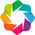

:Chord   [Source,Target]   (Value)

In [ ]:
hv.extension('bokeh')

labels = [
    "atelectasis", "cardiomegaly", "effusion", "infiltration", "mass",
    "nodule", "pneumonia", "pneumothorax", "consolidation", "edema",
    "emphysema", "fibrosis", "pleural_thickening", "hernia"
]

links = []
for i in range(len(labels)):
    for j in range(i + 1, len(labels)):  # Ensure i < j to remove duplicates
        value = co_occurrence_matrix[i, j] + co_occurrence_matrix[j, i]  # Combine both directions
        if value > 0:  # Only include non-zero connections
            links.append((labels[i], labels[j], value))

#DataFrame for links
df_links = pd.DataFrame(links, columns=["Source", "Target", "Value"])

chord = hv.Chord(df_links).opts(
    opts.Chord(
        labels='index',  \
        edge_color='Source',
        edge_cmap='Category20',
        node_color='index',
        node_cmap='Category20',
        node_size=15,
        width=600,
        height=600,
        title= " Disease Co-occurrence Diagram",
        label_text_font_size="10pt"
  )
)

hv.output(chord)

# Attention Guided CNN

## Global Branch with CNN

In [ ]:
class LogSumExpPooling2D(tf.keras.layers.Layer):
    def __init__(self, axis=(1, 2), **kwargs):
        super(LogSumExpPooling2D, self).__init__(**kwargs)
        self.axis = axis

    def call(self, inputs):
        max_val = tf.reduce_max(inputs, axis=self.axis, keepdims=True)
        logsumexp = tf.reduce_logsumexp(inputs - max_val, axis=self.axis, keepdims=False)
        return logsumexp + tf.squeeze(max_val, axis=self.axis)

    def compute_output_shape(self, input_shape):
        output_shape = list(input_shape)
        for ax in sorted(self.axis, reverse=True):
            del output_shape[ax]
        return tuple(output_shape)

In [ ]:
def create_custom_cnn(input_shape, num_classes=14):

    K.clear_session()

    inputs = layers.Input(shape=input_shape)

    # First convolutional block
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Second convolutional block
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Third convolutional block
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fourth convolutional block
    x = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)

    # Fifth convolutional block
    x = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)

    # x = layers.Conv2DTranspose(1024, (3, 3), activation='relu', strides=(2, 2), padding='same')(x)

    # Global average pooling
    x = layers.GlobalAveragePooling2D()(x)

    # Output layer for multi-label classification
    outputs = layers.Dense(num_classes, activation='sigmoid')(x)

    # Define the model
    model = models.Model(inputs, outputs)
    return model

In [ ]:
def plot_training_history(history, moving_avg_window=2):

    def moving_average(data, window_size):
        return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

    keys = history.history.keys()
    metric_pairs = [(k, f"val_{k}") for k in keys if not k.startswith('val_') and f"val_{k}" in keys]

    # Determine the layout based on the number of metrics
    n_metrics = len(metric_pairs)
    nrows = (n_metrics + 1) // 2
    ncols = 2

    plt.figure(figsize=(16, 6 * nrows))

    for i, (train_metric, val_metric) in enumerate(metric_pairs, start=1):
        # Fetch metric values
        train_values = history.history[train_metric]
        val_values = history.history[val_metric]

        plt.subplot(nrows, ncols, i)

        # Plot moving average (if window size is greater than 1)
        if moving_avg_window > 1:
            train_smoothed = moving_average(train_values, moving_avg_window)
            val_smoothed = moving_average(val_values, moving_avg_window)

            # Adjust the x-axis to align the moving average with the original data
            epochs = range(len(train_smoothed))

            plt.plot(epochs, train_smoothed, color='blue', linewidth=2, label='Train (Smoothed)')
            plt.plot(epochs, val_smoothed, color='orange', linewidth=2, label='Validation (Smoothed)')


        plt.title(f"Model {train_metric.replace('_', ' ').capitalize()}")
        plt.xlabel('Epoch')
        plt.ylabel(train_metric.capitalize())
        plt.legend(loc='upper left')
        plt.grid(color='lightgray', linestyle='-', linewidth=0.25)

    plt.tight_layout()
    plt.show()

In [ ]:
def train_and_save_cnn(loss, batch_size, num_epochs, model,
                       train_generator, val_generator, model_name='cnn_model'):
    # Compile the model
    model.compile(
        optimizer='adam',
        loss=loss,
        metrics=[
            tf.keras.metrics.BinaryAccuracy(),
            tf.keras.metrics.AUC()
        ]
    )

    model.summary()

    # Calculate steps per epoch for training and validation
    steps_per_epoch = math.ceil(len(train_images_64) / batch_size)
    validation_steps = math.ceil(len(val_images_64) / batch_size)

    # Start training the model
    start_time = time.time()

    history = model.fit(
        train_generator,
        validation_data=val_generator,
        epochs=num_epochs,
        verbose=1,
        steps_per_epoch=steps_per_epoch,
        validation_steps=validation_steps
    )

    end_time = time.time()
    elapsed_time = end_time - start_time

    # Save the training history
    history_file = f'{model_name}_history.pkl'
    with open(history_file, 'wb') as file:
        pickle.dump(history.history, file)

    # Save the model
    model_file = f'{model_name}.keras'
    model.save(model_file)

    # Check memory usage
    process = psutil.Process()
    memory_usage = process.memory_info().rss / (1024 ** 2)  # Convert bytes to MB

    print(f"Training took {elapsed_time:.2f} seconds.")
    print(f"Peak memory usage: {memory_usage:.2f} MB.")
    print(f"Model saved as '{model_file}' and history saved as '{history_file}'.")

    return model, history

In [ ]:
@tf.keras.utils.register_keras_serializable()
def weighted_cross_entropy_loss(y_true, y_pred):

    # Calculate the number of positive (1s) and negative (0s) labels in the batch
    positive_count = tf.reduce_sum(y_true, axis=0) + 1e-7  # Add small constant to avoid division by zero
    negative_count = tf.reduce_sum(1 - y_true, axis=0) + 1e-7

    # Compute the balancing factors for positive and negative samples
    beta_p = (positive_count + negative_count) / positive_count
    beta_n = (positive_count + negative_count) / negative_count

    # Compute the positive and negative parts of the loss
    positive_loss = -beta_p * y_true * tf.math.log(y_pred + 1e-7)
    negative_loss = -beta_n * (1 - y_true) * tf.math.log(1 - y_pred + 1e-7)

    # Combine the positive and negative losses
    loss = tf.reduce_mean(positive_loss + negative_loss)

    return loss

### Simple CNN - 64 - loss: Binary Cross-Entropy

In [ ]:
train_generator = data_generator(train_images_64, train_labels_64, batch_size, datagen)
val_generator = data_generator(val_images_64, val_labels_64, batch_size, datagen_val)
test_generator = data_generator(test_images_64, test_labels_64, batch_size, datagen_val)

In [ ]:
simple_model_BCE, simple_model_BCE_history = train_and_save_cnn(
    loss = 'binary_crossentropy',
    batch_size = 64,
    num_epochs = 50,
    model = create_custom_cnn(input_shape=(64, 64, 1), num_classes=14),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_BCE'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 64, 64, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 64, 64, 64)          │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 8, 8, 1024)          │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 8, 8, 1024)          │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - auc: 0.5534 - binary_accuracy: 0.7733 - loss: 0.5747 - val_auc: 0.6072 - val_binary_accuracy: 0.8761 - val_loss: 0.3321
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - auc: 0.7448 - binary_accuracy: 0.9496 - loss: 0.1799 - val_auc: 0.7353 - val_binary_accuracy: 0.9411 - val_loss: 0.1993
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - auc: 0.7603 - binary_accuracy: 0.9456 - loss: 0.1868 - val_auc: 0.7293 - val_binary_accuracy: 0.9459 - val_loss: 0.1927
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - auc: 0.7780 - binary_accuracy: 0.9485 - loss: 0.1763 - val_auc: 0.7540 - val_binary_accuracy: 0.9454 - val_loss: 0.1943
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - auc: 0.7671 - binary_accuracy: 0.9477 - loss: 0.1799 - val_auc: 0.7449 - val_binary_accuracy: 0.9485 - val_loss: 0.1874
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - auc: 0.7789 - binary_accuracy: 0.9490 - loss: 0.1742 - val_auc: 0.767

This plot is for 10% of data.

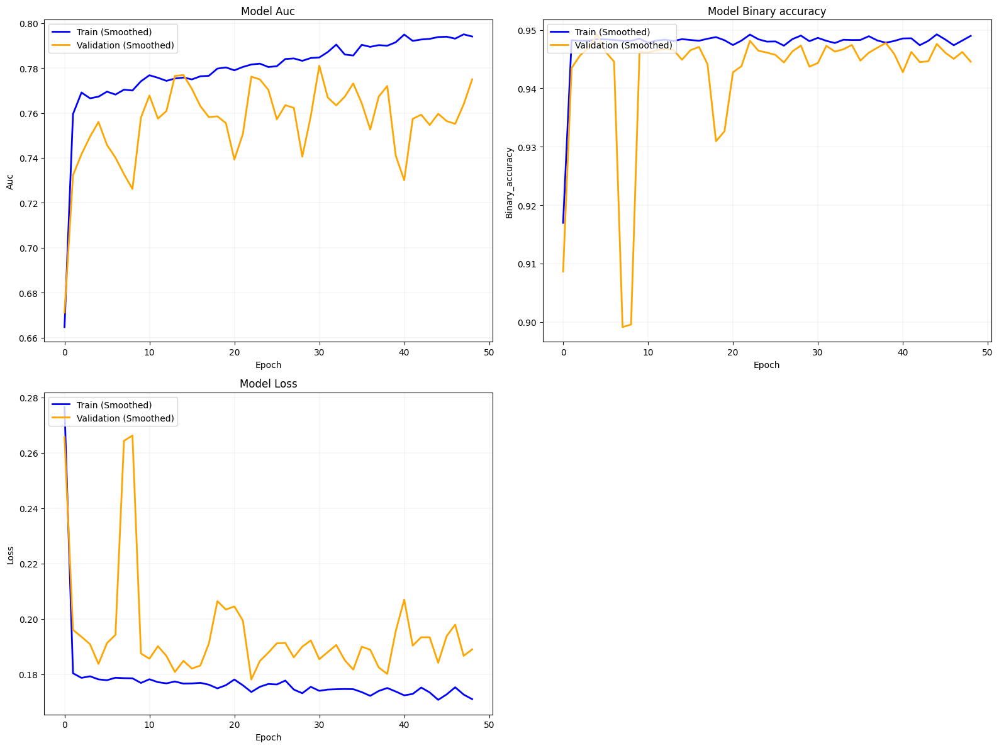

In [ ]:
plot_training_history(simple_model_BCE_history)

This plot is for all of the data.

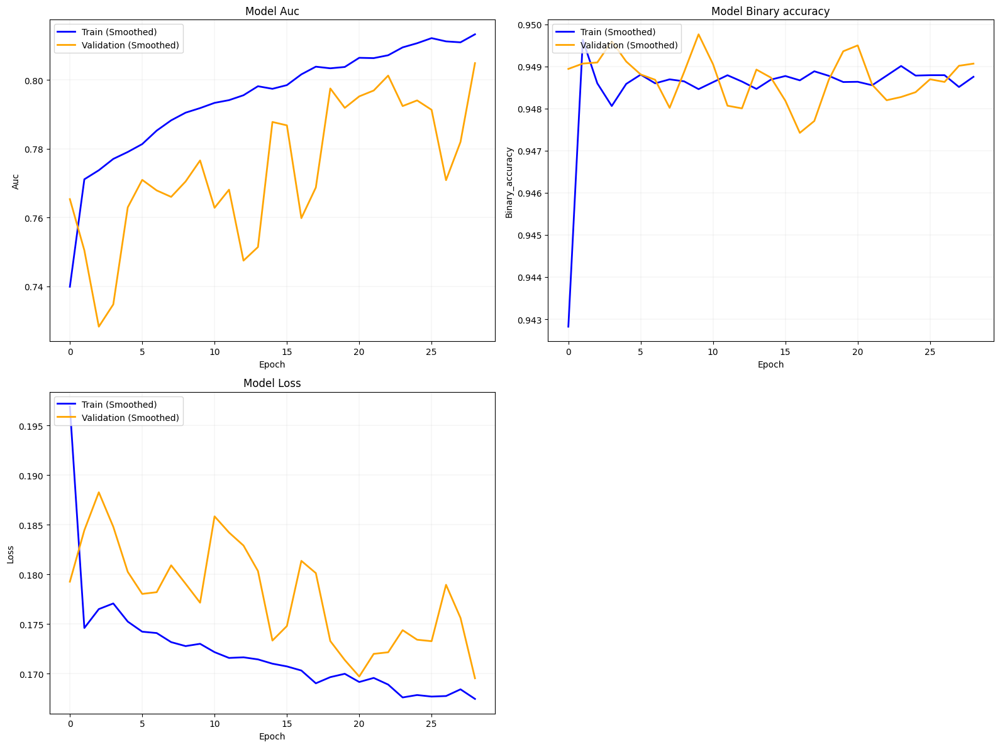

In [ ]:
plot_training_history(simple_model_BCE_history) # all data

#### Model Evaluation

In [ ]:
file_path_simple_model_BCE = '/content/drive/My Drive/ChestMNIST/simple_model_BCE.keras'
file_path_simple_model_BCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_history.pkl'
# Load the model
simple_model_BCE = load_model(file_path_simple_model_BCE)
simple_model_BCE_history = pickle.load(open(file_path_simple_model_BCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = data_generator(train_images_64, train_labels_64, batch_size, datagen)
val_generator = data_generator(val_images_64, val_labels_64, batch_size, datagen_val)
test_generator = data_generator(test_images_64, test_labels_64, batch_size, datagen_val)

35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - auc: 0.7782 - binary_accuracy: 0.9476 - loss: 0.1814
Test Loss: 0.17635540664196014
Test AUC: 0.7789982557296753
Test Binary Accuracy: 0.9491389393806458
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.19      0.53      0.27       211
      cardiomegaly       0.27      0.07      0.11        61
          effusion       0.28      0.53      0.37       255
      infiltration       0.25      0.60      0.35       391
              mass       0.12      0.20      0.15       132
            nodule       0.06      0.76      0.11       132
         pneumonia       0.03      0.08      0.04        24
      pneumothorax       0.09      0.22      0.13       101
     consolidation       0.13      0.35      0.19        95
             edema       0.07      0.51      0.12        41
         emphysema       0.07      0.08      0.08        50
          fibrosis       0.04      0.30      0.07        23
pleural_thickening       0.16      0.14      0.15        76
            hernia       0.00      0.00      0.00         1

         micro avg       0.14      0.45      0.21      1593
         macro

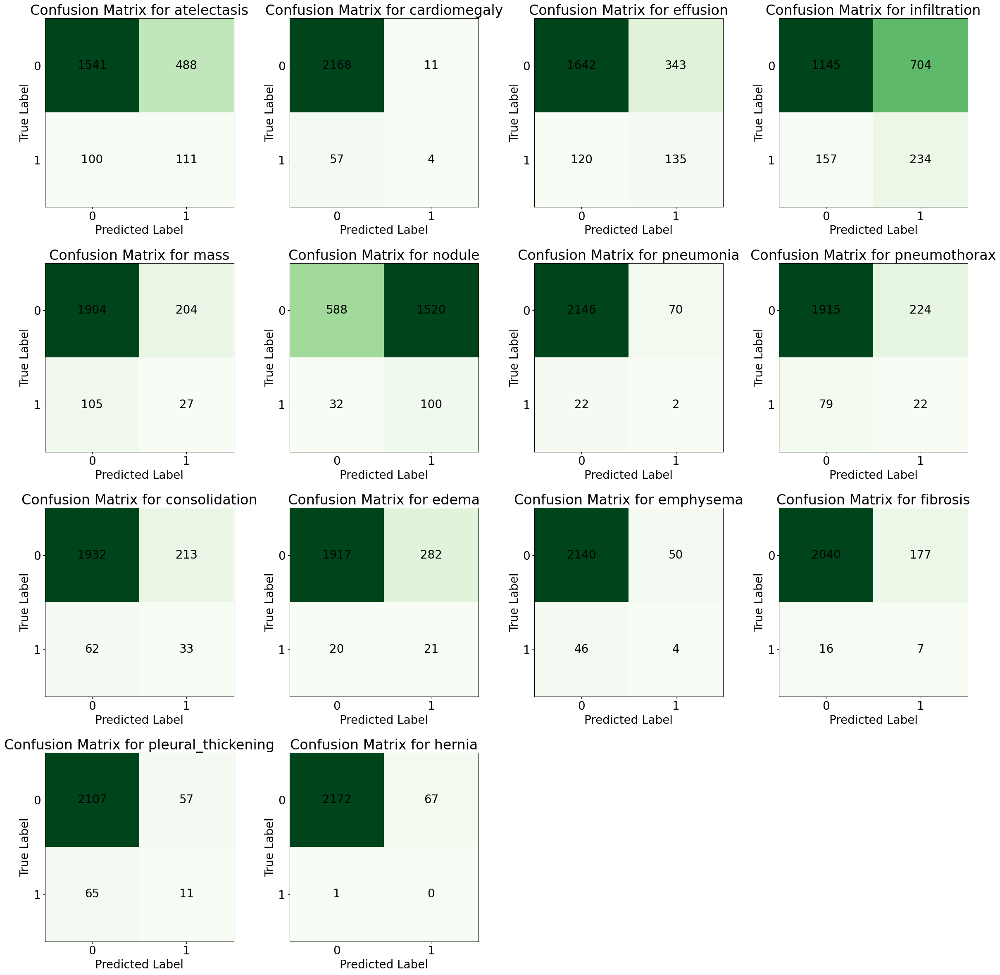

In [ ]:
from sklearn.metrics import classification_report, multilabel_confusion_matrix
from sklearn.metrics import precision_recall_curve

plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_images_64) // batch_size
evaluation = simple_model_BCE.evaluate(test_generator, steps=steps_per_epoch)

class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])
print("Test Binary Accuracy:", evaluation[1])

y_probs = simple_model_BCE.predict(test_generator, steps=steps_per_epoch)
y_true = test_labels_64

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.1411
Hamming Loss: 0.1688
Macro F1-score: 0.1532
Micro F1-score: 0.2118


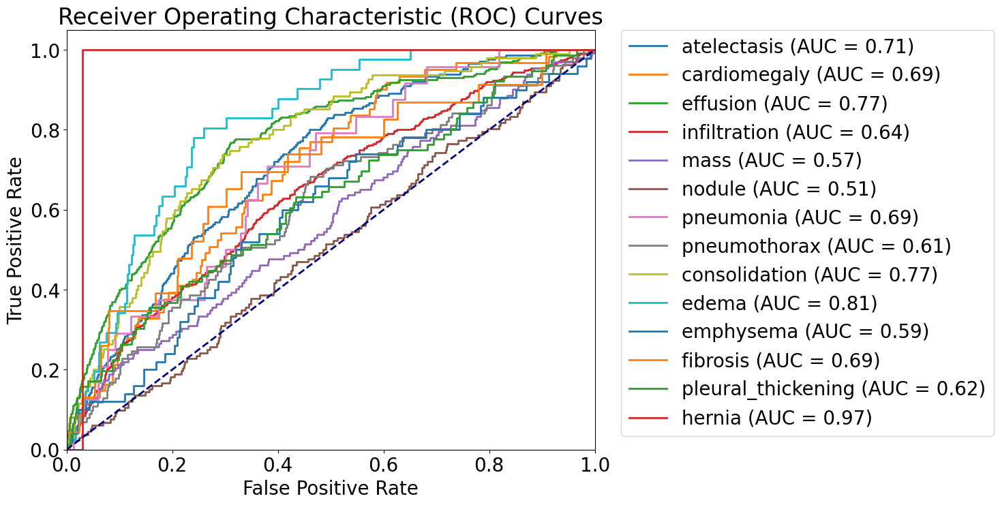

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt


fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Simple CNN - 128 - loss: Binary Cross-Entropy

In [ ]:
train_generator = data_generator(train_images_128, train_labels_128, batch_size, datagen)
val_generator = data_generator(val_images_128, val_labels_128, batch_size, datagen_val)
test_generator = data_generator(test_images_128, test_labels_128, batch_size, datagen_val)

In [ ]:
simple_model_BCE_128, simple_model_BCE_history_128 = train_and_save_cnn(
    loss = 'binary_crossentropy',
    batch_size = 64,
    num_epochs = 50,
    model = create_custom_cnn(input_shape=(128, 128, 1), num_classes=14),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_BCE_128'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 128, 128, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 44s 207ms/step - auc: 0.5494 - binary_accuracy: 0.7912 - loss: 0.5510 - val_auc: 0.6624 - val_binary_accuracy: 0.9168 - val_loss: 0.2432
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 18s 147ms/step - auc: 0.7466 - binary_accuracy: 0.9480 - loss: 0.1832 - val_auc: 0.7305 - val_binary_accuracy: 0.9463 - val_loss: 0.1981
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - auc: 0.7598 - binary_accuracy: 0.9487 - loss: 0.1797 - val_auc: 0.7450 - val_binary_accuracy: 0.9459 - val_loss: 0.1890
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 9s 76ms/step - auc: 0.7663 - binary_accuracy: 0.9488 - loss: 0.1785 - val_auc: 0.7551 - val_binary_accuracy: 0.9436 - val_loss: 0.1926
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - auc: 0.7653 - binary_accuracy: 0.9488 - loss: 0.1779 - val_auc: 0.7581 - val_binary_accuracy: 0.9459 - val_loss: 0.1867
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - auc: 0.7620 - binary_accuracy: 0.9486 - loss: 0.1798 - val_auc:

In [ ]:
file_path_simple_model_BCE = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_128.keras'
file_path_simple_model_BCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_history_128.pkl'
# Load the model
simple_model_BCE_128 = load_model(file_path_simple_model_BCE)
simple_model_BCE_history_128 = pickle.load(open(file_path_simple_model_BCE_history, 'rb'))

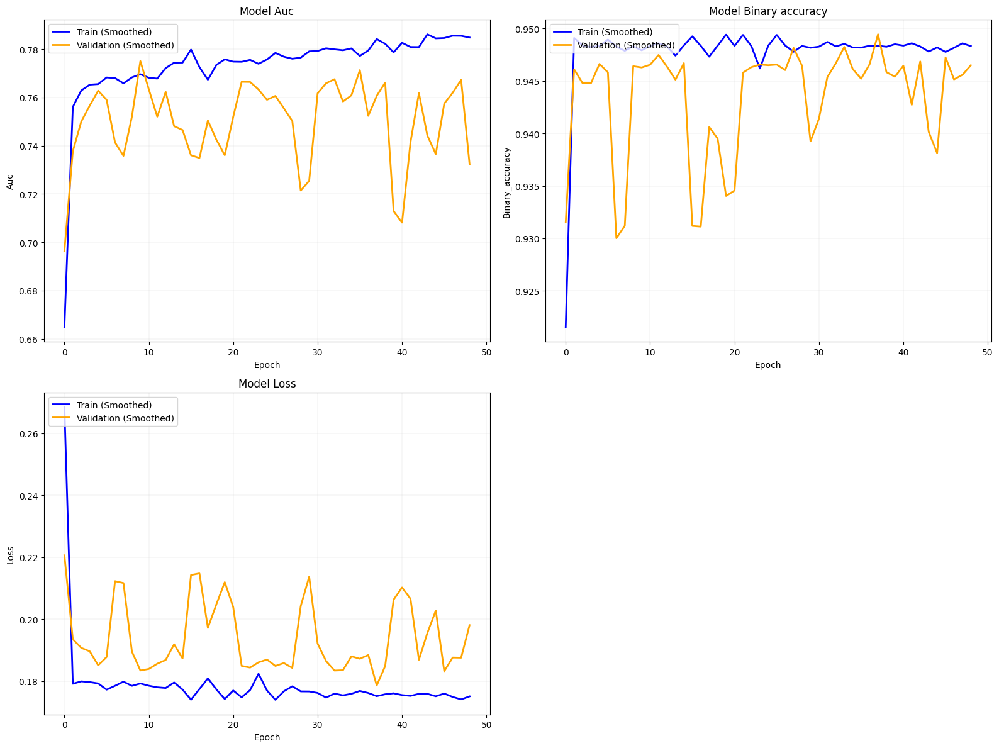

In [ ]:
plot_training_history(simple_model_BCE_history_128)

#### Model Evaluation

In [ ]:
file_path_simple_model_BCE = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_128.keras'
file_path_simple_model_BCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_128_history.pkl'
# Load the model
simple_model_BCE_128 = load_model(file_path_simple_model_BCE)
simple_model_BCE_128_history = pickle.load(open(file_path_simple_model_BCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = data_generator(train_images_128, train_labels_128, batch_size, datagen)
val_generator = data_generator(val_images_128, val_labels_128, batch_size, datagen_val)
test_generator = data_generator(test_images_128, test_labels_128, batch_size, datagen_val)

35/35 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - auc: 0.7008 - binary_accuracy: 0.9475 - loss: 0.2070
Test Loss: 0.2013312727212906
Test AUC: 0.7036873698234558
Test Binary Accuracy: 0.9490753412246704
35/35 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step
Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.13      0.54      0.21       211
      cardiomegaly       0.12      0.11      0.12        61
          effusion       0.20      0.56      0.30       255
      infiltration       0.25      0.52      0.34       391
              mass       0.07      0.42      0.12       132
            nodule       0.08      0.55      0.14       132
         pneumonia       0.04      0.04      0.04        24
      pneumothorax       0.09      0.27      0.14       101
     consolidation       0.12      0.55      0.19        95
             edema       0.11      0.12      0.12        41
         emphysema       0.03      0.42      0.06        50
          fibrosis  

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


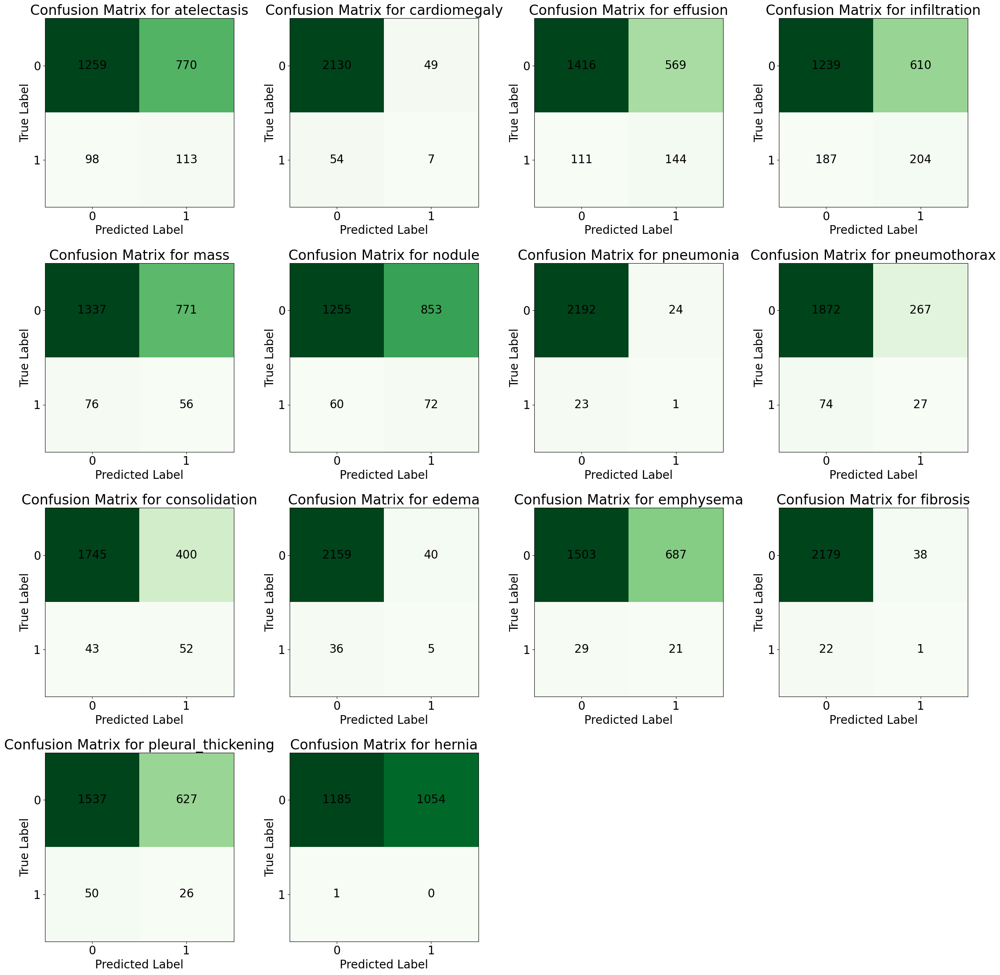

In [ ]:
from sklearn.metrics import classification_report, multilabel_confusion_matrix
from sklearn.metrics import precision_recall_curve

plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_images_128) // batch_size
evaluation = simple_model_BCE_128.evaluate(test_generator, steps=steps_per_epoch)

class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])
print("Test Binary Accuracy:", evaluation[1])

y_probs = simple_model_BCE_128.predict(test_generator, steps=steps_per_epoch)
y_true = test_labels_128

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.0281
Hamming Loss: 0.2431
Macro F1-score: 0.1327
Micro F1-score: 0.1606


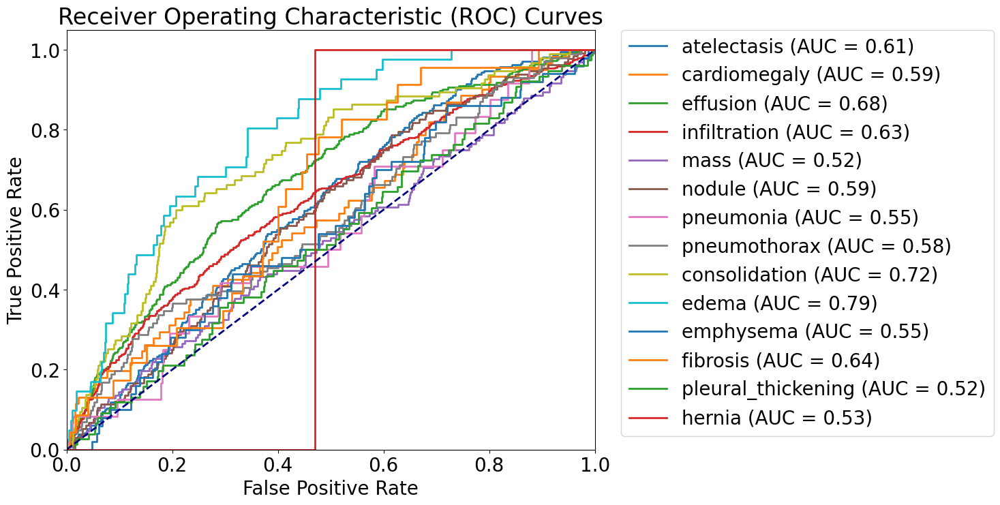

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt


fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Simple CNN - 224 - loss: Binary Cross-Entropy

In [ ]:
train_generator = data_generator(train_images_224, train_labels_224, batch_size, datagen)
val_generator = data_generator(val_images_224, val_labels_224, batch_size, datagen_val)
test_generator = data_generator(test_images_224, test_labels_224, batch_size, datagen_val)

In [ ]:
simple_model_BCE_224, simple_model_BCE_history_224 = train_and_save_cnn(
    loss = 'binary_crossentropy',
    batch_size = 64,
    num_epochs = 50,
    model = create_custom_cnn(input_shape=(224, 224, 1), num_classes=14),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_BCE_224'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 224, 224, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 224, 224, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 112, 112, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 56, 56, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 28, 28, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 28, 28, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 28, 28, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 69s 335ms/step - auc: 0.5467 - binary_accuracy: 0.8220 - loss: 0.5105 - val_auc: 0.6462 - val_binary_accuracy: 0.9468 - val_loss: 0.2212
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 51s 414ms/step - auc: 0.7492 - binary_accuracy: 0.9468 - loss: 0.1865 - val_auc: 0.7315 - val_binary_accuracy: 0.9457 - val_loss: 0.1928
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 36s 291ms/step - auc: 0.7621 - binary_accuracy: 0.9483 - loss: 0.1799 - val_auc: 0.7254 - val_binary_accuracy: 0.9180 - val_loss: 0.2315
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 35s 284ms/step - auc: 0.7635 - binary_accuracy: 0.9468 - loss: 0.1831 - val_auc: 0.7094 - val_binary_accuracy: 0.9488 - val_loss: 0.1892
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - auc: 0.7541 - binary_accuracy: 0.9495 - loss: 0.1785 - val_auc: 0.7641 - val_binary_accuracy: 0.9466 - val_loss: 0.1850
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 28s 226ms/step - auc: 0.7575 - binary_accuracy: 0.9498 - loss: 0.1771 - val

In [ ]:
file_path_simple_model_BCE = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_224.keras'
file_path_simple_model_BCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_history_224.pkl'
# Load the model
simple_model_BCE_224 = load_model(file_path_simple_model_BCE)
simple_model_BCE_history_224 = pickle.load(open(file_path_simple_model_BCE_history, 'rb'))

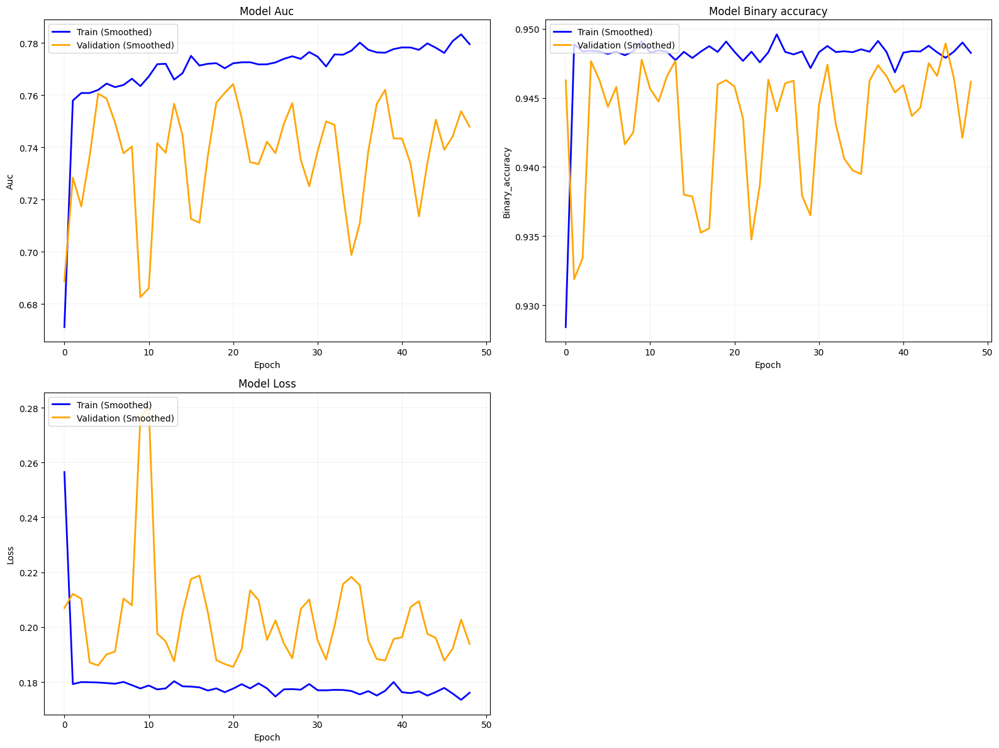

In [ ]:
plot_training_history(simple_model_BCE_history_224)

#### Model Evaluation

In [ ]:
file_path_simple_model_BCE = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_224.keras'
file_path_simple_model_BCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_224_history.pkl'
# Load the model
simple_model_BCE_224 = load_model(file_path_simple_model_BCE)
simple_model_BCE_224_history = pickle.load(open(file_path_simple_model_BCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = data_generator(train_images_224, train_labels_224, batch_size, datagen)
val_generator = data_generator(val_images_224, val_labels_224, batch_size, datagen_val)
test_generator = data_generator(test_images_224, test_labels_224, batch_size, datagen_val)

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 121ms/step - auc: 0.7551 - binary_accuracy: 0.9473 - loss: 0.1845
Test Loss: 0.17960263788700104
Test AUC: 0.7566105723381042
Test Binary Accuracy: 0.9490114450454712
35/35 ━━━━━━━━━━━━━━━━━━━━ 5s 122ms/step
Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.15      0.61      0.24       211
      cardiomegaly       0.05      0.38      0.08        61
          effusion       0.19      0.59      0.29       255
      infiltration       0.22      0.71      0.34       391
              mass       0.06      0.68      0.12       132
            nodule       0.07      0.49      0.12       132
         pneumonia       0.00      0.00      0.00        24
      pneumothorax       0.07      0.24      0.11       101
     consolidation       0.10      0.43      0.16        95
             edema       0.06      0.41      0.11        41
         emphysema       0.06      0.10      0.08        50
          fibros

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


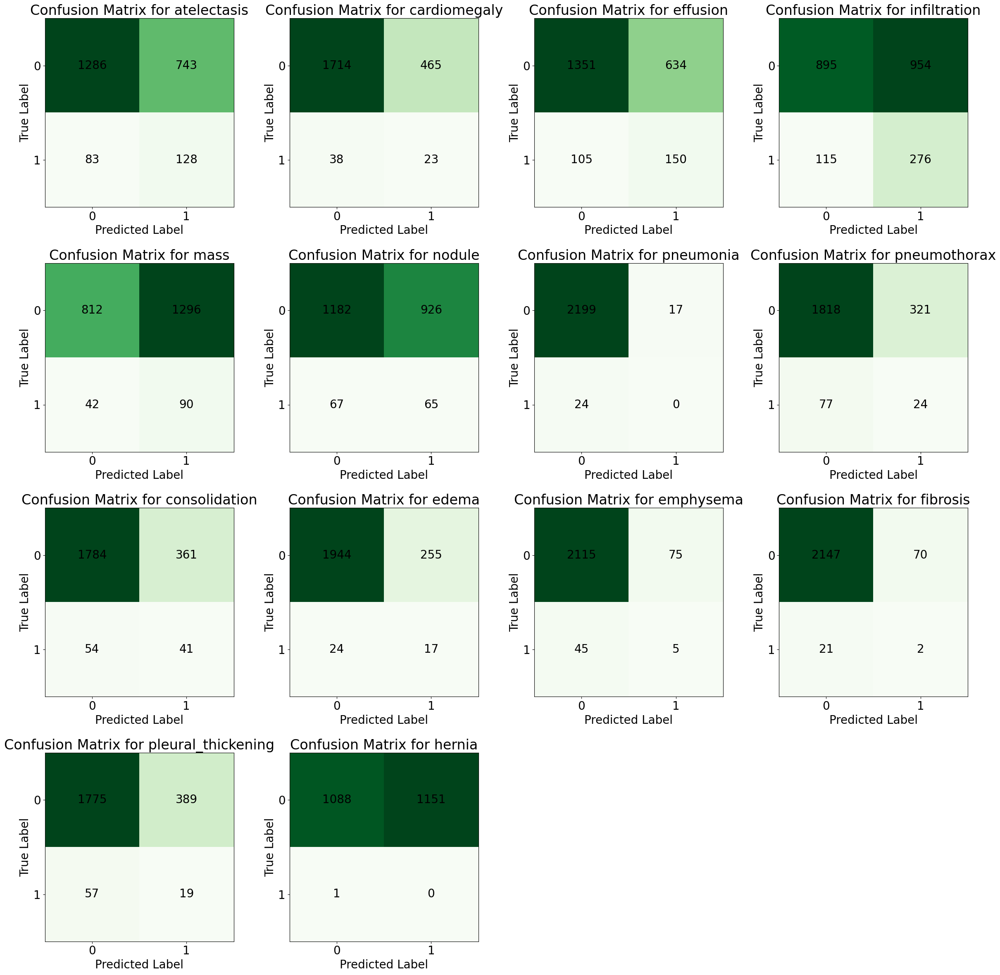

In [ ]:
from sklearn.metrics import classification_report, multilabel_confusion_matrix
from sklearn.metrics import precision_recall_curve

plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_images_224) // batch_size
evaluation = simple_model_BCE_224.evaluate(test_generator, steps=steps_per_epoch)

class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])
print("Test Binary Accuracy:", evaluation[1])

# Generate raw predictions
y_probs = simple_model_BCE_224.predict(test_generator, steps=steps_per_epoch)
y_true = test_labels_224  # True labels (multi-label ground truth)

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.0737
Hamming Loss: 0.2682
Macro F1-score: 0.1259
Micro F1-score: 0.1665


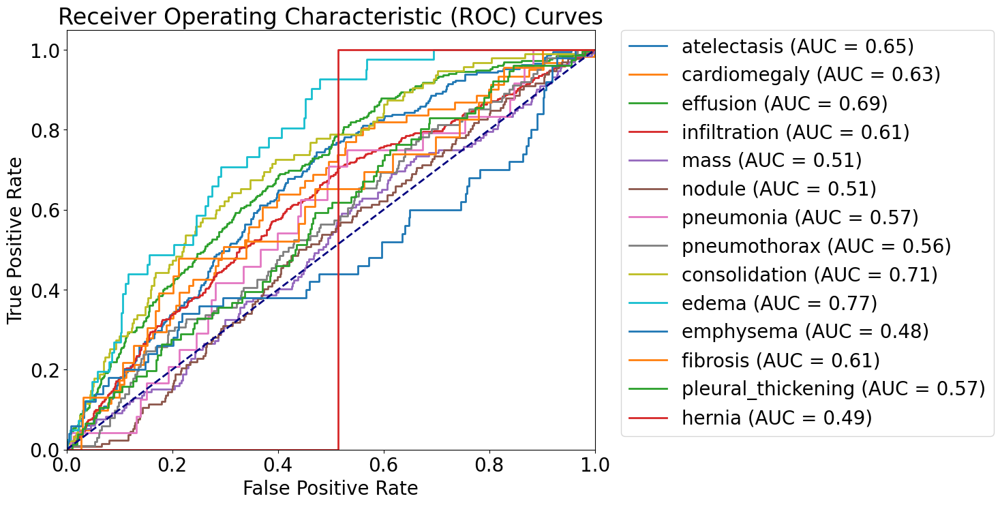

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt


fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Simple CNN - 64 - loss: Weighted Cross-Entropy

In [ ]:
train_generator = data_generator(train_images_64, train_labels_64, batch_size, datagen)
val_generator = data_generator(val_images_64, val_labels_64, batch_size, datagen_val)
test_generator = data_generator(test_images_64, test_labels_64, batch_size, datagen_val)

In [ ]:
simple_model_WCE, simple_model_WCE_history = train_and_save_cnn(
    loss = weighted_cross_entropy_loss,
    batch_size = 64,
    num_epochs = 50,
    model = create_custom_cnn(input_shape=(64, 64, 1), num_classes=14),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_WCE'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 64, 64, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 64, 64, 64)          │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 8, 8, 1024)          │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 8, 8, 1024)          │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - auc: 0.5700 - binary_accuracy: 0.6114 - loss: 1.3685 - val_auc: 0.6143 - val_binary_accuracy: 0.7636 - val_loss: 1.1536
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - auc: 0.6977 - binary_accuracy: 0.8085 - loss: 1.0465 - val_auc: 0.6636 - val_binary_accuracy: 0.7098 - val_loss: 1.1915
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - auc: 0.7037 - binary_accuracy: 0.8043 - loss: 1.0502 - val_auc: 0.6479 - val_binary_accuracy: 0.7037 - val_loss: 1.1021
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - auc: 0.7212 - binary_accuracy: 0.8052 - loss: 1.0619 - val_auc: 0.6401 - val_binary_accuracy: 0.8109 - val_loss: 1.2489
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - auc: 0.7213 - binary_accuracy: 0.8058 - loss: 1.0291 - val_auc: 0.5982 - val_binary_accuracy: 0.8332 - val_loss: 1.1787
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - auc: 0.7207 - binary_accuracy: 0.8068 - loss: 1.0245 - val_auc: 0.692

This plot is for 10% of the data.

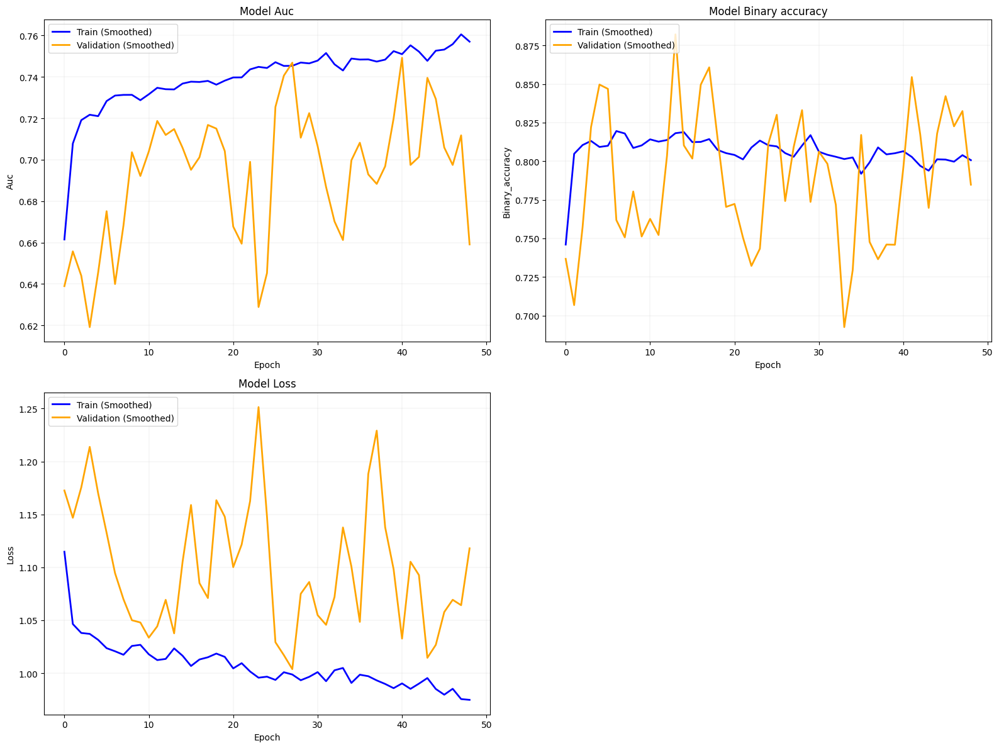

In [ ]:
plot_training_history(simple_model_WCE_history)

This plot is for all of the data.

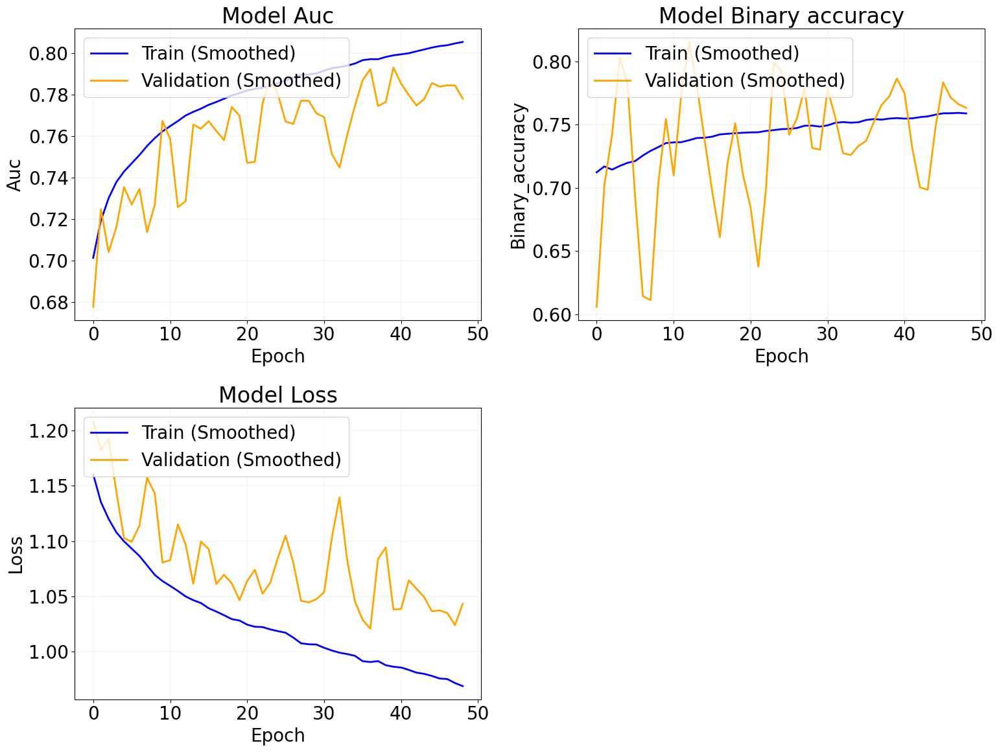

In [ ]:
plot_training_history(simple_model_WCE_history) # all data

#### Model Evaluation

In [ ]:
file_path_simple_model_WCE = '/content/drive/My Drive/ChestMNIST/simple_model_WCE.keras'
file_path_simple_model_WCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_history.pkl'
# Load the model
simple_model_WCE = load_model(file_path_simple_model_WCE,
                              custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})
simple_model_WCE_history = pickle.load(open(file_path_simple_model_WCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = data_generator(train_images_64, train_labels_64, batch_size, datagen)
val_generator = data_generator(val_images_64, val_labels_64, batch_size, datagen_val)
test_generator = data_generator(test_images_64, test_labels_64, batch_size, datagen_val)

35/35 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - auc: 0.6165 - binary_accuracy: 0.7237 - loss: 1.2616
Test Loss: 1.2523093223571777
Test AUC: 0.6187196969985962
Test Binary Accuracy: 0.7266581654548645
35/35 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.09      1.00      0.17       211
      cardiomegaly       0.10      0.08      0.09        61
          effusion       0.15      0.64      0.24       255
      infiltration       0.26      0.45      0.33       391
              mass       0.13      0.11      0.12       132
            nodule       0.06      0.98      0.11       132
         pneumonia       0.02      0.25      0.03        24
      pneumothorax       0.06      0.31      0.10       101
     consolidation       0.13      0.31      0.18        95
             edema       0.07      0.34      0.11        41
         emphysema       0.03      0.26      0.06        50
          fibrosis       0.02      0.13      0.04        23
pleural_thickening       0.04      0.39      0.08        76
            hernia       0.00      0.00      0.00         1

         micro avg       0.09      0.52      0.15      1593
         macro

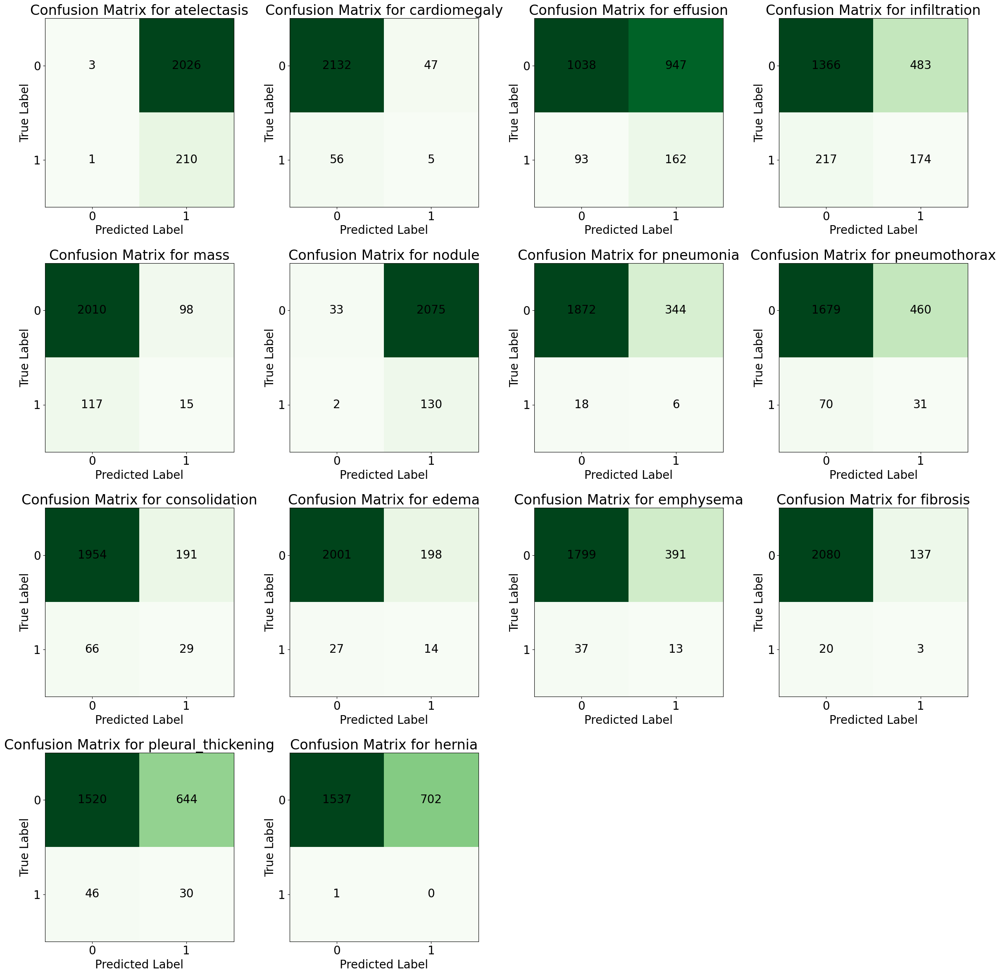

In [ ]:
from sklearn.metrics import classification_report, multilabel_confusion_matrix
from sklearn.metrics import precision_recall_curve


plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_images_64) // batch_size
evaluation = simple_model_WCE.evaluate(test_generator, steps=steps_per_epoch)

class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])
print("Test Binary Accuracy:", evaluation[1])

# Generate raw predictions
y_probs = simple_model_WCE.predict(test_generator, steps=steps_per_epoch)
y_true = test_labels_64  # True labels (multi-label ground truth)

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.0004
Hamming Loss: 0.3034
Macro F1-score: 0.1192
Micro F1-score: 0.1473


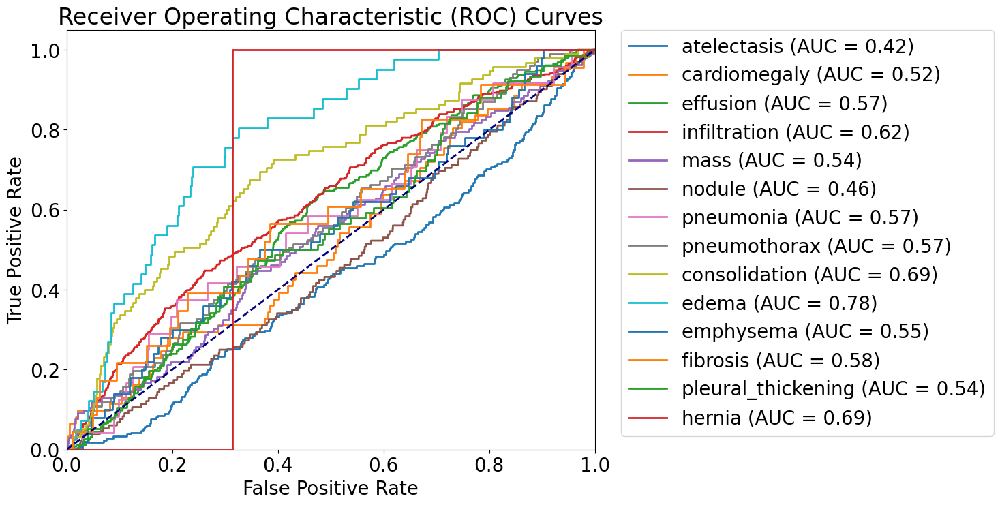

In [ ]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Simple CNN - 128 - loss: Weighted Cross-Entropy

In [ ]:
train_generator = data_generator(train_images_128, train_labels_128, batch_size, datagen)
val_generator = data_generator(val_images_128, val_labels_128, batch_size, datagen_val)
test_generator = data_generator(test_images_128, test_labels_128, batch_size, datagen_val)

In [ ]:
simple_model_WCE_128, simple_model_WCE_history_128 = train_and_save_cnn(
    loss = weighted_cross_entropy_loss,
    batch_size = 64,
    num_epochs = 50,
    model = create_custom_cnn(input_shape=(128, 128, 1), num_classes=14),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_WCE_128'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 128, 128, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - auc: 0.5819 - binary_accuracy: 0.6250 - loss: 1.2755 - val_auc: 0.5764 - val_binary_accuracy: 0.6845 - val_loss: 1.1458
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 14s 118ms/step - auc: 0.7037 - binary_accuracy: 0.7950 - loss: 1.0266 - val_auc: 0.5222 - val_binary_accuracy: 0.7615 - val_loss: 1.4595
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - auc: 0.7142 - binary_accuracy: 0.8188 - loss: 1.0449 - val_auc: 0.6481 - val_binary_accuracy: 0.6879 - val_loss: 1.1505
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - auc: 0.7047 - binary_accuracy: 0.8013 - loss: 1.0553 - val_auc: 0.7129 - val_binary_accuracy: 0.7490 - val_loss: 1.0233
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - auc: 0.7274 - binary_accuracy: 0.8309 - loss: 1.0443 - val_auc: 0.7406 - val_binary_accuracy: 0.8374 - val_loss: 1.0327
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - auc: 0.7305 - binary_accuracy: 0.8084 - loss: 1.0227 - val_auc:

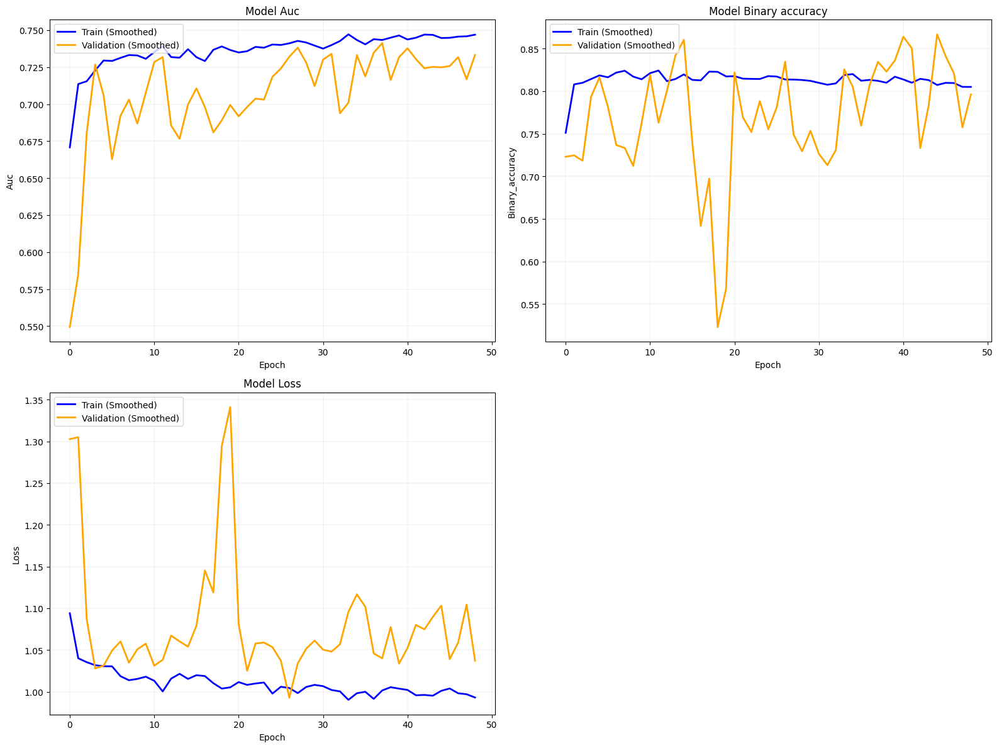

In [ ]:
plot_training_history(simple_model_WCE_history_128)

#### Model Evaluation

In [ ]:
file_path_simple_model_WCE = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_128.keras'
file_path_simple_model_WCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_128_history.pkl'
# Load the model
simple_model_WCE_128 = load_model(file_path_simple_model_WCE,
                              custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})
simple_model_WCE_128_history = pickle.load(open(file_path_simple_model_WCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = data_generator(train_images_128, train_labels_128, batch_size, datagen)
val_generator = data_generator(val_images_128, val_labels_128, batch_size, datagen_val)
test_generator = data_generator(test_images_128, test_labels_128, batch_size, datagen_val)

35/35 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - auc: 0.7321 - binary_accuracy: 0.8555 - loss: 1.1810
Test Loss: 1.1799098253250122
Test AUC: 0.7340186238288879
Test Binary Accuracy: 0.8544005751609802
35/35 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.18      0.45      0.26       211
      cardiomegaly       0.07      0.34      0.12        61
          effusion       0.21      0.67      0.32       255
      infiltration       0.26      0.52      0.34       391
              mass       0.07      0.46      0.12       132
            nodule       0.08      0.57      0.13       132
         pneumonia       0.04      0.08      0.05        24
      pneumothorax       0.18      0.11      0.13       101
     consolidation       0.11      0.39      0.17        95
             edema       0.06      0.20      0.09        41
         emphysema       0.05      0.08      0.06        50
          fibrosis       0.02      0.09      0.04        23
pleural_thickening       0.06      0.17      0.08        76
            hernia       0.00      0.00      0.00         1

         micro avg       0.13      0.44      0.20      1593
         macro

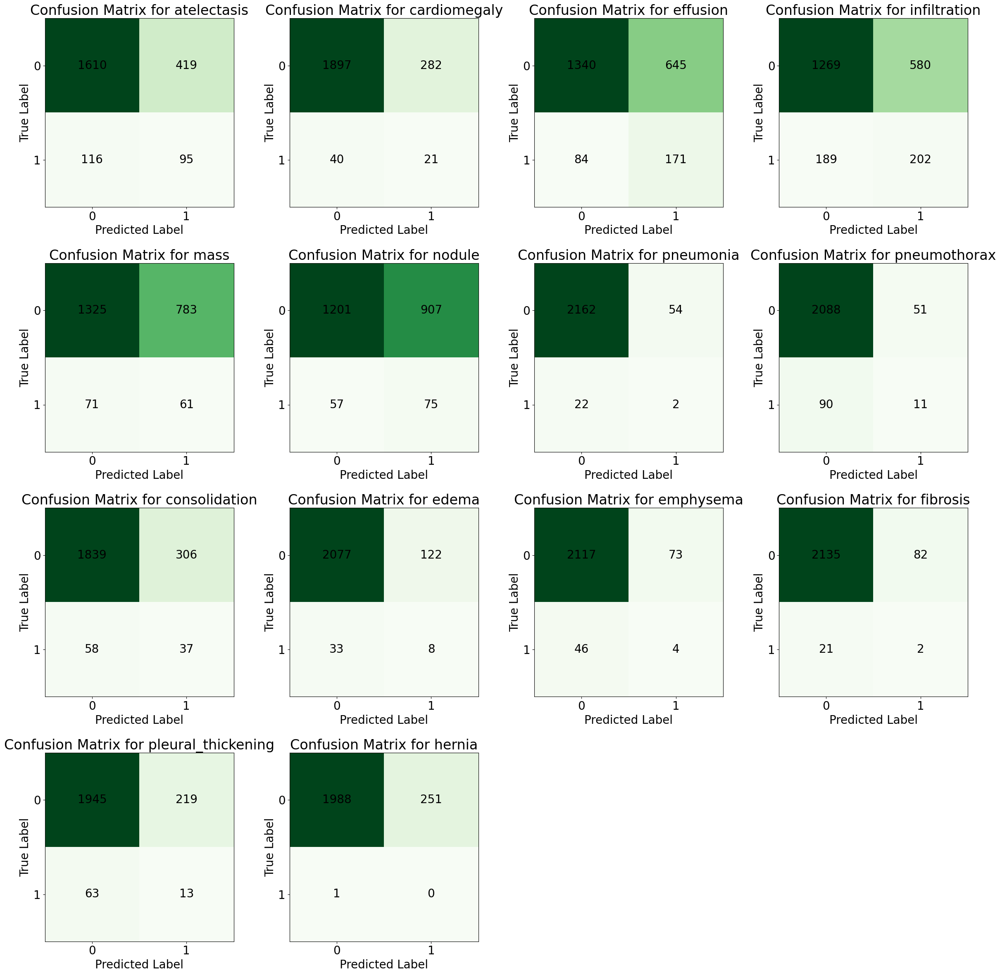

In [ ]:
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_images_128) // batch_size
evaluation = simple_model_WCE_128.evaluate(test_generator, steps=steps_per_epoch)

class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])  # Update to include AUC if available
print("Test Binary Accuracy:", evaluation[1])  # Update if binary accuracy is included

# Generate raw predictions
y_probs = simple_model_WCE_128.predict(test_generator, steps=steps_per_epoch)
y_true = test_labels_128  # True labels (multi-label ground truth)

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.1580
Hamming Loss: 0.1806
Macro F1-score: 0.1381
Micro F1-score: 0.1986


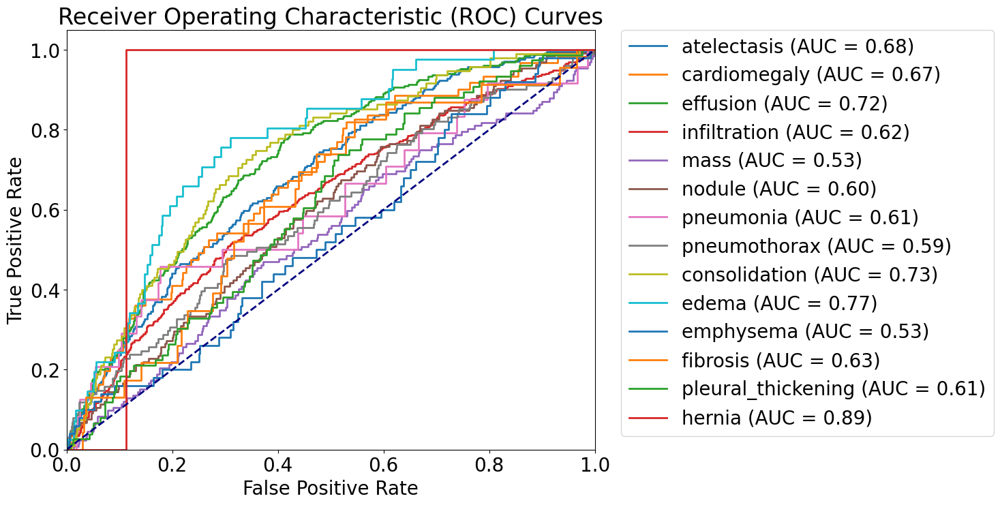

In [ ]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Simple CNN - 224 - loss: Weighted Cross-Entropy

In [ ]:
train_generator = data_generator(train_images_224, train_labels_224, batch_size, datagen)
val_generator = data_generator(val_images_224, val_labels_224, batch_size, datagen_val)
test_generator = data_generator(test_images_224, test_labels_224, batch_size, datagen_val)

In [ ]:
simple_model_WCE_224, simple_model_WCE_history_224 = train_and_save_cnn(
    loss = weighted_cross_entropy_loss,
    batch_size = 64,
    num_epochs = 50,
    model = create_custom_cnn(input_shape=(224, 224, 1), num_classes=14),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_WCE_224'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 224, 224, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 224, 224, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 112, 112, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 56, 56, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 28, 28, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 28, 28, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 28, 28, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 41s 255ms/step - auc: 0.5887 - binary_accuracy: 0.6135 - loss: 1.2146 - val_auc: 0.4965 - val_binary_accuracy: 0.7137 - val_loss: 2.2537
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 34s 280ms/step - auc: 0.7022 - binary_accuracy: 0.7992 - loss: 1.0612 - val_auc: 0.6398 - val_binary_accuracy: 0.7609 - val_loss: 1.2893
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - auc: 0.7113 - binary_accuracy: 0.7938 - loss: 1.0489 - val_auc: 0.6132 - val_binary_accuracy: 0.6344 - val_loss: 1.1826
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 27s 223ms/step - auc: 0.7035 - binary_accuracy: 0.8088 - loss: 1.0329 - val_auc: 0.4827 - val_binary_accuracy: 0.5805 - val_loss: 3.3257
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - auc: 0.6995 - binary_accuracy: 0.7941 - loss: 1.0500 - val_auc: 0.6240 - val_binary_accuracy: 0.8214 - val_loss: 1.1024
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 27s 222ms/step - auc: 0.7083 - binary_accuracy: 0.7880 - loss: 1.0403 - val

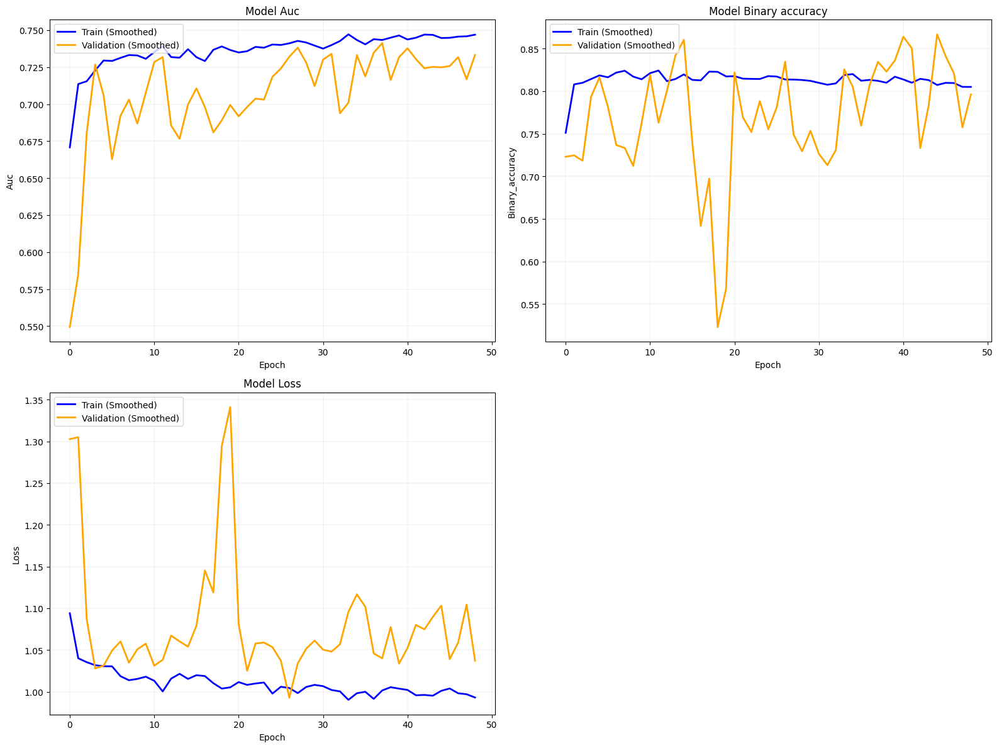

In [ ]:
plot_training_history(simple_model_WCE_history_224)

#### Model Evaluation

In [ ]:
file_path_simple_model_WCE = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_224.keras'
file_path_simple_model_WCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_224_history.pkl'
# Load the model
simple_model_WCE_224 = load_model(file_path_simple_model_WCE,
                                  custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})
simple_model_WCE_224_history = pickle.load(open(file_path_simple_model_WCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = data_generator(train_images_224, train_labels_224, batch_size, datagen)
val_generator = data_generator(val_images_224, val_labels_224, batch_size, datagen_val)
test_generator = data_generator(test_images_224, test_labels_224, batch_size, datagen_val)

35/35 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - auc: 0.6722 - binary_accuracy: 0.6341 - loss: 1.1993
Test Loss: 1.2041645050048828
Test AUC: 0.6779339909553528
Test Binary Accuracy: 0.6360969543457031
35/35 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step
Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.11      0.64      0.18       211
      cardiomegaly       0.04      0.38      0.07        61
          effusion       0.15      0.48      0.23       255
      infiltration       0.20      0.79      0.31       391
              mass       0.09      0.31      0.14       132
            nodule       0.08      0.56      0.15       132
         pneumonia       0.00      0.00      0.00        24
      pneumothorax       0.16      0.21      0.18       101
     consolidation       0.14      0.33      0.20        95
             edema       0.07      0.24      0.11        41
         emphysema       0.09      0.04      0.05        50
          fibrosi

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


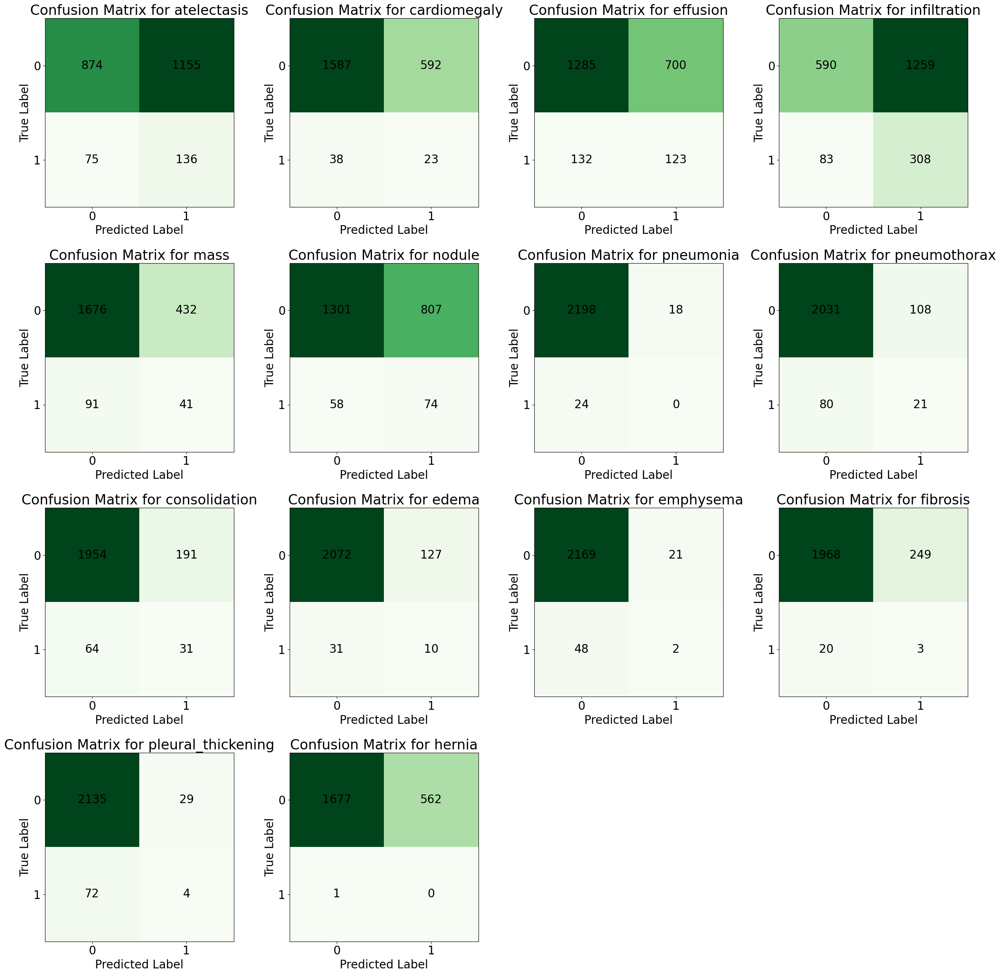

In [ ]:
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_images_224) // batch_size
evaluation = simple_model_WCE_224.evaluate(test_generator, steps=steps_per_epoch)


class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])
print("Test Binary Accuracy:", evaluation[1])

# Generate raw predictions
y_probs = simple_model_WCE_224.predict(test_generator, steps=steps_per_epoch)
y_true = test_labels_224  # True labels (multi-label ground truth)

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.0299
Hamming Loss: 0.2254
Macro F1-score: 0.1224
Micro F1-score: 0.1801


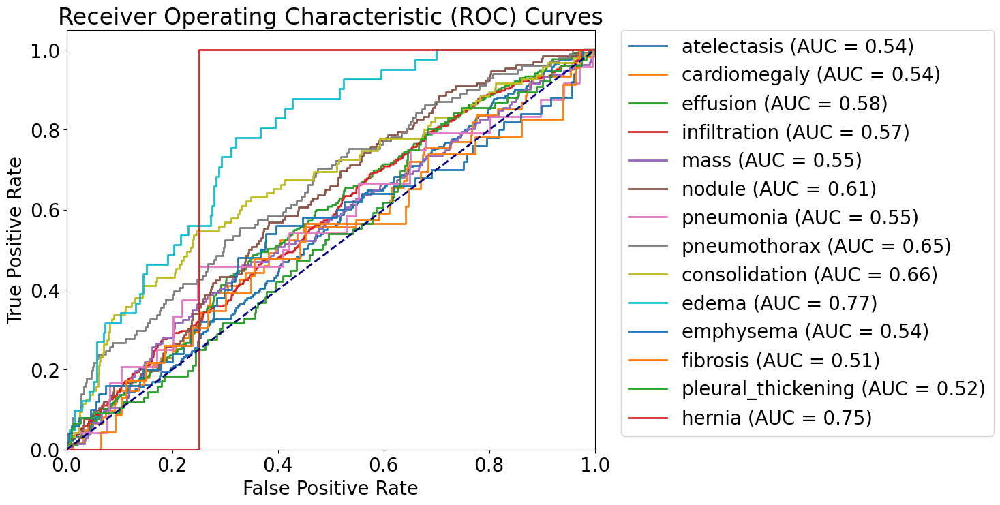

In [ ]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


## ResNet-50 - 224 - WCE

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, models

def create_resnet_model(input_shape, num_classes=14):

    K.clear_session()

    base_model = ResNet50(include_top=True, weights="imagenet", input_shape=(input_shape[0], input_shape[1], 3))

    # Convert grayscale input to 3 channels by repeating across channels
    inputs = layers.Input(shape=(input_shape[0], input_shape[1], 1))
    x = layers.Conv2D(3, (1, 1), padding="same")(inputs)
    x = base_model(x)

    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)

    outputs = layers.Dense(num_classes, activation='sigmoid')(x)

    model = models.Model(inputs=inputs, outputs=outputs)

    return model

In [ ]:
train_generator = data_generator(train_images_224, train_labels_224, batch_size, datagen)
val_generator = data_generator(val_images_224, val_labels_224, batch_size, datagen_val)
test_generator = data_generator(test_images_224, test_labels_224, batch_size, datagen_val)

In [ ]:
resnet_BCE, resnet_BCE_history = train_and_save_cnn(
    loss = weighted_cross_entropy_loss,
    batch_size = 64,
    num_epochs = 10,
    model = create_resnet_model(input_shape=(224, 224, 1), num_classes=14),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'resnet_BCE'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 224, 224, 3)         │               6 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50 (Functional)                │ (None, 1000)                │      25,636,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 1000)                │           4,000 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1000)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,014 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,654,732 (97.87 MB)

 Trainable params: 25,599,612 (97.65 MB)

 Non-trainable params: 55,120 (215.31 KB)

Epoch 1/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 115s 336ms/step - auc: 0.6318 - binary_accuracy: 0.7577 - loss: 1.1047 - val_auc: 0.7129 - val_binary_accuracy: 0.8312 - val_loss: 1.1037
Epoch 2/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 80s 650ms/step - auc: 0.7276 - binary_accuracy: 0.8649 - loss: 1.0468 - val_auc: 0.7504 - val_binary_accuracy: 0.8087 - val_loss: 1.0458
Epoch 3/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 36s 297ms/step - auc: 0.7367 - binary_accuracy: 0.8855 - loss: 1.0488 - val_auc: 0.7090 - val_binary_accuracy: 0.9415 - val_loss: 1.1354
Epoch 4/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 41s 334ms/step - auc: 0.7256 - binary_accuracy: 0.8669 - loss: 1.0352 - val_auc: 0.7552 - val_binary_accuracy: 0.9472 - val_loss: 1.0269
Epoch 5/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 44s 355ms/step - auc: 0.7203 - binary_accuracy: 0.8584 - loss: 1.0577 - val_auc: 0.6840 - val_binary_accuracy: 0.7228 - val_loss: 1.1534
Epoch 6/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 38s 312ms/step - auc: 0.7296 - binary_accuracy: 0.8596 - loss: 1.0477 - va

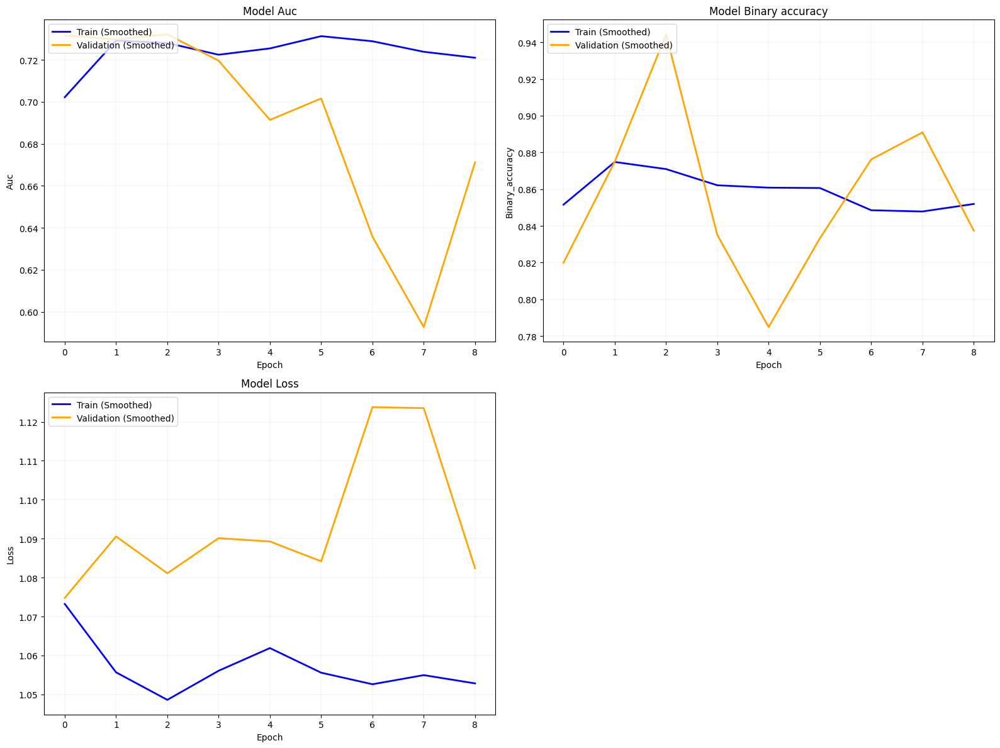

In [ ]:
plot_training_history(resnet_BCE_history)

#### Model Evaluation

In [ ]:
file_path_resnet_BCE = '/content/drive/My Drive/ChestMNIST/resnet_BCE.keras'
file_path_resnet_BCE_history = '/content/drive/My Drive/ChestMNIST/resnet_BCE_history.pkl'
# Load the model
resnet_BCE = load_model(file_path_resnet_BCE)
rresnet_BCE_history = pickle.load(open(file_path_resnet_BCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = data_generator(train_images_224, train_labels_224, batch_size, datagen)
val_generator = data_generator(val_images_224, val_labels_224, batch_size, datagen_val)
test_generator = data_generator(test_images_224, test_labels_224, batch_size, datagen_val)

35/35 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - auc: 0.7278 - binary_accuracy: 0.8335 - loss: 1.1933
Test Loss: 1.1831477880477905
Test AUC: 0.7330706119537354
Test Binary Accuracy: 0.8344706892967224
35/35 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.14      0.45      0.21       211
      cardiomegaly       0.04      0.13      0.06        61
          effusion       0.14      0.71      0.24       255
      infiltration       0.20      0.72      0.32       391
              mass       0.06      0.85      0.12       132
            nodule       0.07      0.88      0.12       132
         pneumonia       0.00      0.00      0.00        24
      pneumothorax       0.06      0.18      0.09       101
     consolidation       0.07      0.52      0.12        95
             edema       0.04      0.24      0.07        41
         emphysema       0.02      0.50      0.05        50
          fibrosis       0.02      0.43      0.05        23
pleural_thickening       0.06      0.20      0.09        76
            hernia       0.00      0.00      0.00         1

         micro avg       0.08      0.58      0.14      1593
         macro

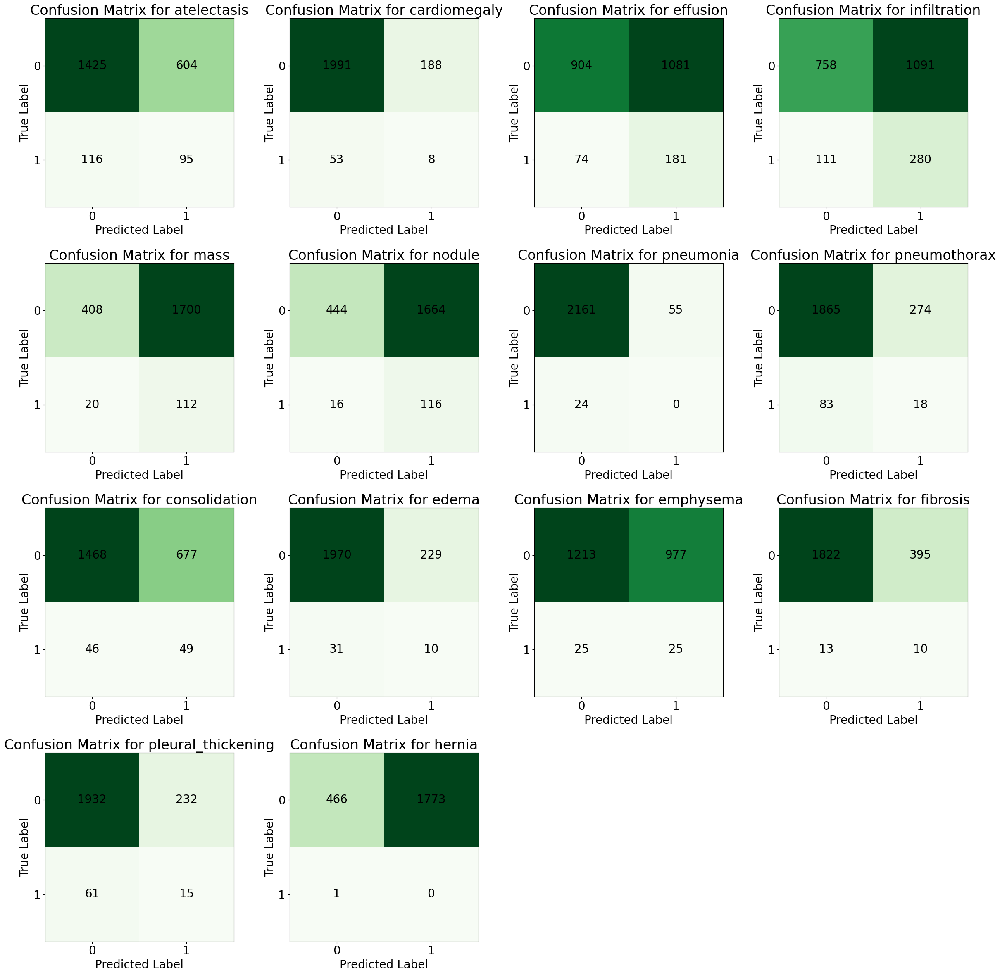

In [ ]:
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_images_224) // batch_size
evaluation = resnet_BCE.evaluate(test_generator, steps=steps_per_epoch)

class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])
print("Test Binary Accuracy:", evaluation[1])

y_probs = resnet_BCE.predict(test_generator, steps=steps_per_epoch)
y_true = test_labels_224  # True labels (multi-label ground truth)

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold


# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)
# y_pred = (y_probs > 0.48).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

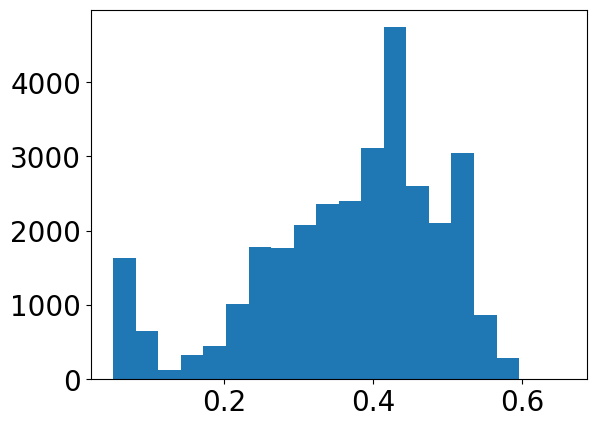

In [ ]:
plt.figure()
plt.hist(y_probs.flatten(), bins=20);

In [ ]:
y_probs[:2]

array([[0.49019694, 0.34993556, 0.48445973, 0.50792944, 0.43226746,
        0.41333577, 0.25372556, 0.40939465, 0.43874028, 0.3414309 ,
        0.34342209, 0.19921774, 0.3324719 , 0.06723664],
       [0.42356554, 0.31178662, 0.32293963, 0.3613262 , 0.45316976,
        0.47098276, 0.20844029, 0.39773718, 0.26743233, 0.11523146,
        0.24172617, 0.3654916 , 0.44547632, 0.09978541]], dtype=float32)

In [ ]:
sorted(optimal_thresholds)

[0.056377158,
 0.2937628,
 0.30079243,
 0.3719487,
 0.37839463,
 0.4088553,
 0.4236273,
 0.42992672,
 0.4369338,
 0.44264472,
 0.47136503,
 0.48932013,
 0.5037386,
 0.5216044]

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score, roc_auc_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

macro_auc = roc_auc_score(y_true[:corrected_len], y_probs, average='macro')
micro_auc = roc_auc_score(y_true[:corrected_len], y_probs, average='micro')


print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")
print(f"Macro AUC: {macro_auc:.4f}")
print(f"Micro AUC: {micro_auc:.4f}")


Exact Match Ratio: 0.0000
Hamming Loss: 0.3703
Macro F1-score: 0.1095
Micro F1-score: 0.1366
Macro AUC: 0.5322
Micro AUC: 0.7330


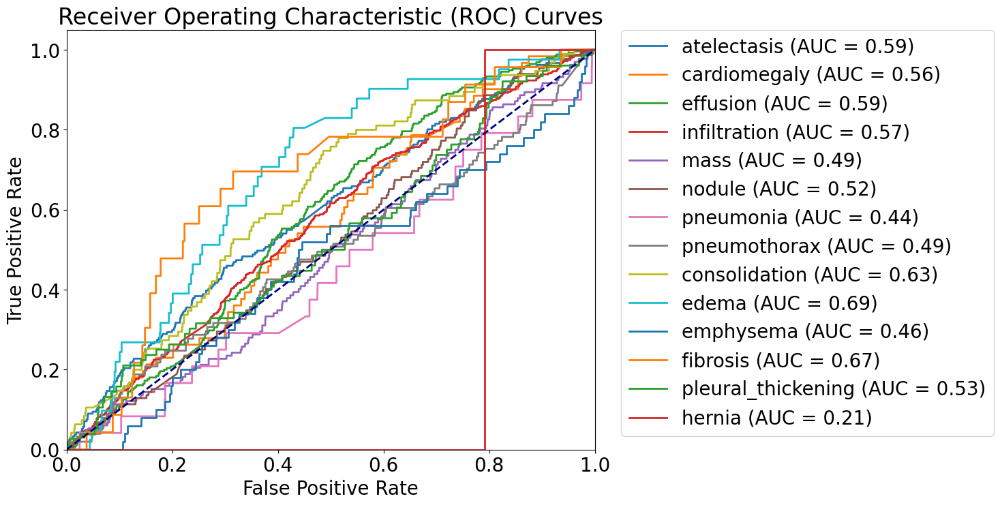

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()

## InceptionV3 - 224 - WCE

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras import layers, models

def create_inception_model(input_shape, num_classes=14):

    K.clear_session()

    base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

    # Convert grayscale input to 3 channels by repeating across channels
    inputs = layers.Input(shape=(input_shape[0], input_shape[1], 1))
    x = layers.Conv2D(3, (1, 1), padding="same")(inputs)
    x = base_model(x)

    x = layers.GlobalAveragePooling2D()(x)

    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)

    outputs = layers.Dense(num_classes, activation='sigmoid')(x)

    model = models.Model(inputs=inputs, outputs=outputs)

    return model

In [ ]:
train_generator = data_generator(train_images_224, train_labels_224, batch_size, datagen)
val_generator = data_generator(val_images_224, val_labels_224, batch_size, datagen_val)
test_generator = data_generator(test_images_224, test_labels_224, batch_size, datagen_val)

In [ ]:
inception_WCE, inception_WCE_history = train_and_save_cnn(
    loss = weighted_cross_entropy_loss,
    batch_size = 64,
    num_epochs = 10,
    model = create_inception_model(input_shape=(224, 224, 1), num_classes=14),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'inception_WCE'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_94 (Conv2D)                   │ (None, 224, 224, 3)         │               6 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ inception_v3 (Functional)            │ (None, 5, 5, 2048)          │      21,802,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_94               │ (None, 2048)                │           8,192 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          28,686 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,839,668 (83.31 MB)

 Trainable params: 21,801,140 (83.16 MB)

 Non-trainable params: 38,528 (150.50 KB)

Epoch 1/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 214s 417ms/step - auc: 0.5388 - binary_accuracy: 0.5958 - loss: 1.4459 - val_auc: 0.7108 - val_binary_accuracy: 0.8457 - val_loss: 1.1192
Epoch 2/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 135s 1s/step - auc: 0.6488 - binary_accuracy: 0.7842 - loss: 1.4380 - val_auc: 0.6199 - val_binary_accuracy: 0.6390 - val_loss: 11.5990
Epoch 3/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 41s 335ms/step - auc: 0.6516 - binary_accuracy: 0.7748 - loss: 1.3455 - val_auc: 0.6085 - val_binary_accuracy: 0.6918 - val_loss: 2.0862
Epoch 4/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 41s 337ms/step - auc: 0.6444 - binary_accuracy: 0.8047 - loss: 1.3714 - val_auc: 0.6905 - val_binary_accuracy: 0.7729 - val_loss: 1.0564
Epoch 5/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 46s 374ms/step - auc: 0.6789 - binary_accuracy: 0.7083 - loss: 1.3303 - val_auc: 0.6658 - val_binary_accuracy: 0.8870 - val_loss: 1.1936
Epoch 6/10
123/123 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - auc: 0.6560 - binary_accuracy: 0.7930 - loss: 1.2779 - val

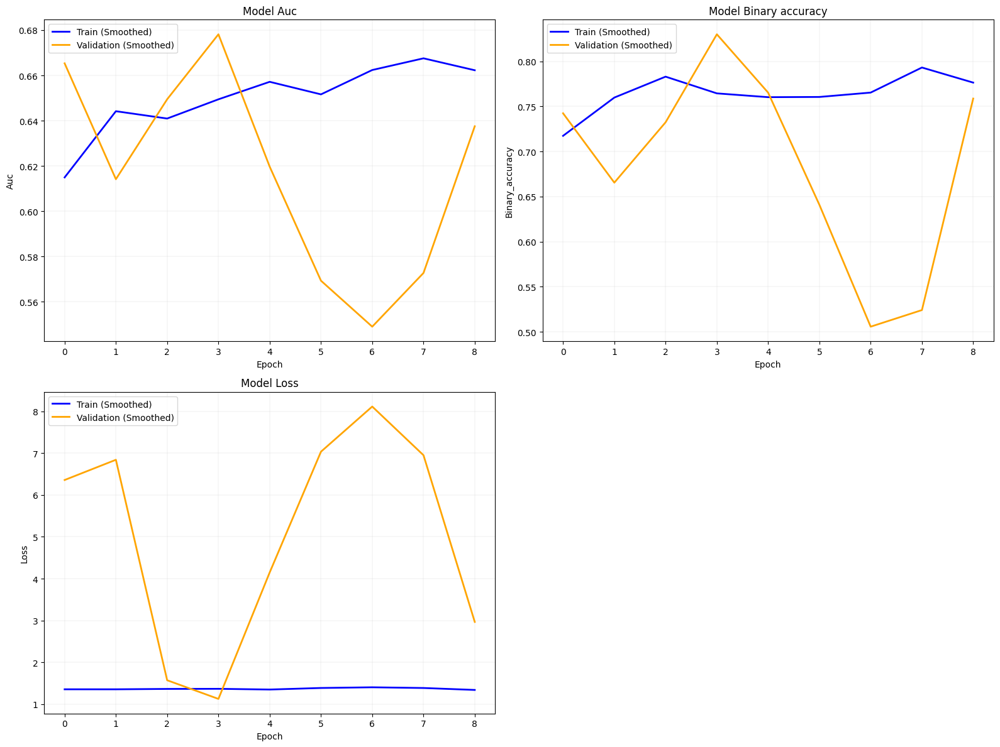

In [ ]:
plot_training_history(inception_WCE_history)

#### Model Evaluation

In [ ]:
file_path_inception_WCE = '/content/drive/My Drive/ChestMNIST/inception_WCE.keras'
file_path_inception_WCE_history = '/content/drive/My Drive/ChestMNIST/inception_WCE_history.pkl'
# Load the model
inception_WCE = load_model(file_path_inception_WCE)
inception_WCE_history = pickle.load(open(file_path_inception_WCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = data_generator(train_images_224, train_labels_224, batch_size, datagen)
val_generator = data_generator(val_images_224, val_labels_224, batch_size, datagen_val)
test_generator = data_generator(test_images_224, test_labels_224, batch_size, datagen_val)

35/35 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - auc: 0.6495 - binary_accuracy: 0.8369 - loss: 1.5948
Test Loss: 1.6189450025558472
Test AUC: 0.6475613117218018
Test Binary Accuracy: 0.836288332939148
35/35 ━━━━━━━━━━━━━━━━━━━━ 13s 108ms/step
Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.10      0.72      0.18       211
      cardiomegaly       0.03      0.87      0.05        61
          effusion       0.12      0.87      0.21       255
      infiltration       0.18      0.93      0.31       391
              mass       0.06      0.77      0.12       132
            nodule       0.06      0.99      0.11       132
         pneumonia       0.02      0.58      0.03        24
      pneumothorax       0.04      0.94      0.09       101
     consolidation       0.05      0.74      0.09        95
             edema       0.02      0.95      0.04        41
         emphysema       0.03      0.20      0.06        50
          fibrosi

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


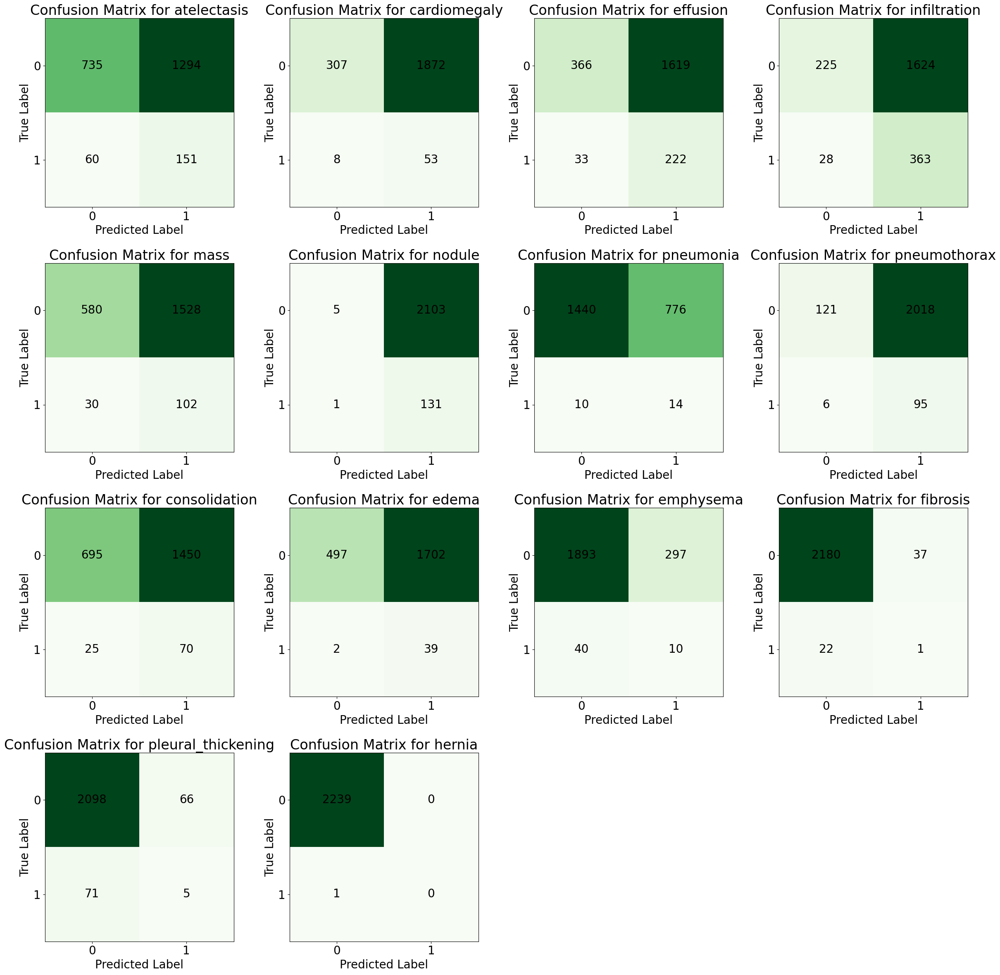

In [ ]:
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_images_224) // batch_size
evaluation = inception_WCE.evaluate(test_generator, steps=steps_per_epoch)

class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])
print("Test Binary Accuracy:", evaluation[1])


y_probs = inception_WCE.predict(test_generator, steps=steps_per_epoch)
y_true = test_labels_224  # True labels (multi-label ground truth)

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold


# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)
# y_pred = (y_probs > 0.48).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

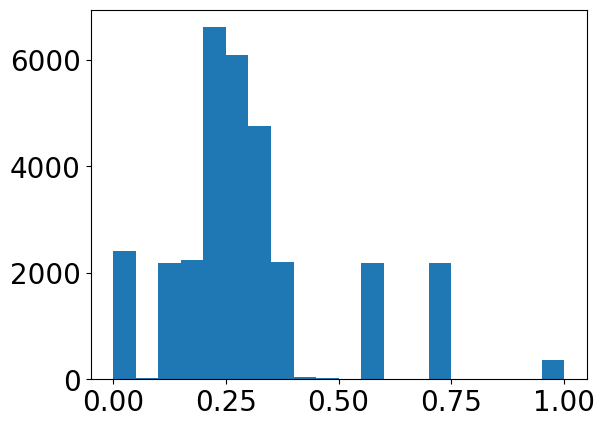

In [ ]:
plt.figure()
plt.hist(y_probs.flatten(), bins=20);

In [ ]:
y_probs[:2]

array([[0.49019694, 0.34993556, 0.48445973, 0.50792944, 0.43226746,
        0.41333577, 0.25372556, 0.40939465, 0.43874028, 0.3414309 ,
        0.34342209, 0.19921774, 0.3324719 , 0.06723664],
       [0.42356554, 0.31178662, 0.32293963, 0.3613262 , 0.45316976,
        0.47098276, 0.20844029, 0.39773718, 0.26743233, 0.11523146,
        0.24172617, 0.3654916 , 0.44547632, 0.09978541]], dtype=float32)

In [ ]:
sorted(optimal_thresholds)

[0.11283867,
 0.18810205,
 0.23025925,
 0.23745649,
 0.2377146,
 0.29876125,
 0.3022501,
 0.30237406,
 0.31226593,
 0.35711303,
 0.57072103,
 0.7109807,
 0.9998203,
 1.0]

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score, roc_auc_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

macro_auc = roc_auc_score(y_true[:corrected_len], y_probs, average='macro')
micro_auc = roc_auc_score(y_true[:corrected_len], y_probs, average='micro')


print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")
print(f"Macro AUC: {macro_auc:.4f}")
print(f"Micro AUC: {micro_auc:.4f}")


Exact Match Ratio: 0.0000
Hamming Loss: 0.5333
Macro F1-score: 0.0991
Micro F1-score: 0.1306
Macro AUC: 0.5379
Micro AUC: 0.6487


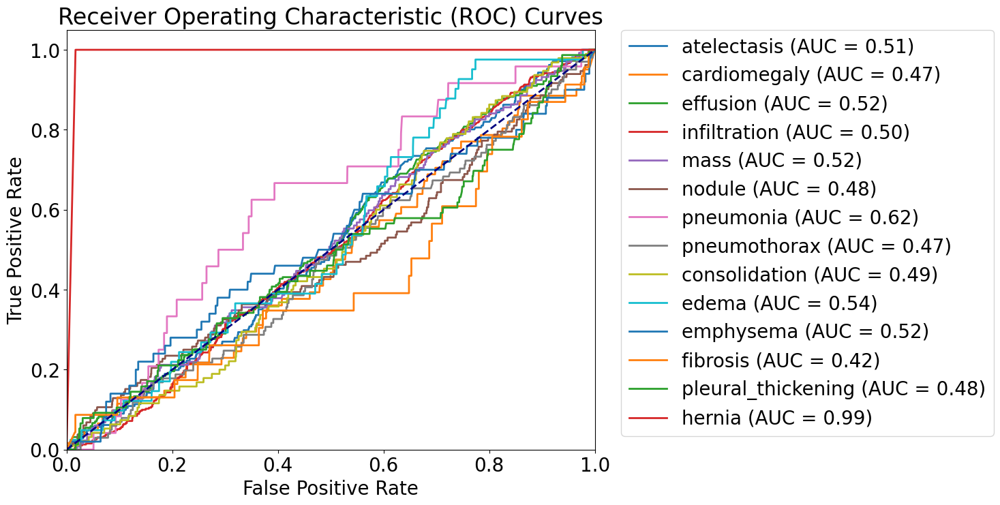

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()

## Attention Guided Masking

In [ ]:
train_generator = data_generator(train_images_224, train_labels_224, batch_size, datagen)
val_generator = data_generator(val_images_224, val_labels_224, batch_size, datagen_val)
test_generator = data_generator(test_images_224, test_labels_224, batch_size, datagen_val)

### Define a function that generates heatmaps

In [ ]:
# Define LSE pooling
def lse_pooling(inputs):
    """Log-Sum-Exp pooling implementation."""
    lse = tf.reduce_logsumexp(inputs, axis=[1, 2])  # Reduce spatial dimensions
    return lse

In [ ]:
def generate_heatmaps(image, model, last_cnn_layer_name, dense_layer_name):
    # Get the last CNN layer output and Dense layer weights
    cnn_layer = model.get_layer(last_cnn_layer_name).output  # Shape: (None, 7, 7, 512)
    dense_layer = model.get_layer(dense_layer_name)
    dense_weights = dense_layer.get_weights()[0]  # Shape: (512, 14)

    # Create a model to extract features
    feature_extractor = Model(inputs=model.input, outputs=cnn_layer)
    feature_maps = feature_extractor.predict(image, verbose=0)  # Shape: (1, 7, 7, 512)

    # Compute heatmaps
    heatmaps = np.dot(feature_maps[0], dense_weights)  # Shape: (7, 7, 14)
    return heatmaps

In [ ]:
def generate_heatmaps_batch(images, model, last_cnn_layer_name, dense_layer_name):

    # Get the last CNN layer output and Dense layer weights
    cnn_layer = model.get_layer(last_cnn_layer_name).output  # Shape: (None, height, width, filters)
    dense_layer = model.get_layer(dense_layer_name)
    dense_weights = dense_layer.get_weights()[0]  # Shape: (filters, num_classes)

    # Create a model to extract features
    feature_extractor = Model(inputs=model.input, outputs=cnn_layer)

    # Extract feature maps for the entire batch
    feature_maps = feature_extractor.predict(images, verbose=0)  # Shape: (batch_size, height, width, filters)

    # Compute heatmaps by matrix multiplication for each image in the batch
    heatmaps = np.tensordot(feature_maps, dense_weights, axes=([3], [0]))  # Shape: (batch_size, height, width, num_classes)

    return heatmaps


### Testing the Heatmap Generator

In [ ]:
batch_size=1

In [ ]:
train_generator = data_generator(train_images_224, train_labels_224, batch_size, datagen)
val_generator = data_generator(val_images_224, val_labels_224, batch_size, datagen_val)
test_generator = data_generator(test_images_224, test_labels_224, batch_size, datagen_val)

[[0 0 0 0 0 0 0 0 0 0 0 0 0 0]]


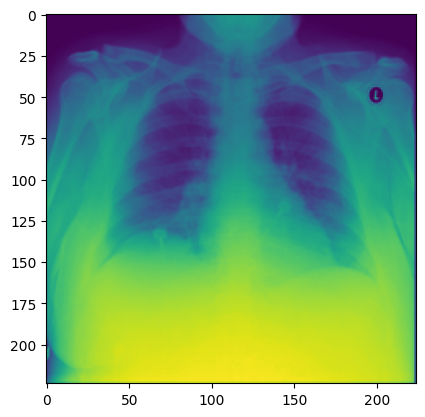

In [ ]:
img, label = next(val_generator)
plt.imshow(img[0])
print(label)

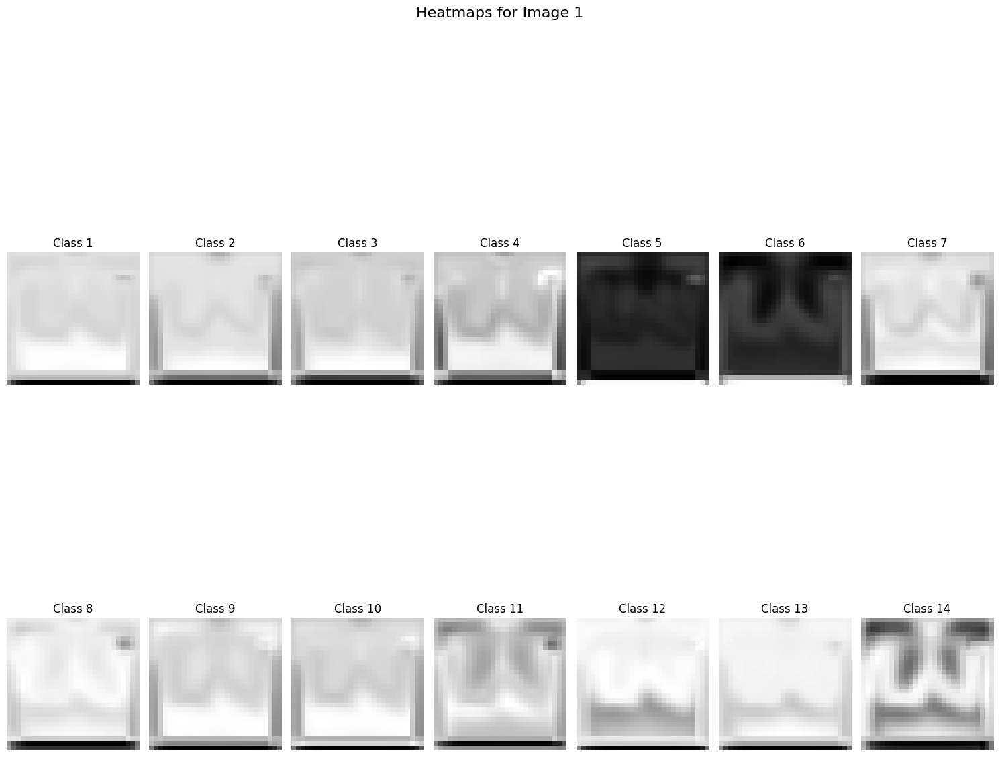

In [ ]:
heatmaps_batch = generate_heatmaps_batch(img, global_branch, "conv2d_4", "dense")

def plot_heatmaps(heatmaps, rows=4, cols=4):

    n, x, _, num_classes = heatmaps.shape

    for i in range(n):
        fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
        fig.suptitle(f"Heatmaps for Image {i + 1}", fontsize=16)

        for class_idx in range(num_classes):
            row, col = divmod(class_idx, cols)
            if row < rows:  # Check bounds for grid size
                ax = axes[row, col]
                ax.imshow(heatmaps[i, :, :, class_idx], cmap="gray")
                ax.set_title(f"Class {class_idx + 1}")
                ax.axis("off")

        # Hide any unused subplots
        for j in range(num_classes, rows * cols):
            row, col = divmod(j, cols)
            if row < rows:
                axes[row, col].axis("off")

        plt.tight_layout()
        plt.show()

plot_heatmaps(heatmaps_batch, rows=2, cols=7)

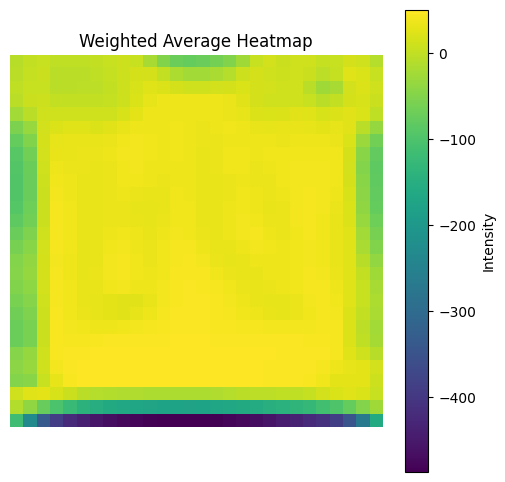

In [ ]:
average_heatmap = np.mean(heatmaps_batch, axis=-1)
average_heatmap = np.squeeze(average_heatmap)

# Plot the resulting single heatmap
plt.figure(figsize=(6, 6))
plt.imshow(average_heatmap, cmap='viridis')
plt.title("Weighted Average Heatmap")
plt.colorbar(label="Intensity")
plt.axis('off')
plt.show()

### Masking all images and Saving them

#### BCE_64

In [ ]:
file_path_simple_model_BCE = '/content/drive/My Drive/ChestMNIST/simple_model_BCE.keras'

# Load the model
simple_model_BCE = load_model(file_path_simple_model_BCE)
simple_model_BCE.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 64, 64, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 64, 64, 64)          │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 8, 8, 1024)          │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 8, 8, 1024)          │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,867,244 (71.97 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

 Optimizer params: 12,575,518 (47.97 MB)

In [ ]:
def simple_data_generator(images, labels, batch_size):
    while True:
        for start in range(0, len(images), batch_size):
            end = min(start + batch_size, len(images))
            batch_images = images[start:end]
            batch_labels = labels[start:end]

            # Add a channel dimension for each image
            batch_images = [np.expand_dims(img, axis=-1) for img in batch_images]

            yield np.array(batch_images), np.array(batch_labels)

In [ ]:
batch_size = 1
train_generator_mask = simple_data_generator(train_images_64, train_labels_64, batch_size)
validation_generator_mask = simple_data_generator(val_images_64, val_labels_64, batch_size)
test_generator_mask = simple_data_generator(test_images_64, test_labels_64, batch_size)

In [ ]:
img, lbl = next(train_generator_mask)
print(img.shape)
print(lbl)

(1, 64, 64, 1)
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0]]


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(train_images_64))):
    img, lbl = next(train_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_BCE, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked/train_masked_64_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 7846/7846 [46:48<00:00,  2.79it/s]


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(val_images_64))):
    img, lbl = next(validation_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_BCE, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,  # Condition: where mask is True (nonzero)
        img.astype(float),  # Take the image value
        0  # Otherwise, set to 0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked/val_masked_64_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 1121/1121 [07:33<00:00,  2.47it/s]


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(test_images_64))):
    img, lbl = next(test_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_BCE, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked/test_masked_64_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 2243/2243 [13:38<00:00,  2.74it/s]


#### BCE_128

In [ ]:
file_path_simple_model_BCE = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_128.keras'

# Load the model
simple_model_BCE_128 = load_model(file_path_simple_model_BCE)
simple_model_BCE_128.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 128, 128, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,867,244 (71.97 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

 Optimizer params: 12,575,518 (47.97 MB)

In [ ]:
def simple_data_generator(images, labels, batch_size):
    while True:
        for start in range(0, len(images), batch_size):
            end = min(start + batch_size, len(images))
            batch_images = images[start:end]
            batch_labels = labels[start:end]

            # Add a channel dimension for each image
            batch_images = [np.expand_dims(img, axis=-1) for img in batch_images]

            yield np.array(batch_images), np.array(batch_labels)

In [ ]:
batch_size = 1
train_generator_mask = simple_data_generator(train_images_128, train_labels_128, batch_size)
validation_generator_mask = simple_data_generator(val_images_128, val_labels_128, batch_size)
test_generator_mask = simple_data_generator(test_images_128, test_labels_128, batch_size)

In [ ]:
img, lbl = next(train_generator_mask)
print(img.shape)
print(lbl)

(1, 128, 128, 1)
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0]]


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(train_images_128))):
    img, lbl = next(train_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_BCE_128, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,  # Condition: where mask is True (nonzero)
        img.astype(float),  # Take the image value
        0  # Otherwise, set to 0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked/train_masked_128_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 7846/7846 [51:55<00:00,  2.52it/s]


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(val_images_128))):
    img, lbl = next(validation_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_BCE_128, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked/val_masked_128_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 1121/1121 [07:35<00:00,  2.46it/s]


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(test_images_128))):
    img, lbl = next(test_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_BCE_128, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked/test_masked_128_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 2243/2243 [15:10<00:00,  2.46it/s]


#### BCE_224

In [ ]:
file_path_simple_model_BCE = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_224.keras'

# Load the model
simple_model_BCE_224 = load_model(file_path_simple_model_BCE)
simple_model_BCE_224.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 224, 224, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 224, 224, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 112, 112, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 56, 56, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 28, 28, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 28, 28, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 28, 28, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,867,244 (71.97 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

 Optimizer params: 12,575,518 (47.97 MB)

In [ ]:
def simple_data_generator(images, labels, batch_size):
    while True:
        for start in range(0, len(images), batch_size):
            end = min(start + batch_size, len(images))
            batch_images = images[start:end]
            batch_labels = labels[start:end]

            # Add a channel dimension for each image
            batch_images = [np.expand_dims(img, axis=-1) for img in batch_images]

            yield np.array(batch_images), np.array(batch_labels)

In [ ]:
batch_size = 1
train_generator_mask = simple_data_generator(train_images_224, train_labels_224, batch_size)
validation_generator_mask = simple_data_generator(val_images_224, val_labels_224, batch_size)
test_generator_mask = simple_data_generator(test_images_224, test_labels_224, batch_size)

In [ ]:
img, lbl = next(train_generator_mask)
print(img.shape)
print(lbl)

(1, 224, 224, 1)
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0]]


In [ ]:
masked_images_list = []
labels_list = []

In [ ]:
#for start in tqdm(range(len(train_images_224))):
for start in tqdm(range(4000,len(train_images_224))):
    img, lbl = next(train_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_BCE_224, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,  # Condition: where mask is True (nonzero)
        img.astype(float),  # Take the image value
        0  # Otherwise, set to 0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

100%|██████████| 3846/3846 [36:40<00:00,  1.75it/s]


In [ ]:
# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked/train_masked_224_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(val_images_224))):
    img, lbl = next(validation_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_BCE_224, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked/val_masked_224_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 1121/1121 [11:00<00:00,  1.70it/s]


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(test_images_224))):
    img, lbl = next(test_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_BCE_224, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked/test_masked_224_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 2243/2243 [21:55<00:00,  1.70it/s]


#### WCE_64

In [ ]:
file_path_simple_model_WCE = '/content/drive/My Drive/ChestMNIST/simple_model_WCE.keras'

# Load the model
simple_model_WCE = load_model(file_path_simple_model_WCE,
                              custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})
simple_model_WCE.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 64, 64, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 64, 64, 64)          │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 8, 8, 1024)          │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 8, 8, 1024)          │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,867,244 (71.97 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

 Optimizer params: 12,575,518 (47.97 MB)

In [ ]:
def simple_data_generator(images, labels, batch_size):
    while True:
        for start in range(0, len(images), batch_size):
            end = min(start + batch_size, len(images))
            batch_images = images[start:end]
            batch_labels = labels[start:end]

            # Add a channel dimension for each image
            batch_images = [np.expand_dims(img, axis=-1) for img in batch_images]

            yield np.array(batch_images), np.array(batch_labels)

In [ ]:
batch_size = 1
train_generator_mask = simple_data_generator(train_images_64, train_labels_64, batch_size)
validation_generator_mask = simple_data_generator(val_images_64, val_labels_64, batch_size)
test_generator_mask = simple_data_generator(test_images_64, test_labels_64, batch_size)

In [ ]:
img, lbl = next(train_generator_mask)
print(img.shape)
print(lbl)

(1, 64, 64, 1)
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0]]


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(train_images_64))):
    img, lbl = next(train_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_WCE, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked_WCE/train_masked_64_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 7846/7846 [52:29<00:00,  2.49it/s]


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(val_images_64))):
    img, lbl = next(validation_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_WCE, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked_WCE/val_masked_64_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 1121/1121 [08:18<00:00,  2.25it/s]


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(test_images_64))):
    img, lbl = next(test_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_WCE, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked_WCE/test_masked_64_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 2243/2243 [17:14<00:00,  2.17it/s]


#### WCE_128

In [ ]:
file_path_simple_model_WCE = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_128.keras'

# Load the model
simple_model_WCE_128 = load_model(file_path_simple_model_WCE,
                                  custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})

simple_model_WCE_128.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 128, 128, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,867,244 (71.97 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

 Optimizer params: 12,575,518 (47.97 MB)

In [ ]:
def simple_data_generator(images, labels, batch_size):
    while True:
        for start in range(0, len(images), batch_size):
            end = min(start + batch_size, len(images))
            batch_images = images[start:end]
            batch_labels = labels[start:end]

            # Add a channel dimension for each image
            batch_images = [np.expand_dims(img, axis=-1) for img in batch_images]

            yield np.array(batch_images), np.array(batch_labels)

In [ ]:
batch_size = 1
train_generator_mask = simple_data_generator(train_images_128, train_labels_128, batch_size)
validation_generator_mask = simple_data_generator(val_images_128, val_labels_128, batch_size)
test_generator_mask = simple_data_generator(test_images_128, test_labels_128, batch_size)

In [ ]:
img, lbl = next(train_generator_mask)
print(img.shape)
print(lbl)

(1, 128, 128, 1)
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0]]


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(train_images_128))):
    img, lbl = next(train_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_WCE_128, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked_WCE/train_masked_128_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 7846/7846 [1:01:01<00:00,  2.14it/s]


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(val_images_128))):
    img, lbl = next(validation_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_WCE_128, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked_WCE/val_masked_128_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 1121/1121 [09:31<00:00,  1.96it/s]


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(test_images_128))):
    img, lbl = next(test_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_WCE_128, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked_WCE/test_masked_128_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 2243/2243 [18:04<00:00,  2.07it/s]


#### WCE_224

In [ ]:
file_path_simple_model_WCE = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_224.keras'

# Load the model
simple_model_WCE_224 = load_model(file_path_simple_model_WCE,
                                  custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})

simple_model_WCE_224.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 224, 224, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 224, 224, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 112, 112, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 56, 56, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 28, 28, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 28, 28, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 28, 28, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,867,244 (71.97 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

 Optimizer params: 12,575,518 (47.97 MB)

In [ ]:
def simple_data_generator(images, labels, batch_size):
    while True:
        for start in range(0, len(images), batch_size):
            end = min(start + batch_size, len(images))
            batch_images = images[start:end]
            batch_labels = labels[start:end]

            # Add a channel dimension for each image
            batch_images = [np.expand_dims(img, axis=-1) for img in batch_images]

            yield np.array(batch_images), np.array(batch_labels)

In [ ]:
batch_size = 1
train_generator_mask = simple_data_generator(train_images_224, train_labels_224, batch_size)
validation_generator_mask = simple_data_generator(val_images_224, val_labels_224, batch_size)
test_generator_mask = simple_data_generator(test_images_224, test_labels_224, batch_size)

In [ ]:
img, lbl = next(train_generator_mask)
print(img.shape)
print(lbl)

(1, 224, 224, 1)
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0]]


In [ ]:
masked_images_list = []
labels_list = []

In [ ]:
#for start in tqdm(range(len(train_images_224))):
for start in tqdm(range(4000,len(train_images_224))):
    img, lbl = next(train_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_WCE_224, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

100%|██████████| 3846/3846 [48:56<00:00,  1.31it/s]


In [ ]:
# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked_WCE/train_masked_224_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(val_images_224))):
    img, lbl = next(validation_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_WCE_224, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked_WCE/val_masked_224_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 1121/1121 [14:07<00:00,  1.32it/s]


In [ ]:
masked_images_list = []
labels_list = []

for start in tqdm(range(len(test_images_224))):
    img, lbl = next(test_generator_mask)
    heatmaps = generate_heatmaps_batch(img, simple_model_WCE_224, "conv2d_4", "dense")
    average_heatmaps = np.mean(heatmaps, axis=-1)
    average_heatmaps /= (np.max(average_heatmaps) + 1e-7)
    resized_heatmaps = np.array([
        cv2.resize(heatmap, (img.shape[2], img.shape[1]), interpolation=cv2.INTER_LINEAR)
        for heatmap in average_heatmaps
    ])
    threshold = 0.5
    binary_masks = (resized_heatmaps >= threshold).astype(np.uint8)
    binary_masks_expanded = np.expand_dims(binary_masks, axis=-1).astype(bool)

    masked_images = np.where(
        binary_masks_expanded,
        img.astype(float),
        0
    )

    masked_images_list.append(masked_images)
    labels_list.append(lbl)

# Save all data in one file
np.savez_compressed('/content/drive/My Drive/ChestMNIST/Masked_WCE/test_masked_224_cnn.npz',
                    images=np.array(masked_images_list),
                    labels=np.array(labels_list))


100%|██████████| 2243/2243 [27:53<00:00,  1.34it/s]


## Local Branch with CNN

### Loading Saved Masked Data - BCE

In [ ]:
data_train_masked_64_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_BCE/train_masked_64_cnn.npz')
train_masked_images_64_cnn = data_train_masked_64_cnn['images']
train_masked_images_64_cnn = np.squeeze(train_masked_images_64_cnn)
train_masked_labels_64_cnn = data_train_masked_64_cnn['labels']
train_masked_labels_64_cnn = np.squeeze(train_masked_labels_64_cnn)

In [ ]:
data_val_masked_64_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_BCE/val_masked_64_cnn.npz')
val_masked_images_64_cnn = data_val_masked_64_cnn['images']
val_masked_images_64_cnn = np.squeeze(val_masked_images_64_cnn)
val_masked_labels_64_cnn = data_val_masked_64_cnn['labels']
val_masked_labels_64_cnn = np.squeeze(val_masked_labels_64_cnn)

In [ ]:
data_test_masked_64_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_BCE/test_masked_64_cnn.npz')
test_masked_images_64_cnn = data_test_masked_64_cnn['images']
test_masked_images_64_cnn = np.squeeze(test_masked_images_64_cnn)
test_masked_labels_64_cnn = data_test_masked_64_cnn['labels']
test_masked_labels_64_cnn = np.squeeze(test_masked_labels_64_cnn)

In [ ]:
data_train_masked_128_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_BCE/train_masked_128_cnn.npz')
train_masked_images_128_cnn = data_train_masked_128_cnn['images']
train_masked_images_128_cnn = np.squeeze(train_masked_images_128_cnn)
train_masked_labels_128_cnn = data_train_masked_128_cnn['labels']
train_masked_labels_128_cnn = np.squeeze(train_masked_labels_128_cnn)

In [ ]:
data_val_masked_128_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_BCE/val_masked_128_cnn.npz')
val_masked_images_128_cnn = data_val_masked_128_cnn['images']
val_masked_images_128_cnn = np.squeeze(val_masked_images_128_cnn)
val_masked_labels_128_cnn = data_val_masked_128_cnn['labels']
val_masked_labels_128_cnn = np.squeeze(val_masked_labels_128_cnn)

In [ ]:
data_test_masked_128_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_BCE/test_masked_128_cnn.npz')
test_masked_images_128_cnn = data_test_masked_128_cnn['images']
test_masked_images_128_cnn = np.squeeze(test_masked_images_128_cnn)
test_masked_labels_128_cnn = data_test_masked_128_cnn['labels']
test_masked_labels_128_cnn = np.squeeze(test_masked_labels_128_cnn)

In [ ]:
data_train_masked_224_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_BCE/train_masked_224_cnn.npz')
train_masked_images_224_cnn = data_train_masked_224_cnn['images']
train_masked_images_224_cnn = np.squeeze(train_masked_images_224_cnn)
train_masked_labels_224_cnn = data_train_masked_224_cnn['labels']
train_masked_labels_224_cnn = np.squeeze(train_masked_labels_224_cnn)

In [ ]:
data_val_masked_224_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_BCE/val_masked_224_cnn.npz')
val_masked_images_224_cnn = data_val_masked_224_cnn['images']
val_masked_images_224_cnn = np.squeeze(val_masked_images_224_cnn)
val_masked_labels_224_cnn = data_val_masked_224_cnn['labels']
val_masked_labels_224_cnn = np.squeeze(val_masked_labels_224_cnn)

In [ ]:
data_test_masked_224_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_BCE/test_masked_224_cnn.npz')
test_masked_images_224_cnn = data_test_masked_224_cnn['images']
test_masked_images_224_cnn = np.squeeze(test_masked_images_224_cnn)
test_masked_labels_224_cnn = data_test_masked_224_cnn['labels']
test_masked_labels_224_cnn = np.squeeze(test_masked_labels_224_cnn)

In [ ]:
def create_custom_cnn_local(input_shape, num_classes=14):

    K.clear_session()

    inputs = layers.Input(shape=input_shape)

    # First convolutional block
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Second convolutional block
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Third convolutional block
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fourth convolutional block
    x = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)

    # Fifth convolutional block
    x = layers.Conv2D(1024, (3, 3), activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)

    # x = layers.Conv2DTranspose(1024, (3, 3), activation='relu', strides=(2, 2), padding='same')(x)

    # Global average pooling
    x = layers.GlobalAveragePooling2D()(x)

    # Output layer for multi-label classification
    outputs = layers.Dense(num_classes, activation='sigmoid')(x)

    # Define the model
    model = models.Model(inputs, outputs)
    return model

### Simple CNN - 64 - Local - loss: Binary Cross-Entropy

In [ ]:
train_generator = data_generator(train_masked_images_64_cnn, train_masked_labels_64_cnn, batch_size, datagen)
val_generator = data_generator(val_masked_images_64_cnn, val_masked_labels_64_cnn, batch_size, datagen_val)
test_generator = data_generator(test_masked_images_64_cnn, test_masked_labels_64_cnn, batch_size, datagen_val)

In [ ]:
simple_model_BCE_local, simple_model_BCE_local_history = train_and_save_cnn(
    loss = 'binary_crossentropy',
    batch_size = 64,
    num_epochs = 50,
    model = create_custom_cnn_local(input_shape=(64, 64, 1), num_classes=14),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_BCE_local'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 64, 64, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 64, 64, 64)          │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 8, 8, 1024)          │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 8, 8, 1024)          │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 29s 171ms/step - auc: 0.5461 - binary_accuracy: 0.9523 - loss: 0.4268 - val_auc: 0.7991 - val_binary_accuracy: 0.9563 - val_loss: 0.1531
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - auc: 0.7228 - binary_accuracy: 0.9463 - loss: 0.1938 - val_auc: 0.6569 - val_binary_accuracy: 0.9484 - val_loss: 0.2032
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 22s 176ms/step - auc: 0.7864 - binary_accuracy: 0.9564 - loss: 0.1574 - val_auc: 0.6975 - val_binary_accuracy: 0.9563 - val_loss: 0.1755
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 22s 175ms/step - auc: 0.7143 - binary_accuracy: 0.9423 - loss: 0.2039 - val_auc: 0.8129 - val_binary_accuracy: 0.9444 - val_loss: 0.1822
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - auc: 0.7393 - binary_accuracy: 0.9367 - loss: 0.2103 - val_auc: 0.6659 - val_binary_accuracy: 0.9206 - val_loss: 0.2968
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - auc: 0.6169 - binary_accuracy: 0.9283 - loss: 0.2625 - val

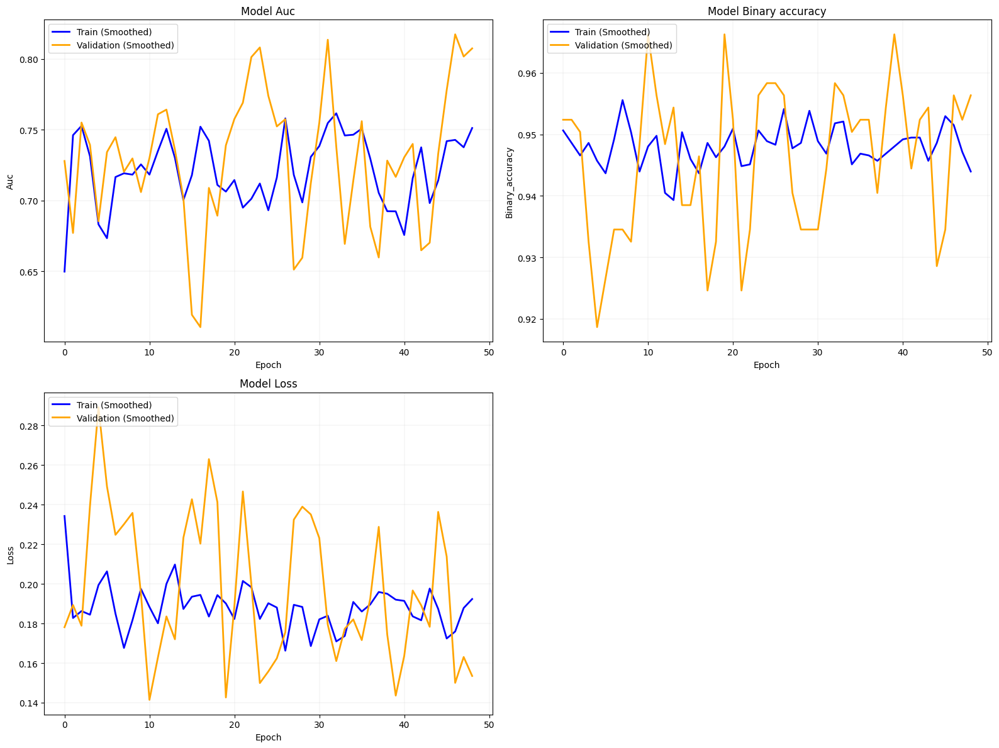

In [ ]:
plot_training_history(simple_model_BCE_local_history)

(-0.5, 223.5, 223.5, -0.5)

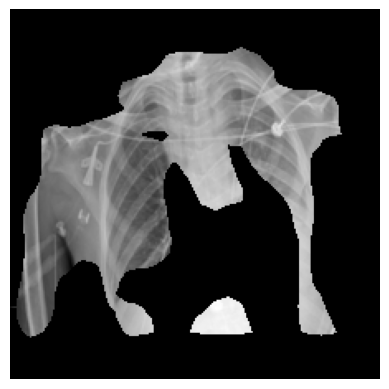

In [ ]:
plt.imshow(train_masked_images_224_cnn[0],cmap="gray")
plt.axis("off")

(-0.5, 223.5, 223.5, -0.5)

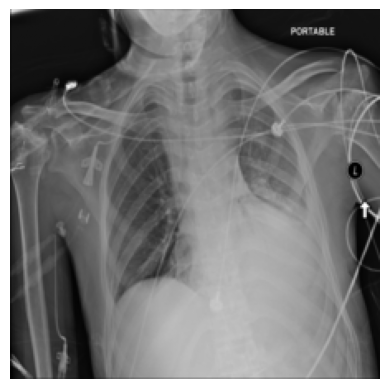

In [ ]:
plt.imshow(train_images_224[0], cmap="gray")
plt.axis("off")

#### Model Evaluation

In [ ]:
file_path_simple_model_BCE = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_local.keras'
file_path_simple_model_BCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_local_history.pkl'
# Load the model
simple_model_BCE_local = load_model(file_path_simple_model_BCE)
simple_model_BCE_local_history = pickle.load(open(file_path_simple_model_BCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = data_generator(train_masked_images_64_cnn, train_masked_labels_64_cnn, batch_size, datagen)
val_generator = data_generator(val_masked_images_64_cnn, val_masked_labels_64_cnn, batch_size, datagen_val)
test_generator = data_generator(test_masked_images_64_cnn, test_masked_labels_64_cnn, batch_size, datagen_val)

35/35 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - auc: 0.7309 - binary_accuracy: 0.9475 - loss: 0.1926
Test Loss: 0.18829423189163208
Test AUC: 0.728710412979126
Test Binary Accuracy: 0.9492027163505554
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.10      0.94      0.17       211
      cardiomegaly       0.06      0.10      0.07        61
          effusion       0.16      0.77      0.27       255
      infiltration       0.17      1.00      0.30       391
              mass       0.06      0.98      0.11       132
            nodule       0.10      0.17      0.12       132
         pneumonia       0.00      0.00      0.00        24
      pneumothorax       0.05      0.23      0.09       101
     consolidation       0.06      0.51      0.11        95
             edema       0.04      0.24      0.07        41
         emphysema       0.04      0.08      0.05        50
          fibrosis  

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


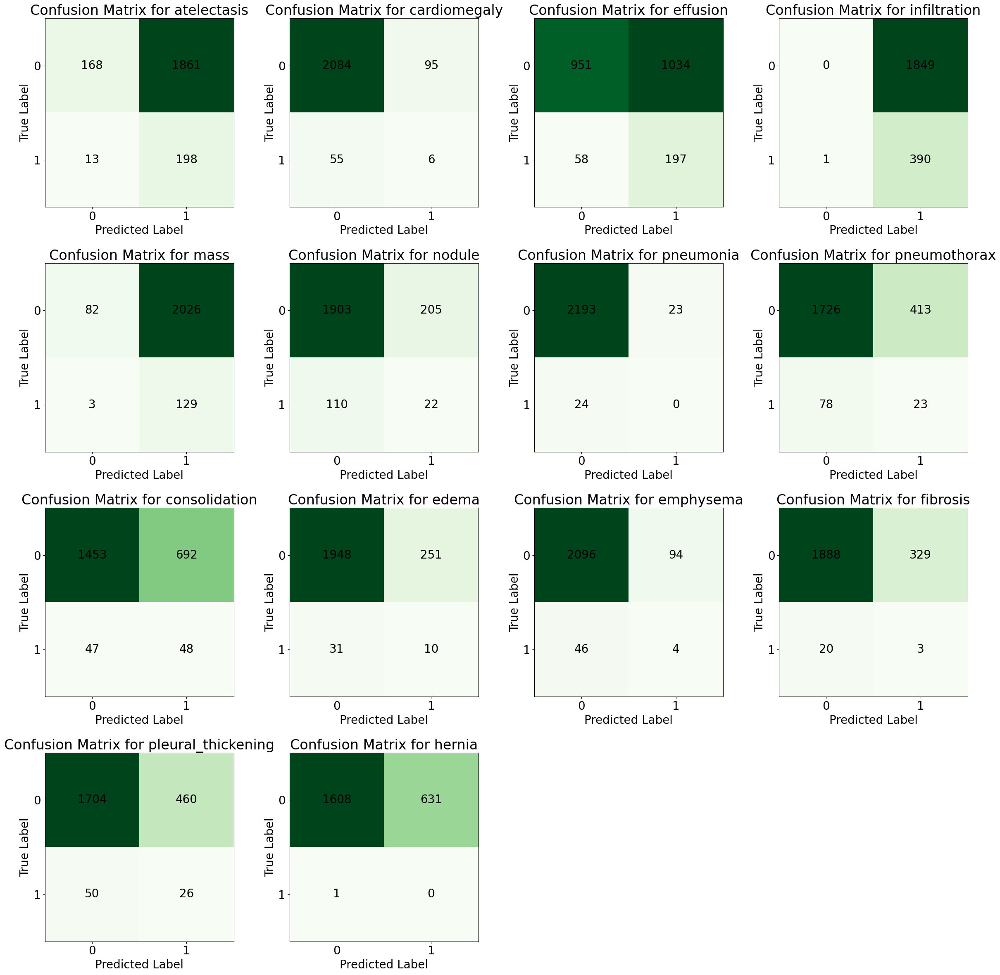

In [ ]:
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_masked_images_64_cnn) // batch_size
evaluation = simple_model_BCE_local.evaluate(test_generator, steps=steps_per_epoch)

class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])
print("Test Binary Accuracy:", evaluation[1])

y_probs = simple_model_BCE_local.predict(test_generator, steps=steps_per_epoch)
y_true = test_masked_labels_64_cnn

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.0004
Hamming Loss: 0.3348
Macro F1-score: 0.1054
Micro F1-score: 0.1675


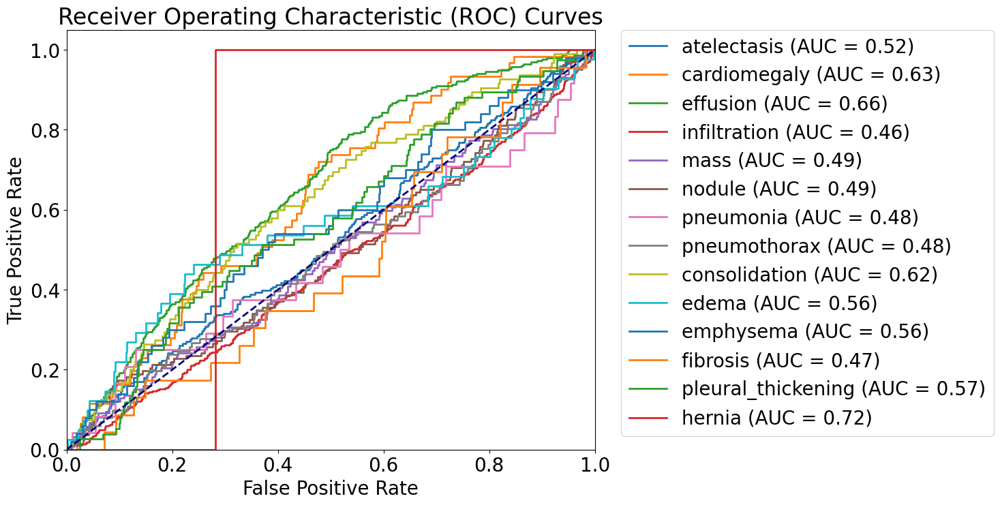

In [ ]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Simple CNN - 128 - Local - loss: Binary Cross-Entropy

In [ ]:
train_generator = data_generator(train_masked_images_128_cnn, train_masked_labels_128_cnn, batch_size, datagen)
val_generator = data_generator(val_masked_images_128_cnn, val_masked_labels_128_cnn, batch_size, datagen_val)
test_generator = data_generator(test_masked_images_128_cnn, test_masked_labels_128_cnn, batch_size, datagen_val)

In [ ]:
simple_model_BCE_128_local, simple_model_BCE_128_local_history = train_and_save_cnn(
    loss = 'binary_crossentropy',
    batch_size = 64,
    num_epochs = 50,
    model = create_custom_cnn_local(input_shape=(128, 128, 1), num_classes=14),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_BCE_128_local'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 128, 128, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - auc: 0.5559 - binary_accuracy: 0.8174 - loss: 0.5068 - val_auc: 0.6797 - val_binary_accuracy: 0.9463 - val_loss: 0.2109
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - auc: 0.7281 - binary_accuracy: 0.9477 - loss: 0.1880 - val_auc: 0.7405 - val_binary_accuracy: 0.9447 - val_loss: 0.2132
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - auc: 0.7412 - binary_accuracy: 0.9482 - loss: 0.1844 - val_auc: 0.7332 - val_binary_accuracy: 0.9446 - val_loss: 0.2042
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - auc: 0.7407 - binary_accuracy: 0.9493 - loss: 0.1812 - val_auc: 0.6733 - val_binary_accuracy: 0.9273 - val_loss: 0.2245
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - auc: 0.7454 - binary_accuracy: 0.9475 - loss: 0.1857 - val_auc: 0.6831 - val_binary_accuracy: 0.8845 - val_loss: 0.2834
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - auc: 0.7370 - binary_accuracy: 0.9469 - loss: 0.1891 - val_au

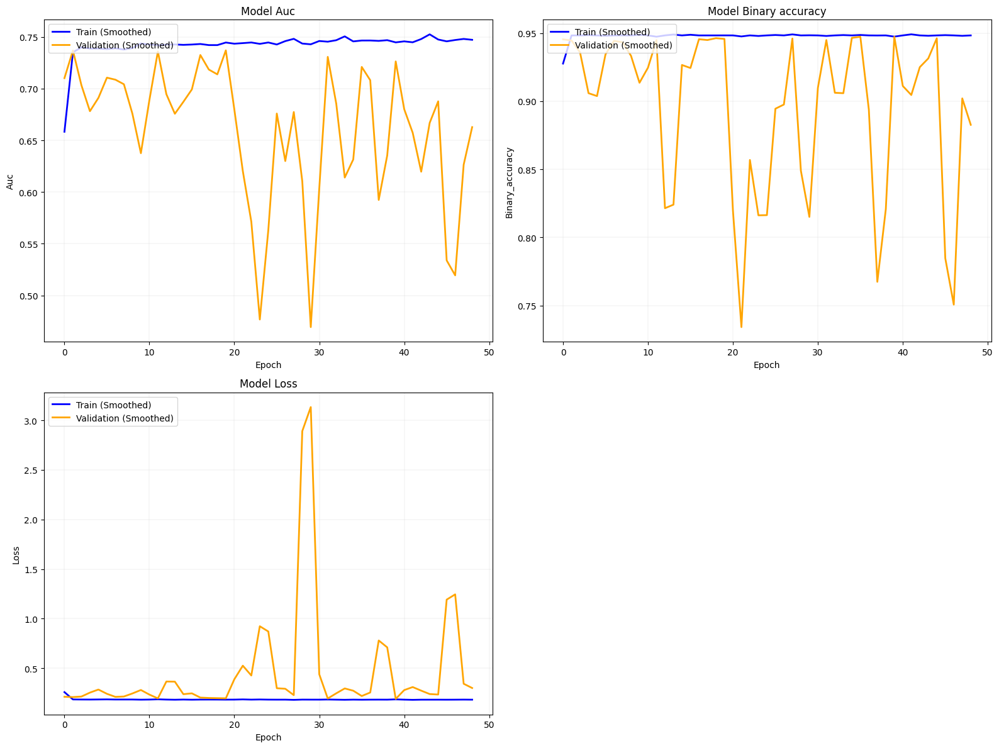

In [ ]:
plot_training_history(simple_model_BCE_128_local_history)

#### Model Evaluation

In [ ]:
file_path_simple_model_BCE = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_128_local.keras'
file_path_simple_model_BCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_128_local_history.pkl'
# Load the model
simple_model_BCE_128_local = load_model(file_path_simple_model_BCE)
simple_model_BCE_128_local_history = pickle.load(open(file_path_simple_model_BCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = data_generator(train_masked_images_128_cnn, train_masked_labels_128_cnn, batch_size, datagen)
val_generator = data_generator(val_masked_images_128_cnn, val_masked_labels_128_cnn, batch_size, datagen_val)
test_generator = data_generator(test_masked_images_128_cnn, test_masked_labels_128_cnn, batch_size, datagen_val)

35/35 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step - auc: 0.6697 - binary_accuracy: 0.8370 - loss: 0.3005
Test Loss: 0.29679420590400696
Test AUC: 0.6671740412712097
Test Binary Accuracy: 0.8386799693107605
35/35 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.12      0.45      0.19       211
      cardiomegaly       0.03      0.57      0.06        61
          effusion       0.14      0.60      0.22       255
      infiltration       0.17      0.99      0.30       391
              mass       0.08      0.32      0.12       132
            nodule       0.06      0.80      0.12       132
         pneumonia       0.01      0.96      0.02        24
      pneumothorax       0.05      0.75      0.10       101
     consolidation       0.10      0.20      0.13        95
             edema       0.03      0.41      0.05        41
         emphysema       0.05      0.10      0.07        50
          fibrosis       0.03      0.13      0.05        23
pleural_thickening       0.04      0.74      0.07        76
            hernia       0.00      0.00      0.00         1

         micro avg       0.07      0.64      0.12      1593
         macro

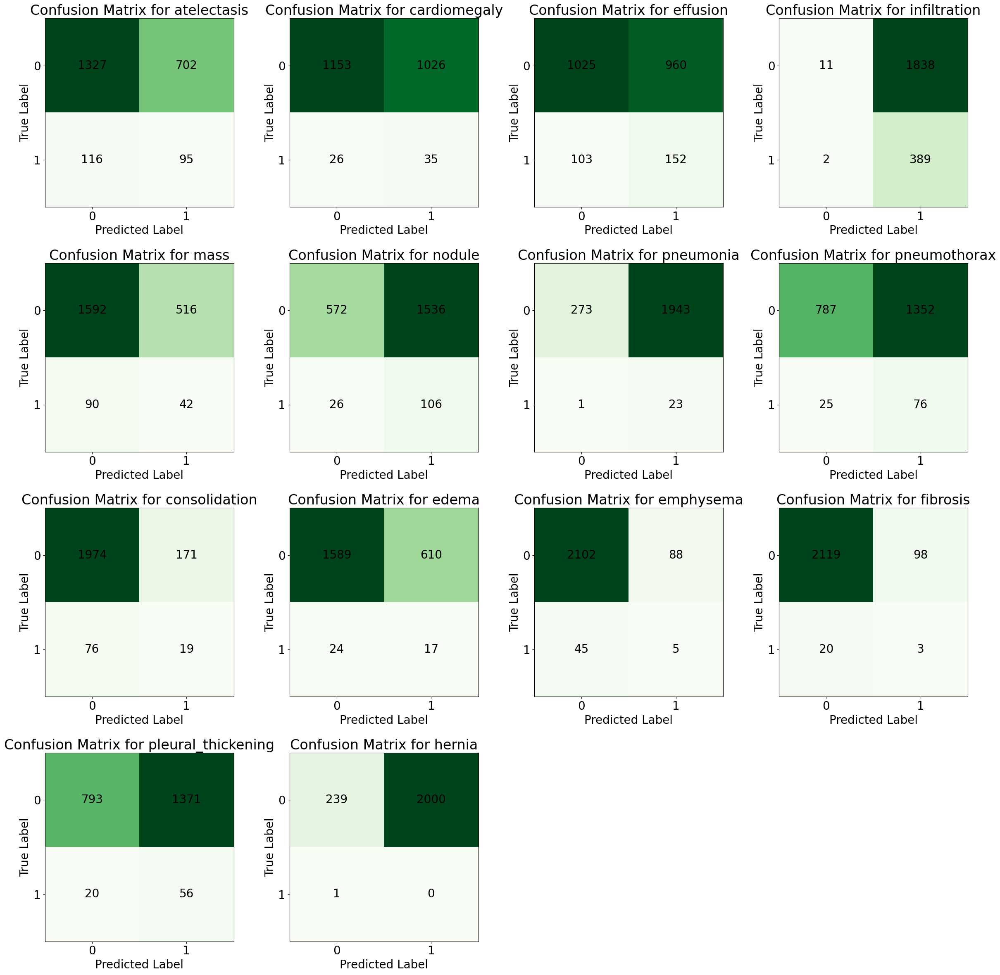

In [ ]:
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_masked_images_128_cnn) // batch_size
evaluation = simple_model_BCE_128_local.evaluate(test_generator, steps=steps_per_epoch)

class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])
print("Test Binary Accuracy:", evaluation[1])

y_probs = simple_model_BCE_128_local.predict(test_generator, steps=steps_per_epoch)
y_true = test_masked_labels_128_cnn

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.0000
Hamming Loss: 0.4715
Macro F1-score: 0.1079
Micro F1-score: 0.1210


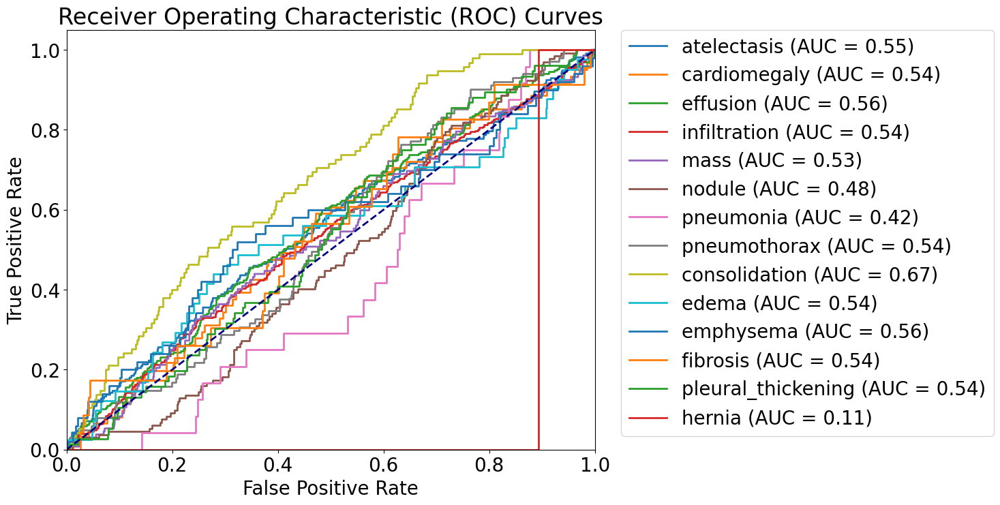

In [ ]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Simple CNN - 224 - Local - loss: Binary Cross-Entropy

In [ ]:
train_generator = data_generator(train_masked_images_224_cnn, train_masked_labels_224_cnn, batch_size, datagen)
val_generator = data_generator(val_masked_images_224_cnn, val_masked_labels_224_cnn, batch_size, datagen_val)
test_generator = data_generator(test_masked_images_224_cnn, test_masked_labels_224_cnn, batch_size, datagen_val)

In [ ]:
simple_model_BCE_224_local, simple_model_BCE_224_local_history = train_and_save_cnn(
    loss = 'binary_crossentropy',
    batch_size = 64,
    num_epochs = 50,
    model = create_custom_cnn_local(input_shape=(224, 224, 1), num_classes=14),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_BCE_224_local'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 224, 224, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 224, 224, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 112, 112, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 56, 56, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 28, 28, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 28, 28, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 28, 28, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 56s 258ms/step - auc: 0.5419 - binary_accuracy: 0.8200 - loss: 0.4913 - val_auc: 0.7245 - val_binary_accuracy: 0.9469 - val_loss: 0.1940
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 40s 324ms/step - auc: 0.7366 - binary_accuracy: 0.9477 - loss: 0.1870 - val_auc: 0.6894 - val_binary_accuracy: 0.9466 - val_loss: 0.2104
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 25s 206ms/step - auc: 0.7523 - binary_accuracy: 0.9470 - loss: 0.1855 - val_auc: 0.7055 - val_binary_accuracy: 0.9514 - val_loss: 0.1897
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 41s 334ms/step - auc: 0.7445 - binary_accuracy: 0.9503 - loss: 0.1787 - val_auc: 0.6673 - val_binary_accuracy: 0.9438 - val_loss: 0.2161
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 28s 230ms/step - auc: 0.7556 - binary_accuracy: 0.9488 - loss: 0.1805 - val_auc: 0.6861 - val_binary_accuracy: 0.9456 - val_loss: 0.2015
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 38s 313ms/step - auc: 0.7361 - binary_accuracy: 0.9489 - loss: 0.1844 - val

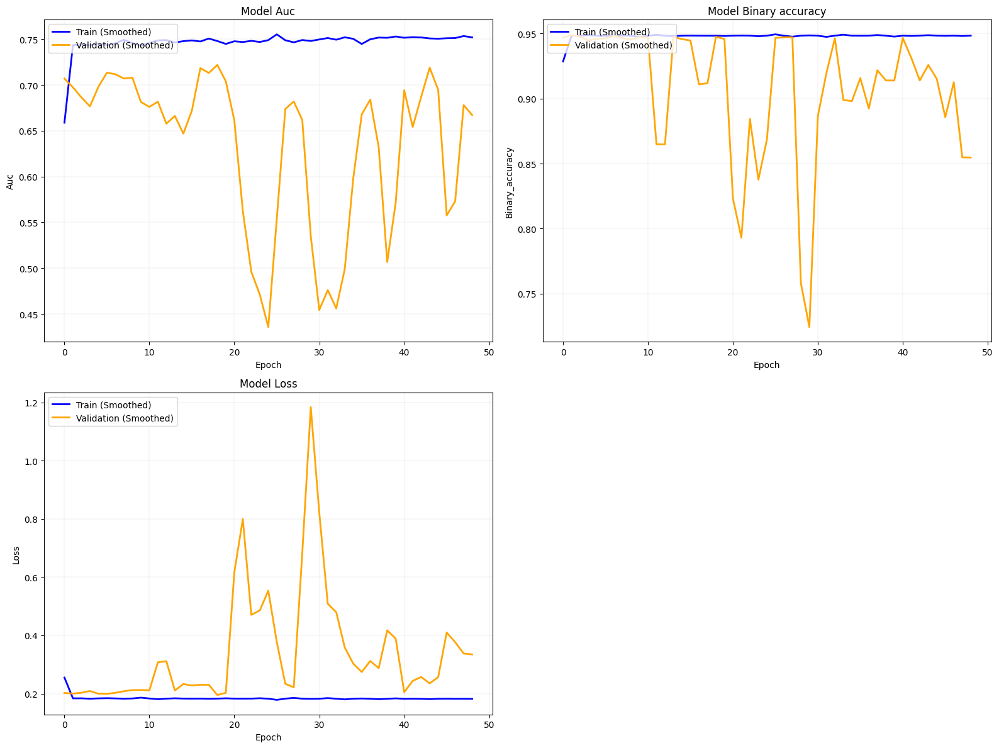

In [ ]:
plot_training_history(simple_model_BCE_224_local_history)

#### Model Evaluation

In [ ]:
file_path_simple_model_BCE = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_224_local.keras'
file_path_simple_model_BCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_224_local_history.pkl'
# Load the model
simple_model_BCE_224_local = load_model(file_path_simple_model_BCE)
simple_model_BCE_224_local_history = pickle.load(open(file_path_simple_model_BCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = data_generator(train_masked_images_224_cnn, train_masked_labels_224_cnn, batch_size, datagen)
val_generator = data_generator(val_masked_images_224_cnn, val_masked_labels_224_cnn, batch_size, datagen_val)
test_generator = data_generator(test_masked_images_224_cnn, test_masked_labels_224_cnn, batch_size, datagen_val)

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 119ms/step - auc: 0.6894 - binary_accuracy: 0.9475 - loss: 0.2010
Test Loss: 0.19532641768455505
Test AUC: 0.6914513111114502
Test Binary Accuracy: 0.9492027163505554
35/35 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step
Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.11      0.78      0.19       211
      cardiomegaly       0.05      0.21      0.08        61
          effusion       0.17      0.42      0.24       255
      infiltration       0.20      0.70      0.32       391
              mass       0.06      0.86      0.11       132
            nodule       0.06      0.97      0.11       132
         pneumonia       0.00      0.00      0.00        24
      pneumothorax       0.05      0.73      0.09       101
     consolidation       0.08      0.43      0.14        95
             edema       0.05      0.27      0.08        41
         emphysema       0.04      0.08      0.05        50
          fibros

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


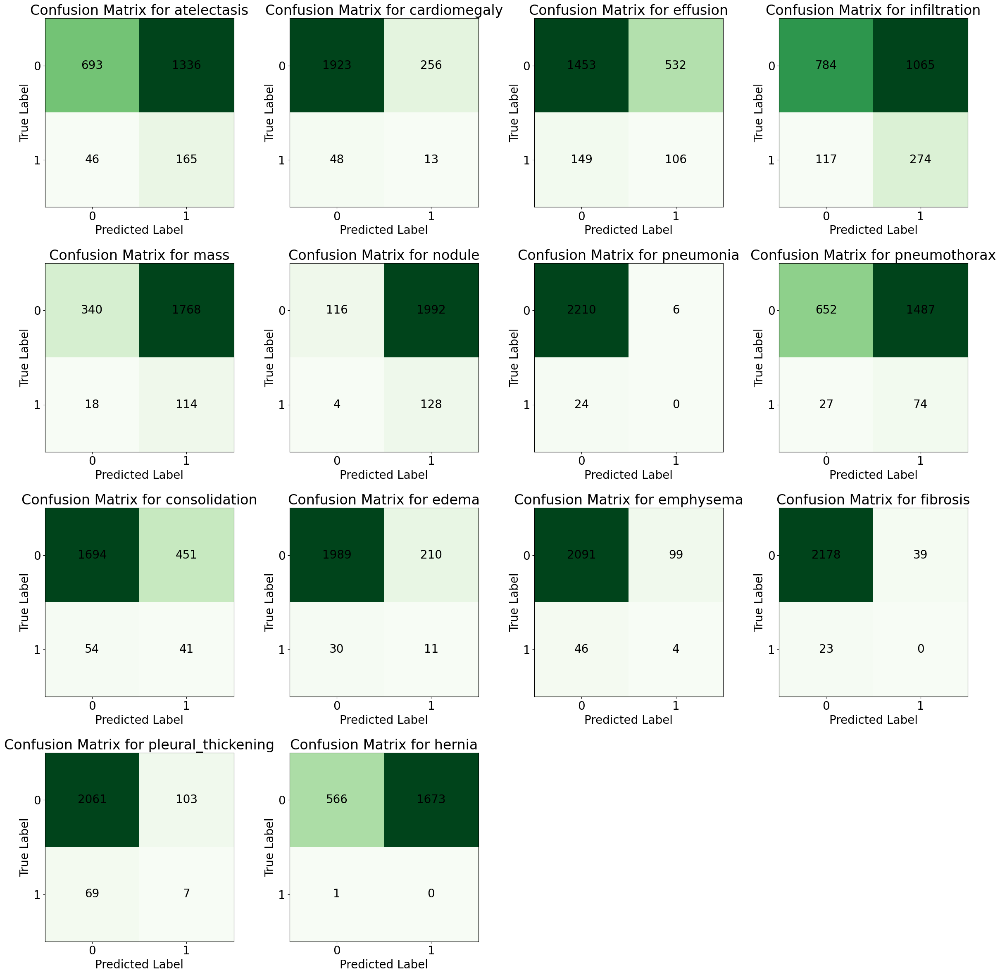

In [ ]:
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_masked_images_224_cnn) // batch_size
evaluation = simple_model_BCE_224_local.evaluate(test_generator, steps=steps_per_epoch)

class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])
print("Test Binary Accuracy:", evaluation[1])

y_probs = simple_model_BCE_224_local.predict(test_generator, steps=steps_per_epoch)
y_true = test_masked_labels_224_cnn

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.0022
Hamming Loss: 0.3722
Macro F1-score: 0.1066
Micro F1-score: 0.1383


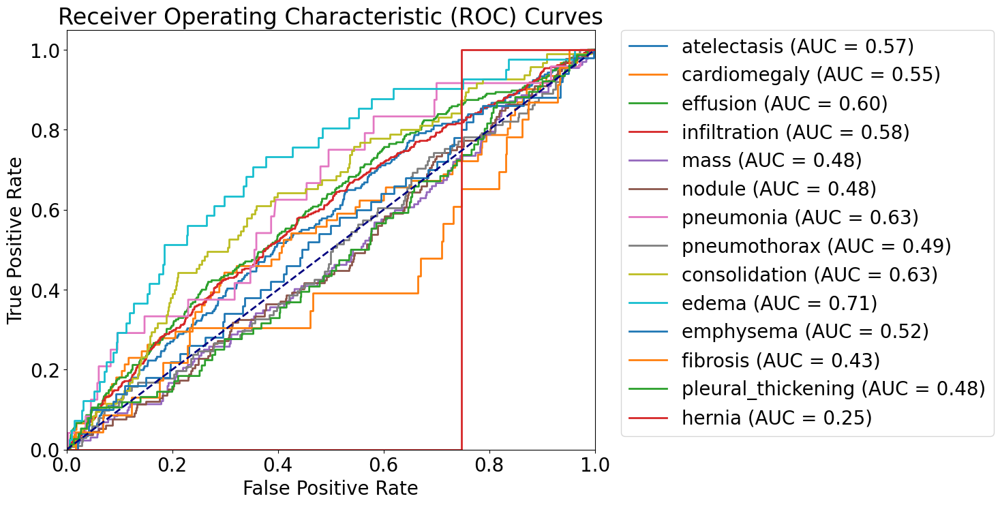

In [ ]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Loading Saved Masked Data - WCE

In [ ]:
data_train_masked_64_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_WCE/train_masked_64_cnn.npz')
train_masked_images_64_cnn = data_train_masked_64_cnn['images']
train_masked_images_64_cnn = np.squeeze(train_masked_images_64_cnn)
train_masked_labels_64_cnn = data_train_masked_64_cnn['labels']
train_masked_labels_64_cnn = np.squeeze(train_masked_labels_64_cnn)

In [ ]:
data_val_masked_64_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_WCE/val_masked_64_cnn.npz')
val_masked_images_64_cnn = data_val_masked_64_cnn['images']
val_masked_images_64_cnn = np.squeeze(val_masked_images_64_cnn)
val_masked_labels_64_cnn = data_val_masked_64_cnn['labels']
val_masked_labels_64_cnn = np.squeeze(val_masked_labels_64_cnn)

In [ ]:
data_test_masked_64_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_WCE/test_masked_64_cnn.npz')
test_masked_images_64_cnn = data_test_masked_64_cnn['images']
test_masked_images_64_cnn = np.squeeze(test_masked_images_64_cnn)
test_masked_labels_64_cnn = data_test_masked_64_cnn['labels']
test_masked_labels_64_cnn = np.squeeze(test_masked_labels_64_cnn)

In [ ]:
data_train_masked_128_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_WCE/train_masked_128_cnn.npz')
train_masked_images_128_cnn = data_train_masked_128_cnn['images']
train_masked_images_128_cnn = np.squeeze(train_masked_images_128_cnn)
train_masked_labels_128_cnn = data_train_masked_128_cnn['labels']
train_masked_labels_128_cnn = np.squeeze(train_masked_labels_128_cnn)

In [ ]:
data_val_masked_128_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_WCE/val_masked_128_cnn.npz')
val_masked_images_128_cnn = data_val_masked_128_cnn['images']
val_masked_images_128_cnn = np.squeeze(val_masked_images_128_cnn)
val_masked_labels_128_cnn = data_val_masked_128_cnn['labels']
val_masked_labels_128_cnn = np.squeeze(val_masked_labels_128_cnn)

In [ ]:
data_test_masked_128_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_WCE/test_masked_128_cnn.npz')
test_masked_images_128_cnn = data_test_masked_128_cnn['images']
test_masked_images_128_cnn = np.squeeze(test_masked_images_128_cnn)
test_masked_labels_128_cnn = data_test_masked_128_cnn['labels']
test_masked_labels_128_cnn = np.squeeze(test_masked_labels_128_cnn)

In [ ]:
data_train_masked_224_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_WCE/train_masked_224_cnn.npz')
train_masked_images_224_cnn = data_train_masked_224_cnn['images']
train_masked_images_224_cnn = np.squeeze(train_masked_images_224_cnn)
train_masked_labels_224_cnn = data_train_masked_224_cnn['labels']
train_masked_labels_224_cnn = np.squeeze(train_masked_labels_224_cnn)

In [ ]:
data_val_masked_224_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_WCE/val_masked_224_cnn.npz')
val_masked_images_224_cnn = data_val_masked_224_cnn['images']
val_masked_images_224_cnn = np.squeeze(val_masked_images_224_cnn)
val_masked_labels_224_cnn = data_val_masked_224_cnn['labels']
val_masked_labels_224_cnn = np.squeeze(val_masked_labels_224_cnn)

In [ ]:
data_test_masked_224_cnn = np.load('/content/drive/My Drive/ChestMNIST/Masked_WCE/test_masked_224_cnn.npz')
test_masked_images_224_cnn = data_test_masked_224_cnn['images']
test_masked_images_224_cnn = np.squeeze(test_masked_images_224_cnn)
test_masked_labels_224_cnn = data_test_masked_224_cnn['labels']
test_masked_labels_224_cnn = np.squeeze(test_masked_labels_224_cnn)

### Simple CNN - 64 - Local - loss: Weighted Cross-Entropy

In [ ]:
train_generator = data_generator(train_masked_images_64_cnn, train_masked_labels_64_cnn, batch_size, datagen)
val_generator = data_generator(val_masked_images_64_cnn, val_masked_labels_64_cnn, batch_size, datagen_val)
test_generator = data_generator(test_masked_images_64_cnn, test_masked_labels_64_cnn, batch_size, datagen_val)

In [ ]:
simple_model_WCE_local, simple_model_WCE_local_history = train_and_save_cnn(
    loss = weighted_cross_entropy_loss,
    batch_size = 64,
    num_epochs = 50,
    model = create_custom_cnn_local(input_shape=(64, 64, 1), num_classes=14),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_WCE_local'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 64, 64, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 64, 64, 64)          │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 8, 8, 1024)          │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 8, 8, 1024)          │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 16s 47ms/step - auc: 0.5678 - binary_accuracy: 0.6123 - loss: 1.2855 - val_auc: 0.4412 - val_binary_accuracy: 0.6767 - val_loss: 3.0710
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - auc: 0.6638 - binary_accuracy: 0.7347 - loss: 1.1001 - val_auc: 0.6021 - val_binary_accuracy: 0.7122 - val_loss: 1.6294
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - auc: 0.6719 - binary_accuracy: 0.7644 - loss: 1.0986 - val_auc: 0.6524 - val_binary_accuracy: 0.7360 - val_loss: 1.2864
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - auc: 0.6855 - binary_accuracy: 0.7764 - loss: 1.0803 - val_auc: 0.6028 - val_binary_accuracy: 0.8021 - val_loss: 1.3460
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - auc: 0.6889 - binary_accuracy: 0.7701 - loss: 1.0652 - val_auc: 0.5410 - val_binary_accuracy: 0.6760 - val_loss: 1.3852
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - auc: 0.6891 - binary_accuracy: 0.7797 - loss: 1.0700 - val_auc: 0.6

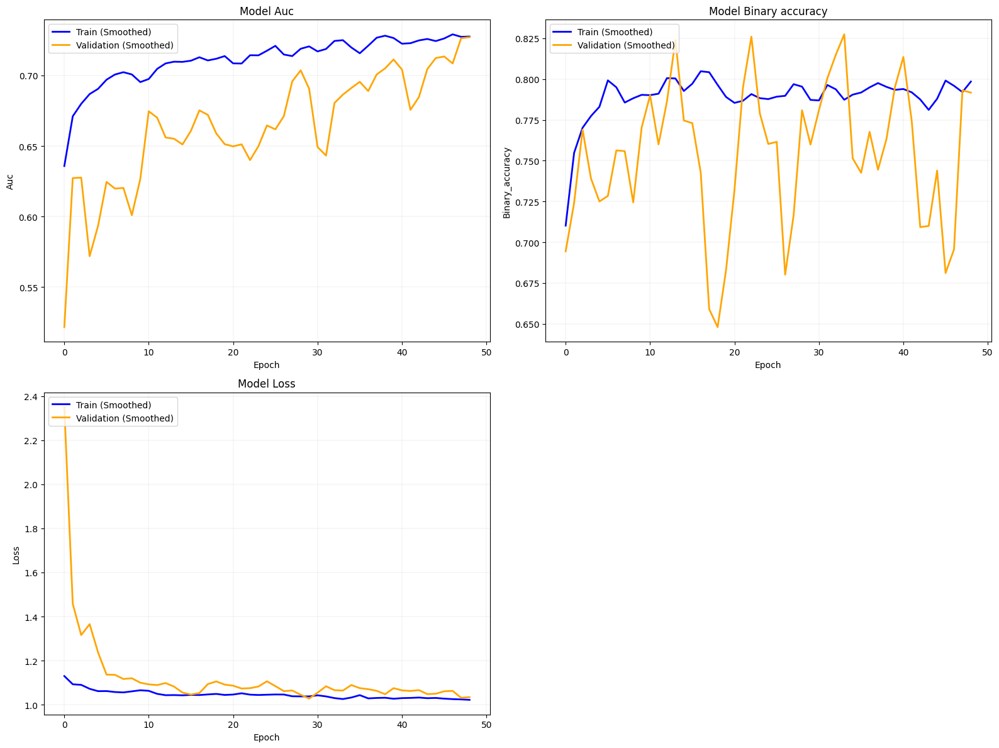

In [ ]:
plot_training_history(simple_model_WCE_local_history)

#### Model Evaluation

In [ ]:
file_path_simple_model_WCE = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_local.keras'
file_path_simple_model_WCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_local_history.pkl'
# Load the model
simple_model_WCE_local = load_model(file_path_simple_model_WCE,
                              custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})
simple_model_WCE_local_history = pickle.load(open(file_path_simple_model_WCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = data_generator(train_masked_images_64_cnn, train_masked_labels_64_cnn, batch_size, datagen)
val_generator = data_generator(val_masked_images_64_cnn, val_masked_labels_64_cnn, batch_size, datagen_val)
test_generator = data_generator(test_masked_images_64_cnn, test_masked_labels_64_cnn, batch_size, datagen_val)

35/35 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - auc: 0.7231 - binary_accuracy: 0.7821 - loss: 1.1947
Test Loss: 1.1864093542099
Test AUC: 0.7251642942428589
Test Binary Accuracy: 0.7794961929321289
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.15      0.38      0.21       211
      cardiomegaly       0.07      0.10      0.08        61
          effusion       0.16      0.67      0.26       255
      infiltration       0.22      0.62      0.33       391
              mass       0.07      0.51      0.12       132
            nodule       0.06      0.73      0.12       132
         pneumonia       0.02      0.38      0.03        24
      pneumothorax       0.06      0.41      0.11       101
     consolidation       0.09      0.36      0.14        95
             edema       0.06      0.29      0.10        41
         emphysema       0.06      0.22      0.10        50
          fibrosis       0.01      0.04      0.02        23
pleural_thickening       0.06      0.26      0.10        76
            hernia       0.00      0.00      0.00         1

         micro avg       0.09      0.50      0.15      1593
         macro

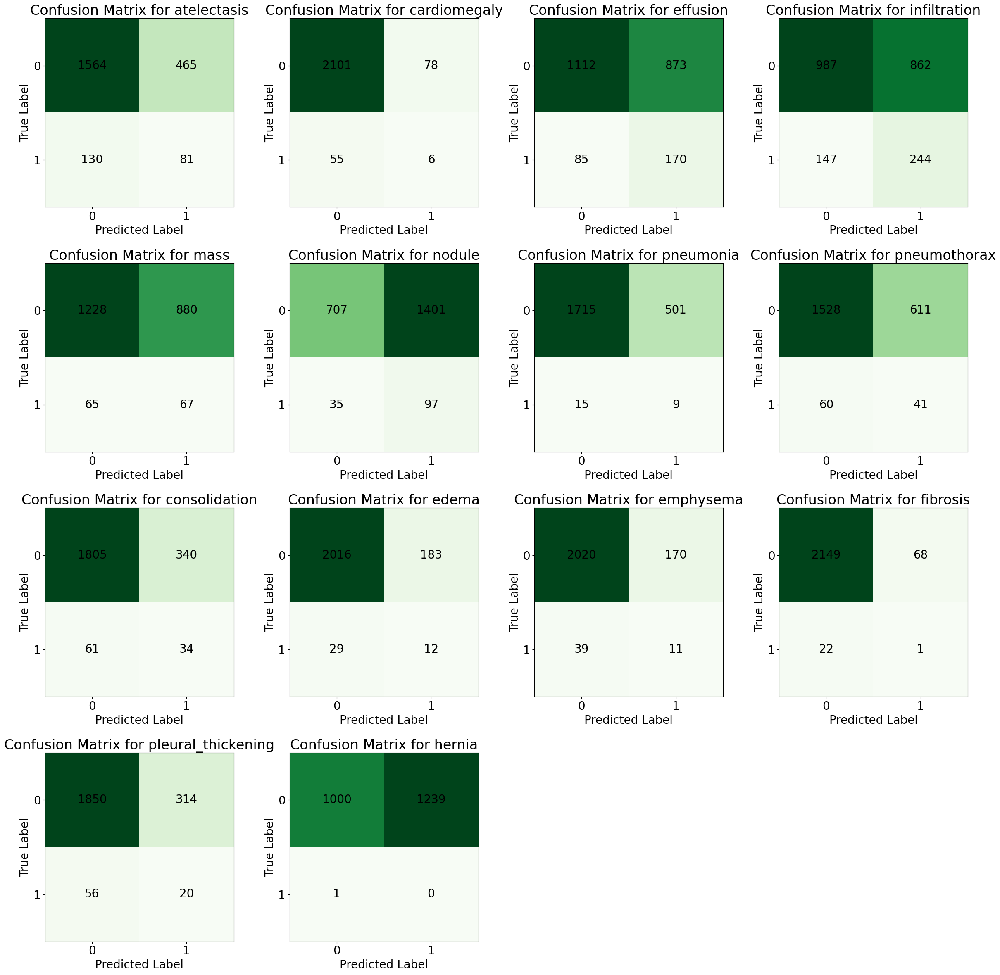

In [ ]:
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_masked_images_64_cnn) // batch_size
evaluation = simple_model_WCE_local.evaluate(test_generator, steps=steps_per_epoch)

class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])
print("Test Binary Accuracy:", evaluation[1])

y_probs = simple_model_WCE_local.predict(test_generator, steps=steps_per_epoch)
y_true = test_masked_labels_64_cnn

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.0304
Hamming Loss: 0.2801
Macro F1-score: 0.1237
Micro F1-score: 0.1529


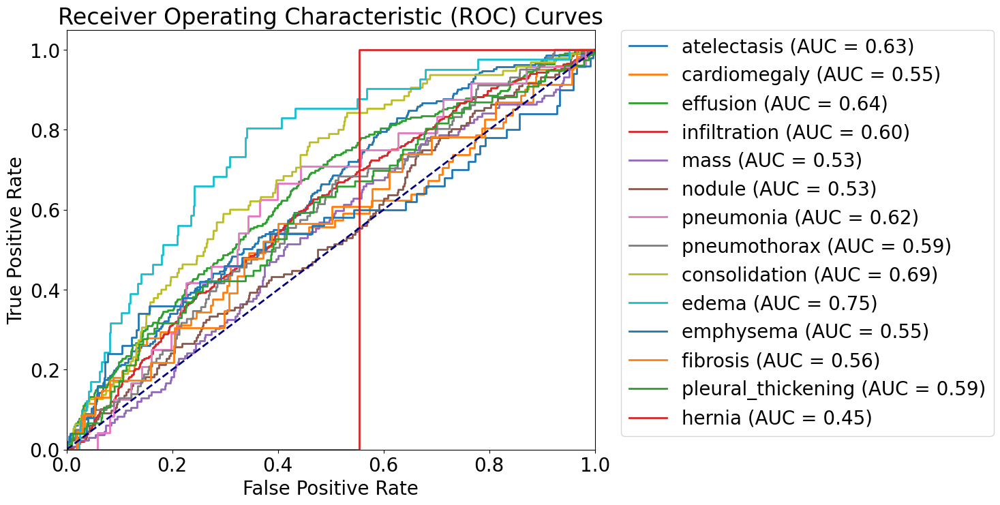

In [ ]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Simple CNN - 128 - Local - loss: Weighted Cross-Entropy

In [ ]:
train_generator = data_generator(train_masked_images_128_cnn, train_masked_labels_128_cnn, batch_size, datagen)
val_generator = data_generator(val_masked_images_128_cnn, val_masked_labels_128_cnn, batch_size, datagen_val)
test_generator = data_generator(test_masked_images_128_cnn, test_masked_labels_128_cnn, batch_size, datagen_val)

In [ ]:
simple_model_WCE_128_local, simple_model_WCE_128_local_history = train_and_save_cnn(
    loss = weighted_cross_entropy_loss,
    batch_size = 64,
    num_epochs = 50,
    model = create_custom_cnn_local(input_shape=(128, 128, 1), num_classes=14),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_WCE_128_local'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 128, 128, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 29s 111ms/step - auc: 0.5727 - binary_accuracy: 0.6248 - loss: 1.2151 - val_auc: 0.5170 - val_binary_accuracy: 0.6620 - val_loss: 1.3775
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 16s 135ms/step - auc: 0.6751 - binary_accuracy: 0.7897 - loss: 1.0828 - val_auc: 0.5868 - val_binary_accuracy: 0.8397 - val_loss: 1.5688
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - auc: 0.7003 - binary_accuracy: 0.7998 - loss: 1.0706 - val_auc: 0.4912 - val_binary_accuracy: 0.8266 - val_loss: 1.6308
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - auc: 0.6824 - binary_accuracy: 0.7952 - loss: 1.0640 - val_auc: 0.5238 - val_binary_accuracy: 0.9110 - val_loss: 1.6835
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - auc: 0.7044 - binary_accuracy: 0.7991 - loss: 1.0736 - val_auc: 0.6179 - val_binary_accuracy: 0.8748 - val_loss: 1.2017
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - auc: 0.6826 - binary_accuracy: 0.7974 - loss: 1.0884 - val_auc

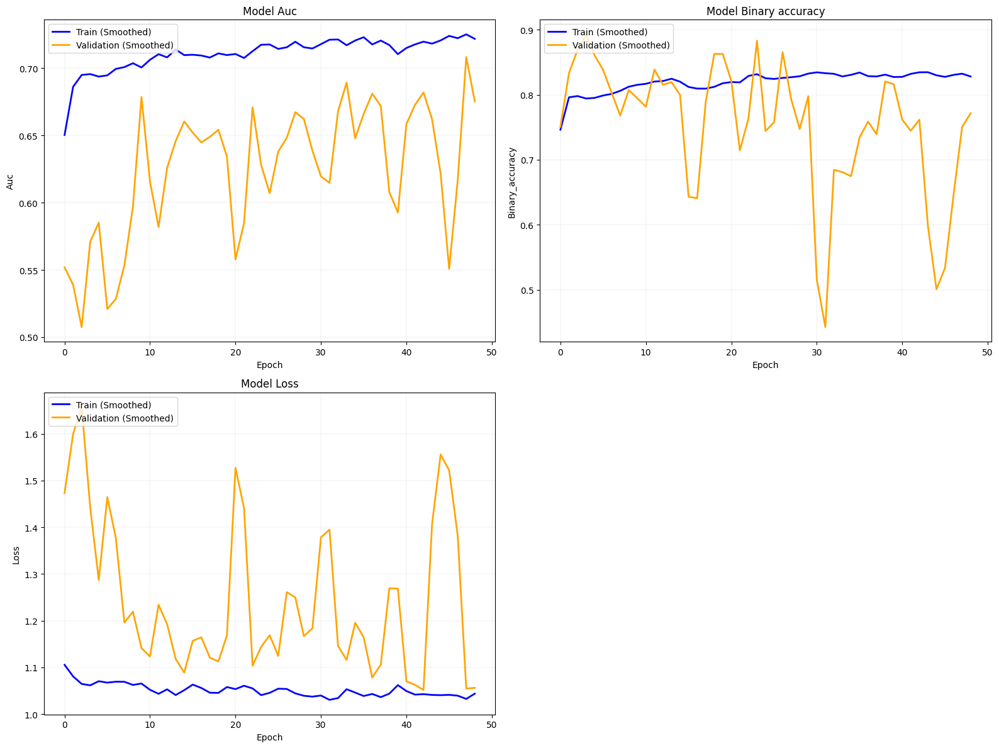

In [ ]:
plot_training_history(simple_model_WCE_128_local_history)

#### Model Evaluation

In [ ]:
file_path_simple_model_WCE = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_128_local.keras'
file_path_simple_model_WCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_128_local_history.pkl'
# Load the model
simple_model_WCE_128_local = load_model(file_path_simple_model_WCE,
                              custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})
simple_model_WCE_128_local_history = pickle.load(open(file_path_simple_model_WCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = data_generator(train_masked_images_128_cnn, train_masked_labels_128_cnn, batch_size, datagen)
val_generator = data_generator(val_masked_images_128_cnn, val_masked_labels_128_cnn, batch_size, datagen_val)
test_generator = data_generator(test_masked_images_128_cnn, test_masked_labels_128_cnn, batch_size, datagen_val)

35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - auc: 0.7782 - binary_accuracy: 0.9476 - loss: 0.1814
Test Loss: 0.17635540664196014
Test AUC: 0.7789982557296753
Test Binary Accuracy: 0.9491389393806458
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.19      0.53      0.27       211
      cardiomegaly       0.27      0.07      0.11        61
          effusion       0.28      0.53      0.37       255
      infiltration       0.25      0.60      0.35       391
              mass       0.12      0.20      0.15       132
            nodule       0.06      0.76      0.11       132
         pneumonia       0.03      0.08      0.04        24
      pneumothorax       0.09      0.22      0.13       101
     consolidation       0.13      0.35      0.19        95
             edema       0.07      0.51      0.12        41
         emphysema       0.07      0.08      0.08        50
          fibrosis       0.04      0.30      0.07        23
pleural_thickening       0.16      0.14      0.15        76
            hernia       0.00      0.00      0.00         1

         micro avg       0.14      0.45      0.21      1593
         macro

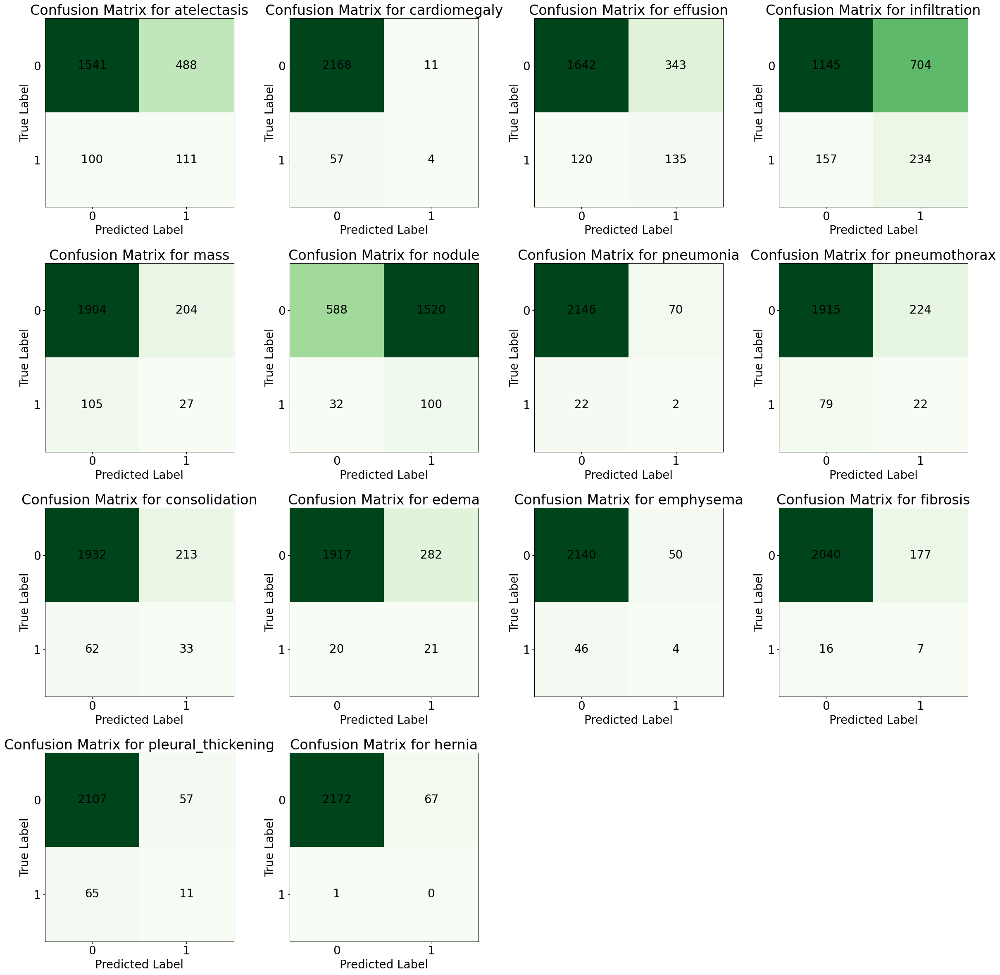

In [ ]:
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_masked_images_128_cnn) // batch_size
evaluation = simple_model_WCE_128_local.evaluate(test_generator, steps=steps_per_epoch)


class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])
print("Test Binary Accuracy:", evaluation[1])

y_probs = simple_model_WCE_128_local.predict(test_generator, steps=steps_per_epoch)
y_true = test_masked_labels_128_cnn

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.1411
Hamming Loss: 0.1688
Macro F1-score: 0.1532
Micro F1-score: 0.2118


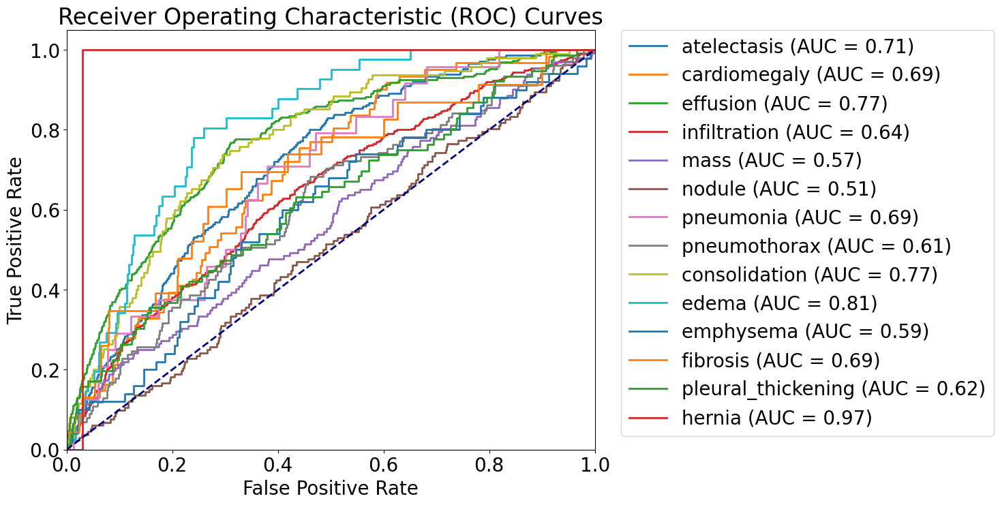

In [ ]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Simple CNN - 224 - Local - loss: Weighted Cross-Entropy

In [ ]:
train_generator = data_generator(train_masked_images_224_cnn, train_masked_labels_224_cnn, batch_size, datagen)
val_generator = data_generator(val_masked_images_224_cnn, val_masked_labels_224_cnn, batch_size, datagen_val)
test_generator = data_generator(test_masked_images_224_cnn, test_masked_labels_224_cnn, batch_size, datagen_val)

In [ ]:
simple_model_WCE_224_local, simple_model_WCE_224_local_history = train_and_save_cnn(
    loss = weighted_cross_entropy_loss,
    batch_size = 64,
    num_epochs = 50,
    model = create_custom_cnn_local(input_shape=(224, 224, 1), num_classes=14),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_WCE_224_local'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 224, 224, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 224, 224, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 112, 112, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 56, 56, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 28, 28, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 28, 28, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 28, 28, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

Epoch 1/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 59s 262ms/step - auc: 0.5846 - binary_accuracy: 0.6673 - loss: 1.1866 - val_auc: 0.4665 - val_binary_accuracy: 0.7336 - val_loss: 1.7655
Epoch 2/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 77s 632ms/step - auc: 0.6763 - binary_accuracy: 0.7984 - loss: 1.0963 - val_auc: 0.4979 - val_binary_accuracy: 0.7896 - val_loss: 1.6555
Epoch 3/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 26s 214ms/step - auc: 0.6989 - binary_accuracy: 0.8153 - loss: 1.0559 - val_auc: 0.5625 - val_binary_accuracy: 0.7659 - val_loss: 1.4190
Epoch 4/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - auc: 0.6997 - binary_accuracy: 0.8069 - loss: 1.0702 - val_auc: 0.5792 - val_binary_accuracy: 0.6308 - val_loss: 1.6100
Epoch 5/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - auc: 0.6986 - binary_accuracy: 0.8283 - loss: 1.0620 - val_auc: 0.5212 - val_binary_accuracy: 0.6487 - val_loss: 1.5232
Epoch 6/50
123/123 ━━━━━━━━━━━━━━━━━━━━ 27s 218ms/step - auc: 0.6933 - binary_accuracy: 0.8150 - loss: 1.0929 - val

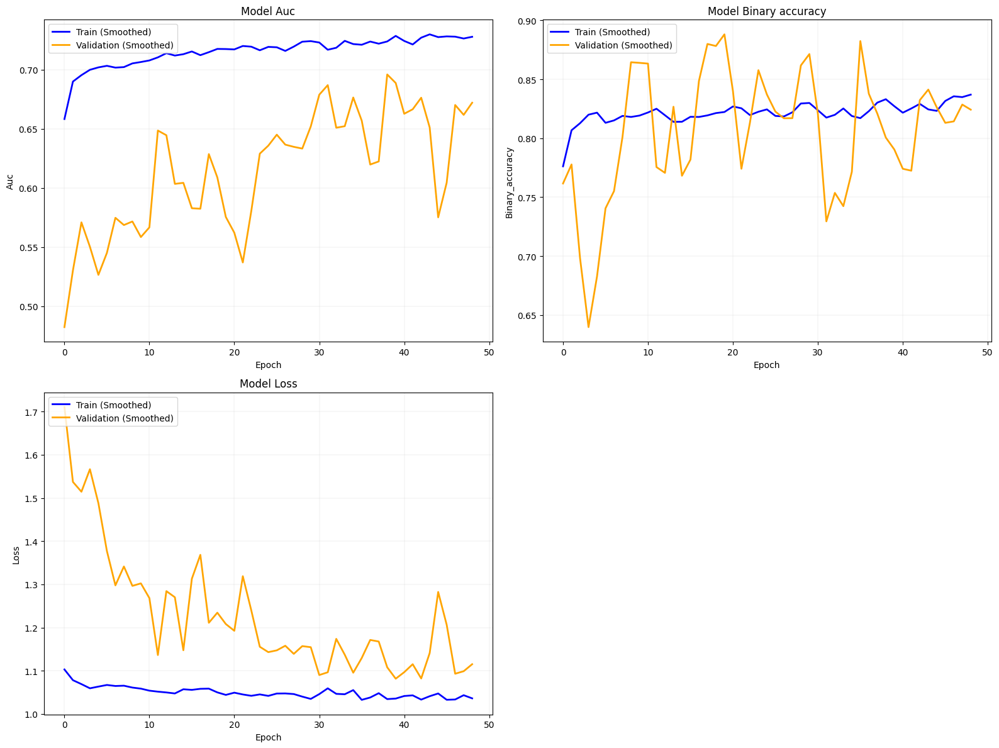

In [ ]:
plot_training_history(simple_model_WCE_224_local_history)

#### Model Evaluation

In [ ]:
file_path_simple_model_WCE = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_224_local.keras'
file_path_simple_model_WCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_224_local_history.pkl'
# Load the model
simple_model_WCE_224_local = load_model(file_path_simple_model_WCE,
                              custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})
simple_model_WCE_224_local_history = pickle.load(open(file_path_simple_model_WCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = data_generator(train_masked_images_224_cnn, train_masked_labels_224_cnn, batch_size, datagen)
val_generator = data_generator(val_masked_images_224_cnn, val_masked_labels_224_cnn, batch_size, datagen_val)
test_generator = data_generator(test_masked_images_224_cnn, test_masked_labels_224_cnn, batch_size, datagen_val)

35/35 ━━━━━━━━━━━━━━━━━━━━ 15s 117ms/step - auc: 0.6751 - binary_accuracy: 0.8154 - loss: 1.2920
Test Loss: 1.2780277729034424
Test AUC: 0.6856481432914734
Test Binary Accuracy: 0.8182079792022705
35/35 ━━━━━━━━━━━━━━━━━━━━ 5s 116ms/step
Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.16      0.35      0.22       211
      cardiomegaly       0.04      0.39      0.07        61
          effusion       0.16      0.73      0.26       255
      infiltration       0.20      0.78      0.32       391
              mass       0.08      0.24      0.12       132
            nodule       0.11      0.13      0.12       132
         pneumonia       0.00      0.00      0.00        24
      pneumothorax       0.05      0.97      0.09       101
     consolidation       0.08      0.59      0.14        95
             edema       0.04      0.24      0.07        41
         emphysema       0.05      0.22      0.08        50
          fibrosi

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


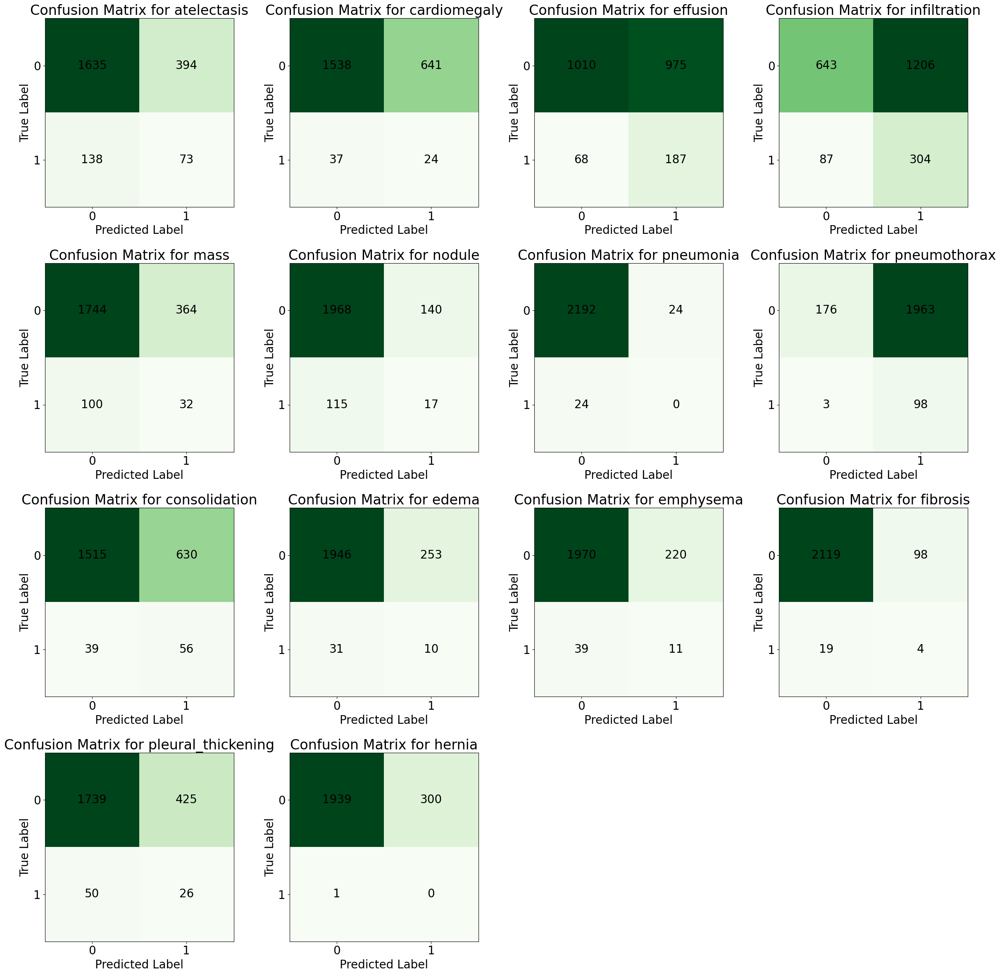

In [ ]:
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_masked_images_224_cnn) // batch_size
evaluation = simple_model_WCE_224_local.evaluate(test_generator, steps=steps_per_epoch)

class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])
print("Test Binary Accuracy:", evaluation[1])


y_probs = simple_model_WCE_224_local.predict(test_generator, steps=steps_per_epoch)
y_true = test_masked_labels_224_cnn

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.0196
Hamming Loss: 0.2673
Macro F1-score: 0.1175
Micro F1-score: 0.1673


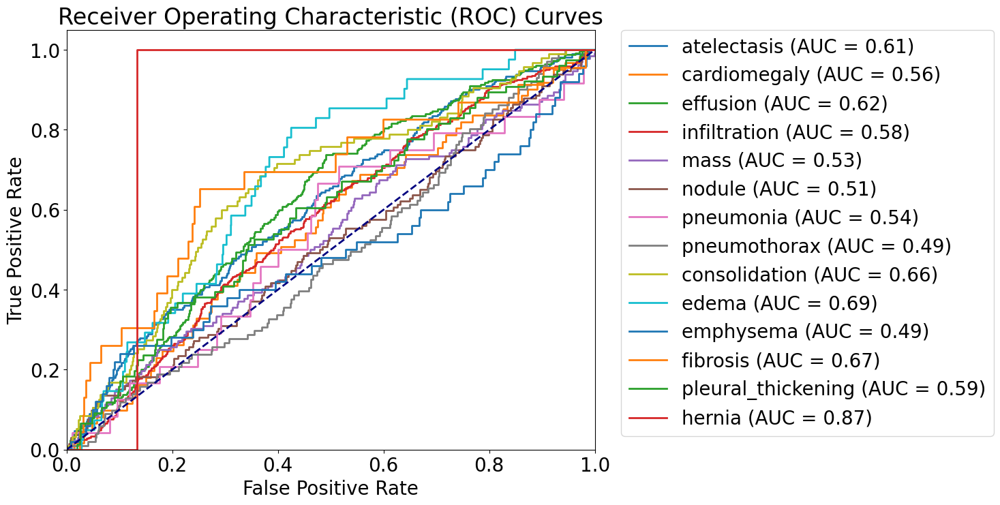

In [ ]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


## Fusion Branch with CNN

### Generating DataSet and Model Creator Function for Fusion

In [ ]:
def dual_data_generator(global_images, local_images, labels, batch_size, datagen=None):
    while True:
        indices = np.arange(len(labels))
        # np.random.shuffle(indices)

        for start in range(0, len(labels), batch_size):
            end = min(start + batch_size, len(labels))
            batch_indices = indices[start:end]

            batch_global_images = global_images[batch_indices]
            batch_local_images = local_images[batch_indices]
            batch_labels = labels[batch_indices]

            # Add channel dimension for grayscale images
            batch_global_images = np.expand_dims(batch_global_images, axis=-1)
            batch_local_images = np.expand_dims(batch_local_images, axis=-1)

            # Apply augmentation if provided
            if datagen:
                batch_global_images = np.array([datagen.random_transform(img) for img in batch_global_images])
                batch_local_images = np.array([datagen.random_transform(img) for img in batch_local_images])

            yield (batch_global_images, batch_local_images), batch_labels


In [ ]:
# Function to rename the layers of a model
def rename_model_layers(model, prefix):
    config = model.get_config()
    for layer in config['layers']:
        layer['config']['name'] = prefix + layer['config']['name']
    new_model = Model.from_config(config)
    new_model.set_weights(model.get_weights())
    return new_model

In [ ]:
# Create the fusion model
def create_fusion_model(global_model, local_model):

    K.clear_session()

    for layer in global_branch.layers:
      layer.trainable = False

    for layer in local_branch.layers:
      layer.trainable = False

    # Take the outputs of the last pooling layers
    global_output = global_model.get_layer('global_global_average_pooling2d').output
    global_output = layers.Dense(14, activation='sigmoid')(global_output)
    local_output = local_model.get_layer('local_global_average_pooling2d').output
    local_output = layers.Dense(14, activation='sigmoid')(local_output)
    # Concatenate the outputs of the global and local branches
    combined_input = layers.concatenate([global_output, local_output])

    x = layers.Dense(14, activation='sigmoid')(combined_input)

    model = models.Model(inputs=[global_model.input, local_model.input], outputs=x)
    return model

### Simple CNN - 64 - Fusion - loss: Binary Cross-Entropy

In [ ]:
batch_size = 32
train_generator = dual_data_generator(train_images_64, train_masked_images_64_cnn, train_labels_64, batch_size)
val_generator = dual_data_generator(val_images_64, val_masked_images_64_cnn, val_labels_64, batch_size)
test_generator = dual_data_generator(test_images_64, test_masked_images_64_cnn, test_labels_64, batch_size)

In [ ]:
# Load the pre-trained global and local models
global_branch = load_model('/content/drive/My Drive/ChestMNIST/simple_model_BCE.keras')
local_branch = load_model('/content/drive/My Drive/ChestMNIST/simple_model_BCE_local.keras')

In [ ]:
# Rename the layers of the global and local models
global_branch = rename_model_layers(global_branch, 'global_')
local_branch = rename_model_layers(local_branch, 'local_')

In [ ]:
global_branch.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ global_input_layer (InputLayer)      │ (None, 64, 64, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d (Conv2D)               │ (None, 64, 64, 64)          │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization           │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d (MaxPooling2D)  │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_1 (Conv2D)             │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_1         │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_1               │ (None, 16, 16, 128)         │               0 │
│ (MaxPooling2D)                       │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_2 (Conv2D)             │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_2         │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_2               │ (None, 8, 8, 256)           │               0 │
│ (MaxPooling2D)                       │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_3 (Conv2D)             │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_3         │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_4 (Conv2D)             │ (None, 8, 8, 1024)          │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_4         │ (None, 8, 8, 1024)          │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_global_average_pooling2d      │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_dense (Dense)                 │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
local_branch.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ local_input_layer (InputLayer)       │ (None, 64, 64, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d (Conv2D)                │ (None, 64, 64, 64)          │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization            │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d (MaxPooling2D)   │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_1 (Conv2D)              │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_1          │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d_1 (MaxPooling2D) │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_2 (Conv2D)              │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_2          │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d_2 (MaxPooling2D) │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_3 (Conv2D)              │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_3          │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_4 (Conv2D)              │ (None, 8, 8, 1024)          │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_4          │ (None, 8, 8, 1024)          │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_global_average_pooling2d       │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_dense (Dense)                  │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
simple_model_BCE_fusion, simple_model_BCE_fusion_history = train_and_save_cnn(
    loss = 'binary_crossentropy',
    batch_size = 32,
    num_epochs = 17,
    model = create_fusion_model(global_branch, local_branch),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_BCE_fusion'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ global_input_layer        │ (None, 64, 64, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_input_layer         │ (None, 64, 64, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d (Conv2D)    │ (None, 64, 64, 64)     │            640 │ global_input_layer[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_conv2d (Conv2D)     │ (None, 64, 64, 64)     │            640 │ local_input_layer[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_batch_normalizati… │ (None, 64, 64, 64)     │            256 │ global_conv2d[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_batch_normalization │ (None, 64, 64, 64)     │            256 │ local_conv2d[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling2d      │ (None, 32, 32, 64)     │              0 │ global_batch_normaliz… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_max_pooling2d       │ (None, 32, 32, 64)     │              0 │ local_batch_normaliza… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d_1 (Conv2D)  │ (None, 32, 32, 128)    │         73,856 │ global_max_pooling2d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_conv2d_1 (Conv2D)   │ (None, 32, 32, 128)    │         73,856 │ local_max_pooling2d[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_batch_normalizati… │ (None, 32, 32, 128)    │            512 │ global_conv2d_1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_batch_normalizatio… │ (None, 32, 32, 128)    │            512 │ local_conv2d_1[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling2d_1    │ (None, 16, 16, 128)    │              0 │ global_batch_normaliz… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_max_pooling2d_1     │ (None, 16, 16, 128)    │              0 │ local_batch_normaliza… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d_2 (Conv

 Total params: 12,583,858 (48.00 MB)

 Trainable params: 29,106 (113.70 KB)

 Non-trainable params: 12,554,752 (47.89 MB)

Epoch 1/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - auc: 0.6055 - binary_accuracy: 0.8518 - loss: 0.4104 - val_auc: 0.7400 - val_binary_accuracy: 0.9465 - val_loss: 0.1920
Epoch 2/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - auc: 0.7468 - binary_accuracy: 0.9485 - loss: 0.1847 - val_auc: 0.7626 - val_binary_accuracy: 0.9472 - val_loss: 0.1822
Epoch 3/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - auc: 0.7662 - binary_accuracy: 0.9495 - loss: 0.1761 - val_auc: 0.7758 - val_binary_accuracy: 0.9470 - val_loss: 0.1798
Epoch 4/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - auc: 0.7714 - binary_accuracy: 0.9486 - loss: 0.1766 - val_auc: 0.7744 - val_binary_accuracy: 0.9465 - val_loss: 0.1813
Epoch 5/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - auc: 0.7869 - binary_accuracy: 0.9491 - loss: 0.1726 - val_auc: 0.7842 - val_binary_accuracy: 0.9466 - val_loss: 0.1794
Epoch 6/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - auc: 0.7837 - binary_accuracy: 0.9487 - loss: 0.1741 - val_auc: 0.7

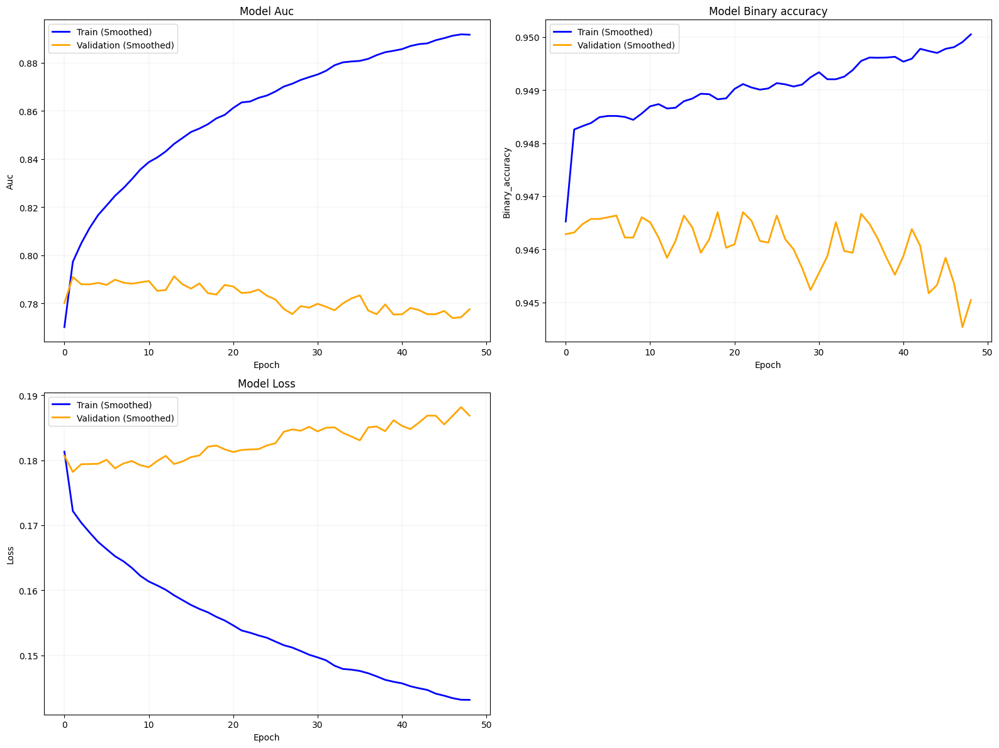

In [ ]:
plot_training_history(simple_model_BCE_fusion_history)

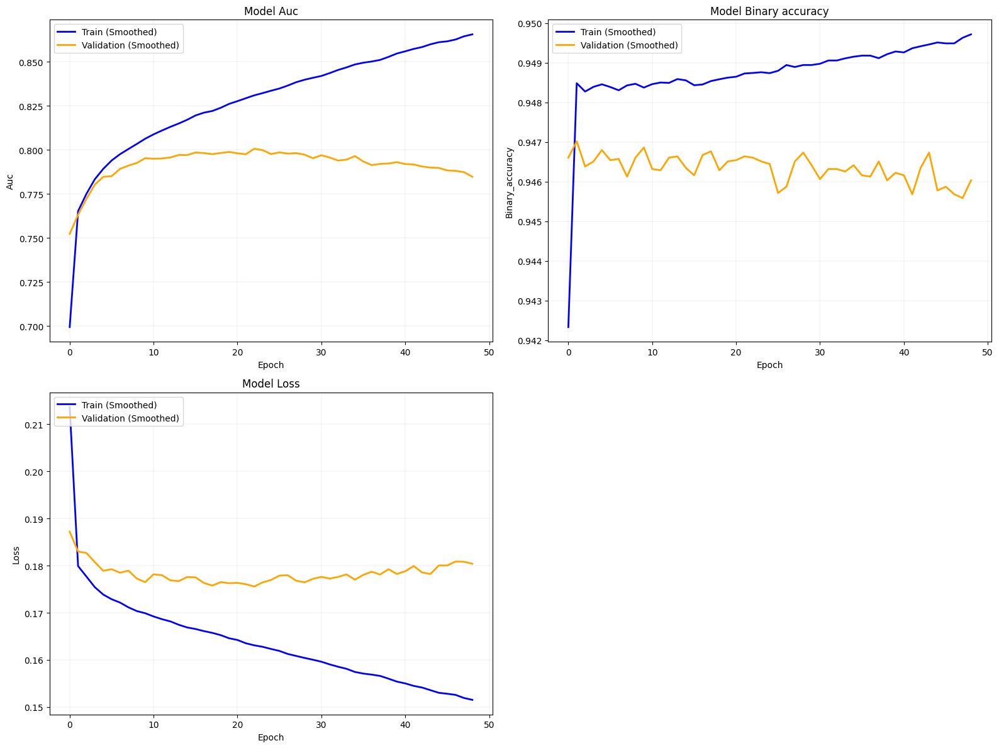

In [ ]:
plot_training_history(simple_model_BCE_fusion_history)

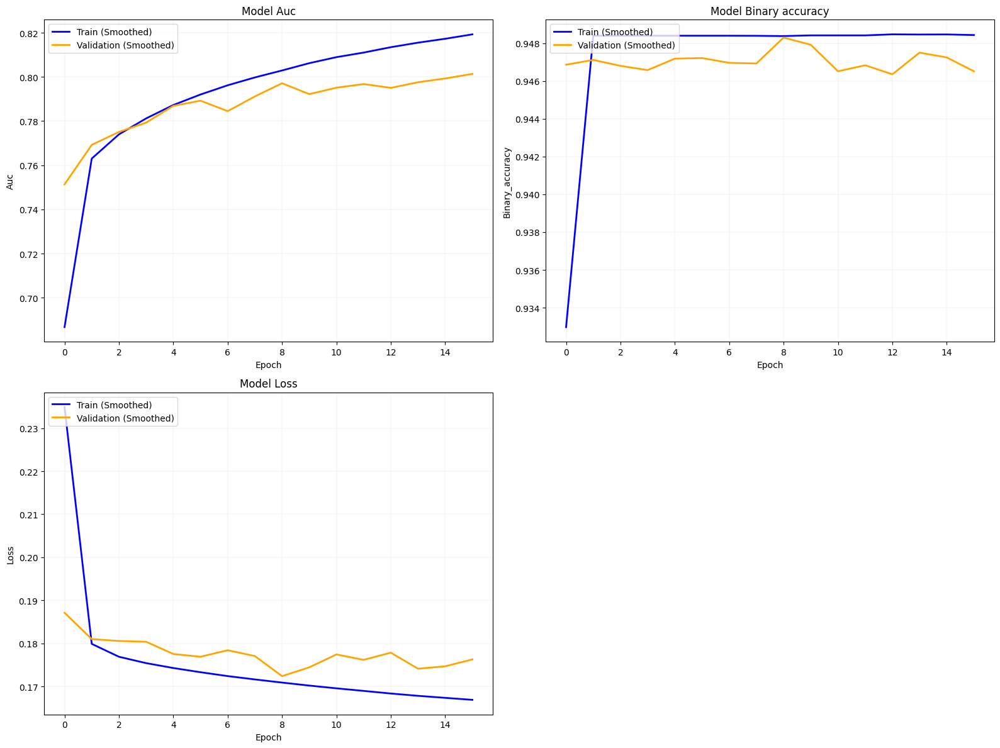

In [ ]:
plot_training_history(simple_model_BCE_fusion_history)

#### Model Evaluation

In [ ]:
file_path_simple_model_BCE = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_fusion.keras'
file_path_simple_model_BCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_fusion_history.pkl'
# Load the model
simple_model_BCE_fusion = load_model(file_path_simple_model_BCE)
simple_model_BCE_fusion_history = pickle.load(open(file_path_simple_model_BCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = dual_data_generator(train_images_64, train_masked_images_64_cnn, train_labels_64, batch_size)
val_generator = dual_data_generator(val_images_64, val_masked_images_64_cnn, val_labels_64, batch_size)
test_generator = dual_data_generator(test_images_64, test_masked_images_64_cnn, test_labels_64, batch_size)

35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - auc: 0.7978 - binary_accuracy: 0.9476 - loss: 0.1742
Test Loss: 0.16975148022174835
Test AUC: 0.7988100051879883
Test Binary Accuracy: 0.9492983222007751
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step
Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.21      0.41      0.27       211
      cardiomegaly       0.07      0.23      0.11        61
          effusion       0.29      0.56      0.38       255
      infiltration       0.29      0.50      0.36       391
              mass       0.11      0.37      0.17       132
            nodule       0.07      0.48      0.13       132
         pneumonia       0.05      0.08      0.06        24
      pneumothorax       0.17      0.14      0.15       101
     consolidation       0.15      0.36      0.21        95
             edema       0.10      0.44      0.16        41
         emphysema       0.07      0.06      0.07        50
          fibrosis 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


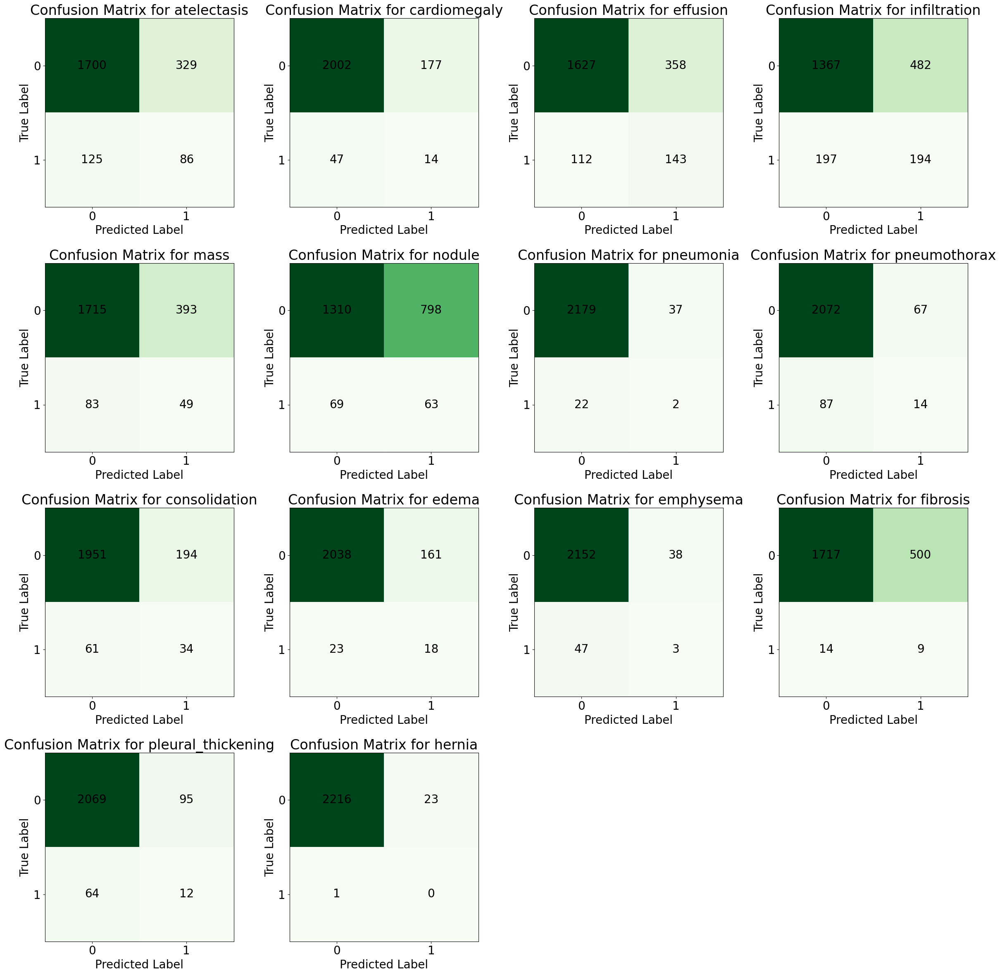

In [ ]:
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_images_64) // batch_size
evaluation = simple_model_BCE_fusion.evaluate(test_generator, steps=steps_per_epoch)

class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])  # Update to include AUC if available
print("Test Binary Accuracy:", evaluation[1])  # Update if binary accuracy is included

# Generate raw predictions
y_probs = simple_model_BCE_fusion.predict(test_generator, steps=steps_per_epoch)
y_true = test_labels_64  # True labels (multi-label ground truth)

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.2652
Hamming Loss: 0.1468
Macro F1-score: 0.1606
Micro F1-score: 0.2178


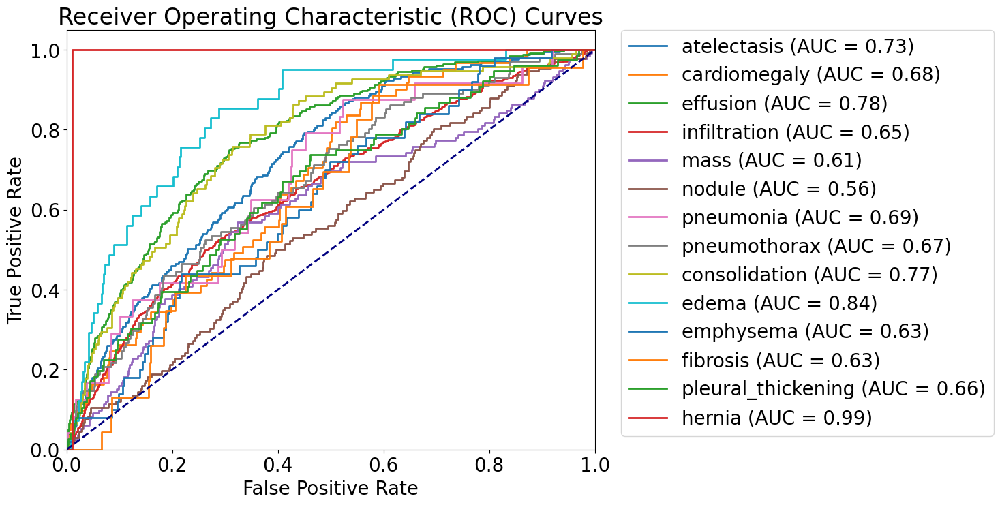

In [ ]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Simple Cnn - 128 - Fusion - loss: Binary Cross-Entropy

In [ ]:
batch_size = 32
train_generator = dual_data_generator(train_images_128, train_masked_images_128_cnn, train_labels_128, batch_size)
val_generator = dual_data_generator(val_images_128, val_masked_images_128_cnn, val_labels_128, batch_size)
test_generator = dual_data_generator(test_images_128, test_masked_images_128_cnn, test_labels_128, batch_size)

In [ ]:
# Load the pre-trained global and local models
global_branch = load_model('/content/drive/My Drive/ChestMNIST/simple_model_BCE_128.keras')
local_branch = load_model('/content/drive/My Drive/ChestMNIST/simple_model_BCE_128_local.keras')

In [ ]:
# Rename the layers of the global and local models
global_branch = rename_model_layers(global_branch, 'global_')
local_branch = rename_model_layers(local_branch, 'local_')

In [ ]:
global_branch.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ global_input_layer (InputLayer)      │ (None, 128, 128, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d (Conv2D)               │ (None, 128, 128, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization           │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d (MaxPooling2D)  │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_1 (Conv2D)             │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_1         │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_1               │ (None, 32, 32, 128)         │               0 │
│ (MaxPooling2D)                       │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_2 (Conv2D)             │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_2         │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_2               │ (None, 16, 16, 256)         │               0 │
│ (MaxPooling2D)                       │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_3 (Conv2D)             │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_3         │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_4 (Conv2D)             │ (None, 16, 16, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_4         │ (None, 16, 16, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_global_average_pooling2d      │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_dense (Dense)                 │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
local_branch.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ local_input_layer (InputLayer)       │ (None, 128, 128, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d (Conv2D)                │ (None, 128, 128, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization            │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d (MaxPooling2D)   │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_1 (Conv2D)              │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_1          │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d_1 (MaxPooling2D) │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_2 (Conv2D)              │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_2          │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d_2 (MaxPooling2D) │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_3 (Conv2D)              │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_3          │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_4 (Conv2D)              │ (None, 16, 16, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_4          │ (None, 16, 16, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_global_average_pooling2d       │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_dense (Dense)                  │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
for layer in global_branch.layers:
    layer.trainable = False

for layer in local_branch.layers:
    layer.trainable = False

In [ ]:
simple_model_BCE_128_fusion, simple_model_BCE_128_fusion_history = train_and_save_cnn(
    loss = 'binary_crossentropy',
    batch_size = 32,
    num_epochs = 17,
    model = create_fusion_model(global_branch, local_branch),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_BCE_128_fusion'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ global_input_layer        │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_input_layer         │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d (Conv2D)    │ (None, 128, 128, 64)   │            640 │ global_input_layer[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_conv2d (Conv2D)     │ (None, 128, 128, 64)   │            640 │ local_input_layer[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_batch_normalizati… │ (None, 128, 128, 64)   │            256 │ global_conv2d[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_batch_normalization │ (None, 128, 128, 64)   │            256 │ local_conv2d[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling2d      │ (None, 64, 64, 64)     │              0 │ global_batch_normaliz… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_max_pooling2d       │ (None, 64, 64, 64)     │              0 │ local_batch_normaliza… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d_1 (Conv2D)  │ (None, 64, 64, 128)    │         73,856 │ global_max_pooling2d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_conv2d_1 (Conv2D)   │ (None, 64, 64, 128)    │         73,856 │ local_max_pooling2d[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_batch_normalizati… │ (None, 64, 64, 128)    │            512 │ global_conv2d_1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_batch_normalizatio… │ (None, 64, 64, 128)    │            512 │ local_conv2d_1[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling2d_1    │ (None, 32, 32, 128)    │              0 │ global_batch_normaliz… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_max_pooling2d_1     │ (None, 32, 32, 128)    │              0 │ local_batch_normaliza… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d_2 (Conv

 Total params: 12,583,858 (48.00 MB)

 Trainable params: 29,106 (113.70 KB)

 Non-trainable params: 12,554,752 (47.89 MB)

Epoch 1/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - auc: 0.5468 - binary_accuracy: 0.8449 - loss: 0.4211 - val_auc: 0.7177 - val_binary_accuracy: 0.9465 - val_loss: 0.1967
Epoch 2/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - auc: 0.7246 - binary_accuracy: 0.9480 - loss: 0.1898 - val_auc: 0.7477 - val_binary_accuracy: 0.9470 - val_loss: 0.1871
Epoch 3/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - auc: 0.7509 - binary_accuracy: 0.9485 - loss: 0.1824 - val_auc: 0.7506 - val_binary_accuracy: 0.9469 - val_loss: 0.1862
Epoch 4/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - auc: 0.7523 - binary_accuracy: 0.9481 - loss: 0.1825 - val_auc: 0.7512 - val_binary_accuracy: 0.9470 - val_loss: 0.1852
Epoch 5/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - auc: 0.7497 - binary_accuracy: 0.9473 - loss: 0.1846 - val_auc: 0.7598 - val_binary_accuracy: 0.9478 - val_loss: 0.1816
Epoch 6/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - auc: 0.7617 - binary_accuracy: 0.9489 - loss: 0.1787 - val_auc: 

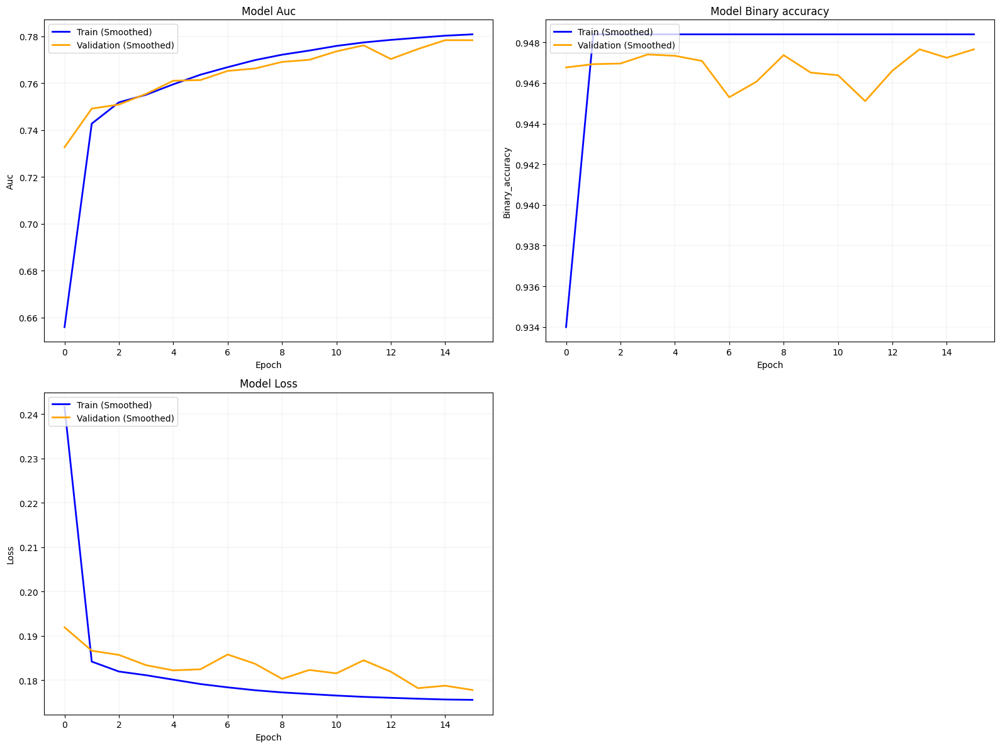

In [ ]:
plot_training_history(simple_model_BCE_128_fusion_history)

#### Model Evaluation

In [ ]:
file_path_simple_model_BCE = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_128_fusion.keras'
file_path_simple_model_BCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_128_fusion_history.pkl'
# Load the model
simple_model_BCE_128_fusion = load_model(file_path_simple_model_BCE)
simple_model_BCE_128_fusion_history = pickle.load(open(file_path_simple_model_BCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = dual_data_generator(train_images_128, train_masked_images_128_cnn, train_labels_128, batch_size)
val_generator = dual_data_generator(val_images_128, val_masked_images_128_cnn, val_labels_128, batch_size)
test_generator = dual_data_generator(test_images_128, test_masked_images_128_cnn, test_labels_128, batch_size)

35/35 ━━━━━━━━━━━━━━━━━━━━ 10s 94ms/step - auc: 0.7724 - binary_accuracy: 0.9475 - loss: 0.1797
Test Loss: 0.17458367347717285
Test AUC: 0.777320146560669
Test Binary Accuracy: 0.9492027163505554
35/35 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step
Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.15      0.59      0.24       211
      cardiomegaly       0.05      0.59      0.09        61
          effusion       0.24      0.50      0.32       255
      infiltration       0.23      0.68      0.34       391
              mass       0.15      0.15      0.15       132
            nodule       0.07      0.55      0.13       132
         pneumonia       0.02      0.33      0.04        24
      pneumothorax       0.07      0.18      0.10       101
     consolidation       0.14      0.26      0.18        95
             edema       0.07      0.66      0.13        41
         emphysema       0.03      0.10      0.05        50
          fibrosis 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


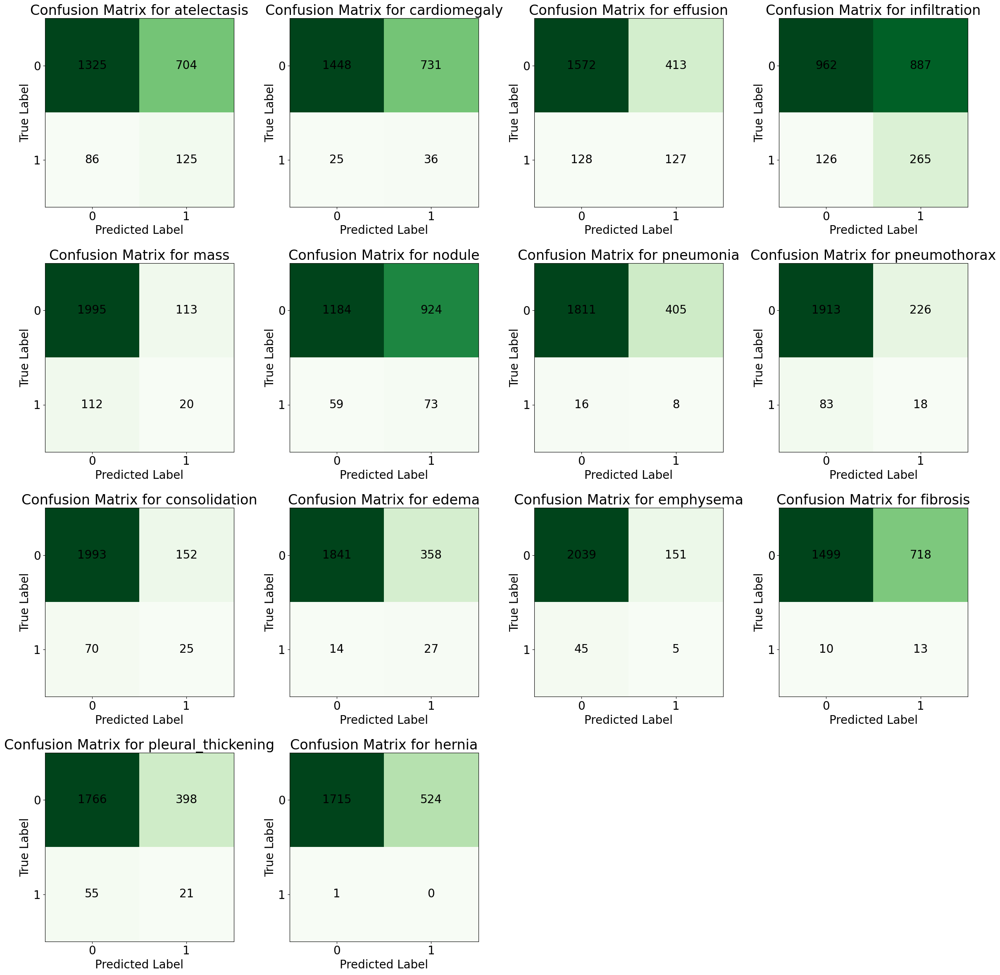

In [ ]:
from sklearn.metrics import classification_report, multilabel_confusion_matrix
from sklearn.metrics import precision_recall_curve

# Set font size for all elements
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_images_64) // batch_size  # Or just test_generator_64.samples / batch_size
evaluation = simple_model_BCE_128_fusion.evaluate(test_generator, steps=steps_per_epoch)

# Define the class labels manually in the correct order
class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])  # Update to include AUC if available
print("Test Binary Accuracy:", evaluation[1])  # Update if binary accuracy is included

# Generate raw predictions
y_probs = simple_model_BCE_128_fusion.predict(test_generator, steps=steps_per_epoch)
y_true = test_labels_64  # True labels (multi-label ground truth)

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))  # Adjust based on the number of classes (14 here)
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.1464
Hamming Loss: 0.2402
Macro F1-score: 0.1350
Micro F1-score: 0.1684


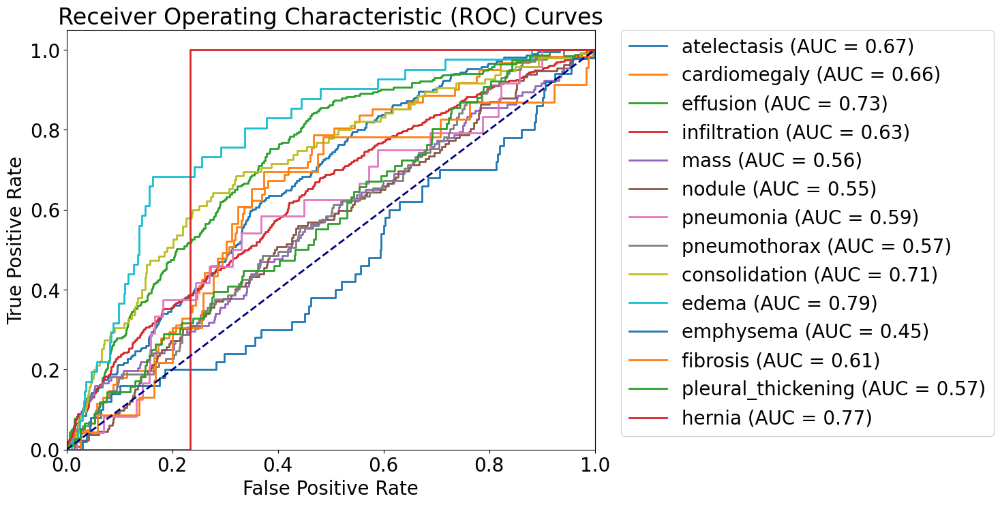

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming y_true and y_probs are defined from the previous code
# y_true: true binary labels (test_labels_64)
# y_probs: predicted probabilities (simple_model_BCE.predict)

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Simple CNN - 224 - Fusion - loss: Binary Cross-Entropy

In [ ]:
batch_size = 32
train_generator = dual_data_generator(train_images_224, train_masked_images_224_cnn, train_labels_224, batch_size)
val_generator = dual_data_generator(val_images_224, val_masked_images_224_cnn, val_labels_224, batch_size)
test_generator = dual_data_generator(test_images_224, test_masked_images_224_cnn, test_labels_224, batch_size)

In [ ]:
# Load the pre-trained global and local models
global_branch = load_model('/content/drive/My Drive/ChestMNIST/simple_model_BCE_224.keras')
local_branch = load_model('/content/drive/My Drive/ChestMNIST/simple_model_BCE_224_local.keras')

In [ ]:
# Rename the layers of the global and local models
global_branch = rename_model_layers(global_branch, 'global_')
local_branch = rename_model_layers(local_branch, 'local_')

In [ ]:
global_branch.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ global_input_layer (InputLayer)      │ (None, 224, 224, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d (Conv2D)               │ (None, 224, 224, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization           │ (None, 224, 224, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d (MaxPooling2D)  │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_1 (Conv2D)             │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_1         │ (None, 112, 112, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_1               │ (None, 56, 56, 128)         │               0 │
│ (MaxPooling2D)                       │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_2 (Conv2D)             │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_2         │ (None, 56, 56, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_2               │ (None, 28, 28, 256)         │               0 │
│ (MaxPooling2D)                       │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_3 (Conv2D)             │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_3         │ (None, 28, 28, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_4 (Conv2D)             │ (None, 28, 28, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_4         │ (None, 28, 28, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_global_average_pooling2d      │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_dense (Dense)                 │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
local_branch.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ local_input_layer (InputLayer)       │ (None, 224, 224, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d (Conv2D)                │ (None, 224, 224, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization            │ (None, 224, 224, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d (MaxPooling2D)   │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_1 (Conv2D)              │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_1          │ (None, 112, 112, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d_1 (MaxPooling2D) │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_2 (Conv2D)              │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_2          │ (None, 56, 56, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d_2 (MaxPooling2D) │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_3 (Conv2D)              │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_3          │ (None, 28, 28, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_4 (Conv2D)              │ (None, 28, 28, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_4          │ (None, 28, 28, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_global_average_pooling2d       │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_dense (Dense)                  │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
simple_model_BCE_224_fusion, simple_model_BCE_224_fusion_history = train_and_save_cnn(
    loss = 'binary_crossentropy',
    batch_size = 32,
    num_epochs = 17,
    model = create_fusion_model(global_branch, local_branch),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_BCE_224_fusion'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ global_input_layer        │ (None, 224, 224, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_input_layer         │ (None, 224, 224, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d (Conv2D)    │ (None, 224, 224, 64)   │            640 │ global_input_layer[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_conv2d (Conv2D)     │ (None, 224, 224, 64)   │            640 │ local_input_layer[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_batch_normalizati… │ (None, 224, 224, 64)   │            256 │ global_conv2d[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_batch_normalization │ (None, 224, 224, 64)   │            256 │ local_conv2d[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling2d      │ (None, 112, 112, 64)   │              0 │ global_batch_normaliz… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_max_pooling2d       │ (None, 112, 112, 64)   │              0 │ local_batch_normaliza… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d_1 (Conv2D)  │ (None, 112, 112, 128)  │         73,856 │ global_max_pooling2d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_conv2d_1 (Conv2D)   │ (None, 112, 112, 128)  │         73,856 │ local_max_pooling2d[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_batch_normalizati… │ (None, 112, 112, 128)  │            512 │ global_conv2d_1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_batch_normalizatio… │ (None, 112, 112, 128)  │            512 │ local_conv2d_1[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling2d_1    │ (None, 56, 56, 128)    │              0 │ global_batch_normaliz… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_max_pooling2d_1     │ (None, 56, 56, 128)    │              0 │ local_batch_normaliza… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d_2 (Conv

 Total params: 12,583,858 (48.00 MB)

 Trainable params: 29,106 (113.70 KB)

 Non-trainable params: 12,554,752 (47.89 MB)

Epoch 1/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 55s 180ms/step - auc: 0.5929 - binary_accuracy: 0.8980 - loss: 0.3598 - val_auc: 0.7404 - val_binary_accuracy: 0.9465 - val_loss: 0.1916
Epoch 2/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - auc: 0.7444 - binary_accuracy: 0.9468 - loss: 0.1894 - val_auc: 0.7427 - val_binary_accuracy: 0.9462 - val_loss: 0.1894
Epoch 3/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - auc: 0.7543 - binary_accuracy: 0.9482 - loss: 0.1822 - val_auc: 0.7473 - val_binary_accuracy: 0.9463 - val_loss: 0.1881
Epoch 4/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - auc: 0.7529 - binary_accuracy: 0.9484 - loss: 0.1819 - val_auc: 0.7567 - val_binary_accuracy: 0.9455 - val_loss: 0.1885
Epoch 5/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - auc: 0.7629 - binary_accuracy: 0.9476 - loss: 0.1819 - val_auc: 0.7640 - val_binary_accuracy: 0.9472 - val_loss: 0.1823
Epoch 6/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 40s 162ms/step - auc: 0.7665 - binary_accuracy: 0.9473 - loss: 0.1818 - val

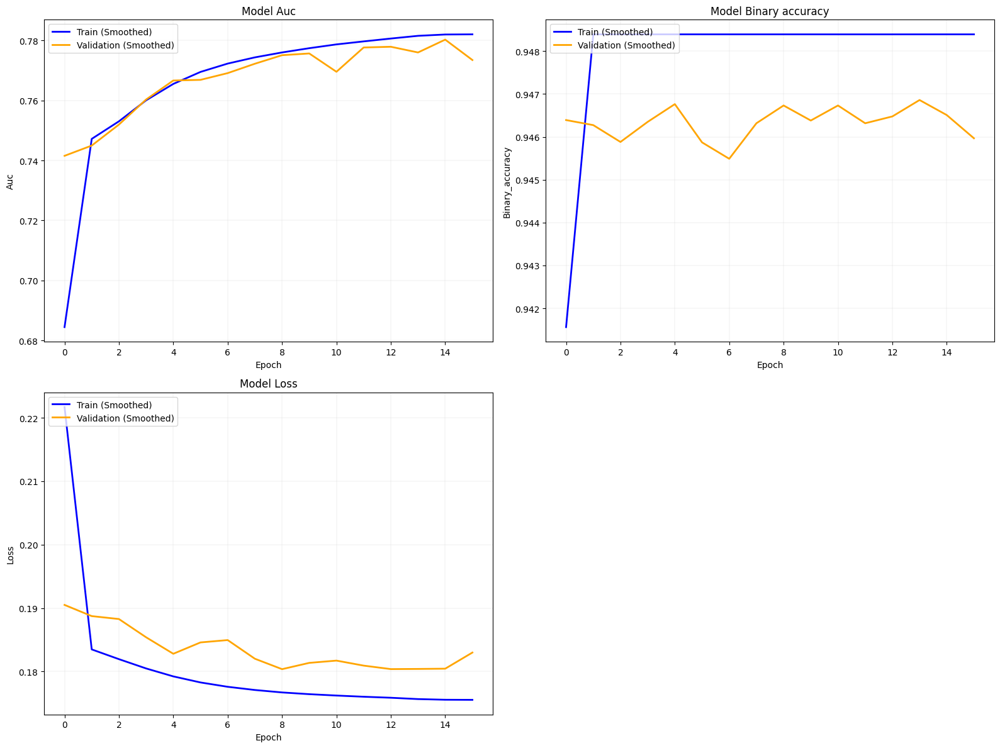

In [ ]:
plot_training_history(simple_model_BCE_224_fusion_history)

#### Model Evaluation

In [ ]:
file_path_simple_model_BCE = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_224_fusion.keras'
file_path_simple_model_BCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_BCE_224_fusion_history.pkl'
# Load the model
simple_model_BCE_224_fusion = load_model(file_path_simple_model_BCE)
simple_model_BCE_224_fusion_history = pickle.load(open(file_path_simple_model_BCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = dual_data_generator(train_images_224, train_masked_images_224_cnn, train_labels_224, batch_size)
val_generator = dual_data_generator(val_images_224, val_masked_images_224_cnn, val_labels_224, batch_size)
test_generator = dual_data_generator(test_images_224, test_masked_images_224_cnn, test_labels_224, batch_size)

35/35 ━━━━━━━━━━━━━━━━━━━━ 19s 235ms/step - auc: 0.7718 - binary_accuracy: 0.9475 - loss: 0.1798
Test Loss: 0.17478595674037933
Test AUC: 0.7760467529296875
Test Binary Accuracy: 0.9492027163505554
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 234ms/step
Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.15      0.64      0.24       211
      cardiomegaly       0.07      0.18      0.10        61
          effusion       0.25      0.43      0.32       255
      infiltration       0.22      0.72      0.34       391
              mass       0.07      0.56      0.12       132
            nodule       0.08      0.36      0.13       132
         pneumonia       0.04      0.29      0.06        24
      pneumothorax       0.10      0.24      0.14       101
     consolidation       0.12      0.36      0.18        95
             edema       0.06      0.32      0.11        41
         emphysema       0.22      0.04      0.07        50
          fibros

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


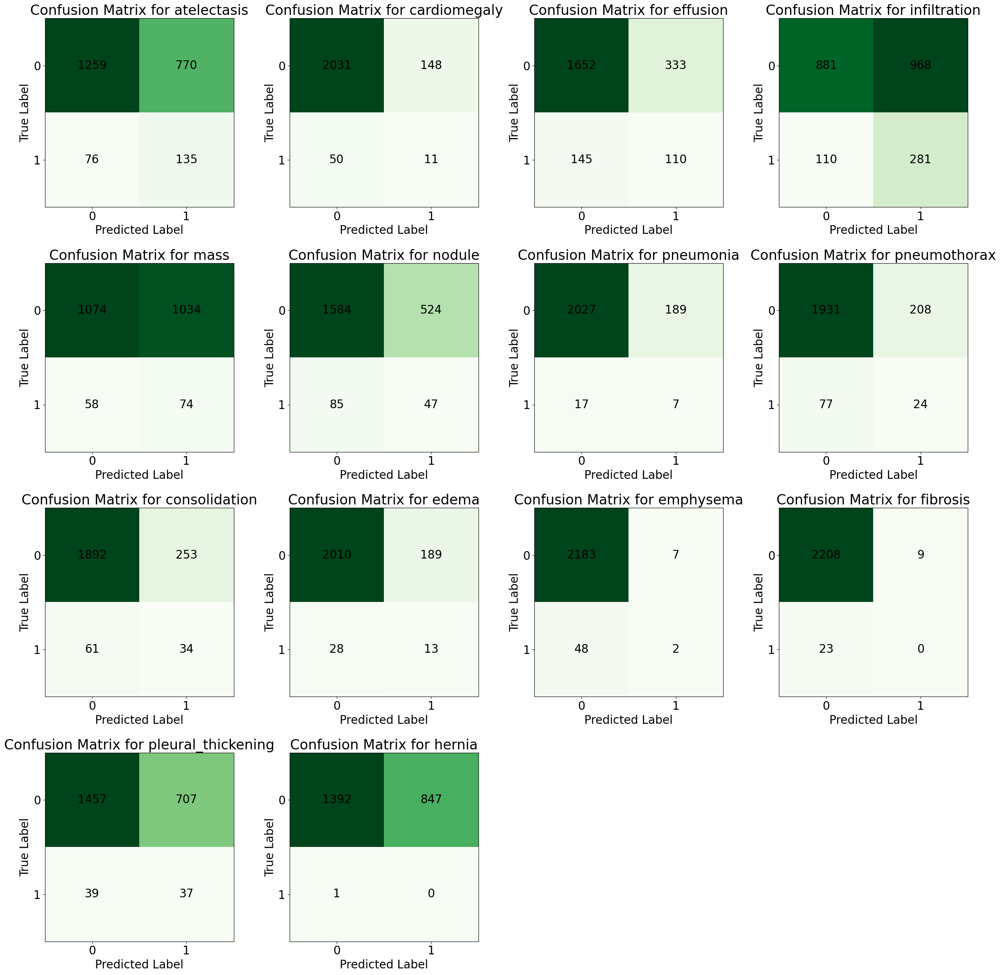

In [ ]:
from sklearn.metrics import classification_report, multilabel_confusion_matrix
from sklearn.metrics import precision_recall_curve

# Set font size for all elements
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_images_64) // batch_size  # Or just test_generator_64.samples / batch_size
evaluation = simple_model_BCE_224_fusion.evaluate(test_generator, steps=steps_per_epoch)

# Define the class labels manually in the correct order
class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])  # Update to include AUC if available
print("Test Binary Accuracy:", evaluation[1])  # Update if binary accuracy is included

# Generate raw predictions
y_probs = simple_model_BCE_224_fusion.predict(test_generator, steps=steps_per_epoch)
y_true = test_labels_64  # True labels (multi-label ground truth)

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))  # Adjust based on the number of classes (14 here)
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.1812
Hamming Loss: 0.2233
Macro F1-score: 0.1360
Micro F1-score: 0.1812


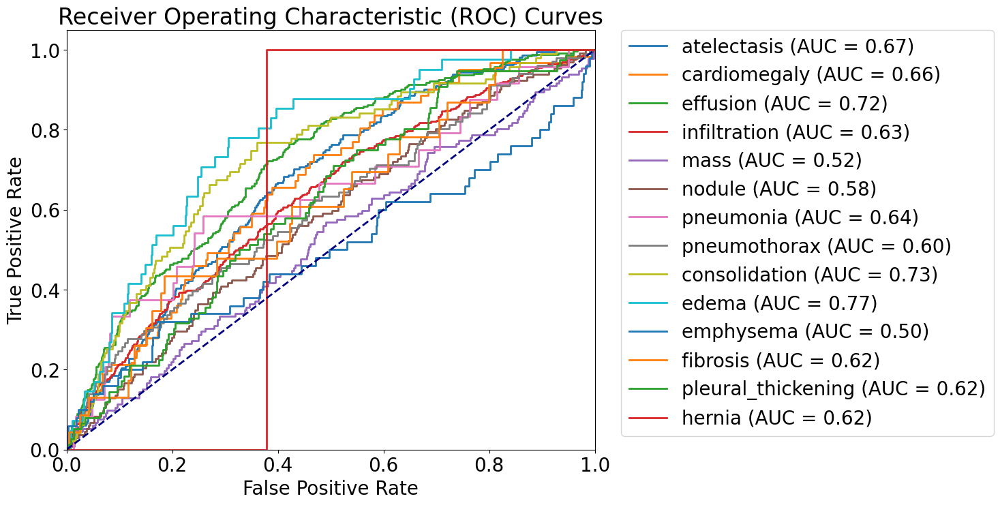

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming y_true and y_probs are defined from the previous code
# y_true: true binary labels (test_labels_64)
# y_probs: predicted probabilities (simple_model_BCE.predict)

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Simple CNN - 64 - Fusion - loss: Weighted Cross-Entropy

In [ ]:
batch_size = 32
train_generator = dual_data_generator(train_images_64, train_masked_images_64_cnn, train_labels_64, batch_size)
val_generator = dual_data_generator(val_images_64, val_masked_images_64_cnn, val_labels_64, batch_size)
test_generator = dual_data_generator(test_images_64, test_masked_images_64_cnn, test_labels_64, batch_size)

In [ ]:
global_branch = load_model('/content/drive/My Drive/ChestMNIST/simple_model_WCE.keras',
                          custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})
local_branch = load_model('/content/drive/My Drive/ChestMNIST/simple_model_WCE_local.keras',
                         custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})

In [ ]:
# Rename the layers of the global and local models
global_branch = rename_model_layers(global_branch, 'global_')
local_branch = rename_model_layers(local_branch, 'local_')

In [ ]:
global_branch.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ global_input_layer (InputLayer)      │ (None, 64, 64, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d (Conv2D)               │ (None, 64, 64, 64)          │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization           │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d (MaxPooling2D)  │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_1 (Conv2D)             │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_1         │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_1               │ (None, 16, 16, 128)         │               0 │
│ (MaxPooling2D)                       │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_2 (Conv2D)             │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_2         │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_2               │ (None, 8, 8, 256)           │               0 │
│ (MaxPooling2D)                       │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_3 (Conv2D)             │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_3         │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_4 (Conv2D)             │ (None, 8, 8, 1024)          │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_4         │ (None, 8, 8, 1024)          │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_global_average_pooling2d      │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_dense (Dense)                 │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
local_branch.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ local_input_layer (InputLayer)       │ (None, 64, 64, 1)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d (Conv2D)                │ (None, 64, 64, 64)          │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization            │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d (MaxPooling2D)   │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_1 (Conv2D)              │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_1          │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d_1 (MaxPooling2D) │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_2 (Conv2D)              │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_2          │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d_2 (MaxPooling2D) │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_3 (Conv2D)              │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_3          │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_4 (Conv2D)              │ (None, 8, 8, 1024)          │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_4          │ (None, 8, 8, 1024)          │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_global_average_pooling2d       │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_dense (Dense)                  │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
simple_model_WCE_fusion, simple_model_WCE_fusion_history = train_and_save_cnn(
    loss = weighted_cross_entropy_loss,
    batch_size = 32,
    num_epochs = 17,
    model = create_fusion_model(global_branch, local_branch),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_WCE_fusion'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ global_input_layer        │ (None, 64, 64, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_input_layer         │ (None, 64, 64, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d (Conv2D)    │ (None, 64, 64, 64)     │            640 │ global_input_layer[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_conv2d (Conv2D)     │ (None, 64, 64, 64)     │            640 │ local_input_layer[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_batch_normalizati… │ (None, 64, 64, 64)     │            256 │ global_conv2d[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_batch_normalization │ (None, 64, 64, 64)     │            256 │ local_conv2d[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling2d      │ (None, 32, 32, 64)     │              0 │ global_batch_normaliz… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_max_pooling2d       │ (None, 32, 32, 64)     │              0 │ local_batch_normaliza… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d_1 (Conv2D)  │ (None, 32, 32, 128)    │         73,856 │ global_max_pooling2d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_conv2d_1 (Conv2D)   │ (None, 32, 32, 128)    │         73,856 │ local_max_pooling2d[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_batch_normalizati… │ (None, 32, 32, 128)    │            512 │ global_conv2d_1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_batch_normalizatio… │ (None, 32, 32, 128)    │            512 │ local_conv2d_1[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling2d_1    │ (None, 16, 16, 128)    │              0 │ global_batch_normaliz… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_max_pooling2d_1     │ (None, 16, 16, 128)    │              0 │ local_batch_normaliza… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d_2 (Conv

 Total params: 12,583,858 (48.00 MB)

 Trainable params: 29,106 (113.70 KB)

 Non-trainable params: 12,554,752 (47.89 MB)

Epoch 1/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 16s 45ms/step - auc: 0.6264 - binary_accuracy: 0.7923 - loss: 1.1008 - val_auc: 0.7383 - val_binary_accuracy: 0.8833 - val_loss: 1.0559
Epoch 2/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - auc: 0.7485 - binary_accuracy: 0.8723 - loss: 1.0290 - val_auc: 0.7363 - val_binary_accuracy: 0.8537 - val_loss: 1.0375
Epoch 3/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - auc: 0.7530 - binary_accuracy: 0.8584 - loss: 1.0103 - val_auc: 0.7402 - val_binary_accuracy: 0.8348 - val_loss: 1.0282
Epoch 4/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - auc: 0.7584 - binary_accuracy: 0.8434 - loss: 0.9969 - val_auc: 0.7322 - val_binary_accuracy: 0.7995 - val_loss: 1.0120
Epoch 5/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - auc: 0.7568 - binary_accuracy: 0.8312 - loss: 0.9956 - val_auc: 0.7460 - val_binary_accuracy: 0.7989 - val_loss: 1.0236
Epoch 6/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - auc: 0.7564 - binary_accuracy: 0.8264 - loss: 0.9915 - val_auc: 0

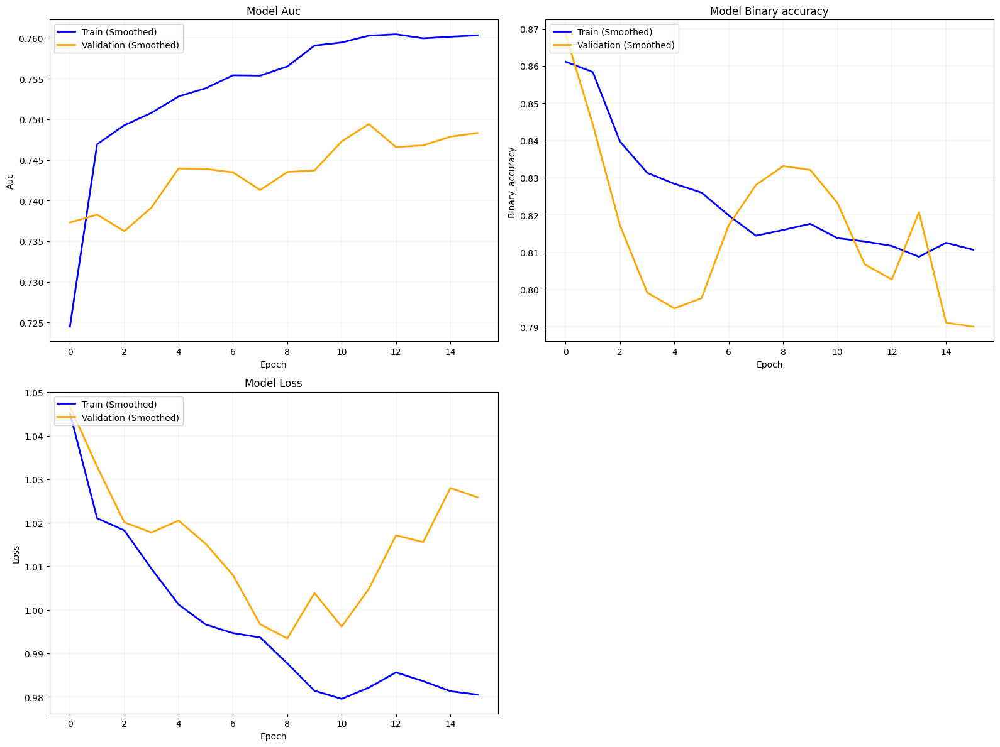

In [ ]:
plot_training_history(simple_model_WCE_fusion_history)

#### Model Evaluation

In [ ]:
file_path_simple_model_WCE = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_fusion.keras'
file_path_simple_model_WCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_fusion_history.pkl'
# Load the model
simple_model_WCE_fusion = load_model(file_path_simple_model_WCE,
                              custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})
simple_model_WCE_fusion_history = pickle.load(open(file_path_simple_model_WCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = dual_data_generator(train_images_64, train_masked_images_64_cnn, train_labels_64, batch_size)
val_generator = dual_data_generator(val_images_64, val_masked_images_64_cnn, val_labels_64, batch_size)
test_generator = dual_data_generator(test_images_64, test_masked_images_64_cnn, test_labels_64, batch_size)

35/35 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - auc: 0.7404 - binary_accuracy: 0.8223 - loss: 1.1663
Test Loss: 1.1500052213668823
Test AUC: 0.7442989945411682
Test Binary Accuracy: 0.8228635787963867
35/35 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step
Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.17      0.46      0.24       211
      cardiomegaly       0.05      0.39      0.09        61
          effusion       0.27      0.40      0.33       255
      infiltration       0.25      0.57      0.35       391
              mass       0.09      0.49      0.15       132
            nodule       0.07      0.82      0.12       132
         pneumonia       0.02      0.12      0.03        24
      pneumothorax       0.07      0.38      0.12       101
     consolidation       0.14      0.42      0.21        95
             edema       0.06      0.51      0.11        41
         emphysema       0.04      0.34      0.07        50
          fibrosis  

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


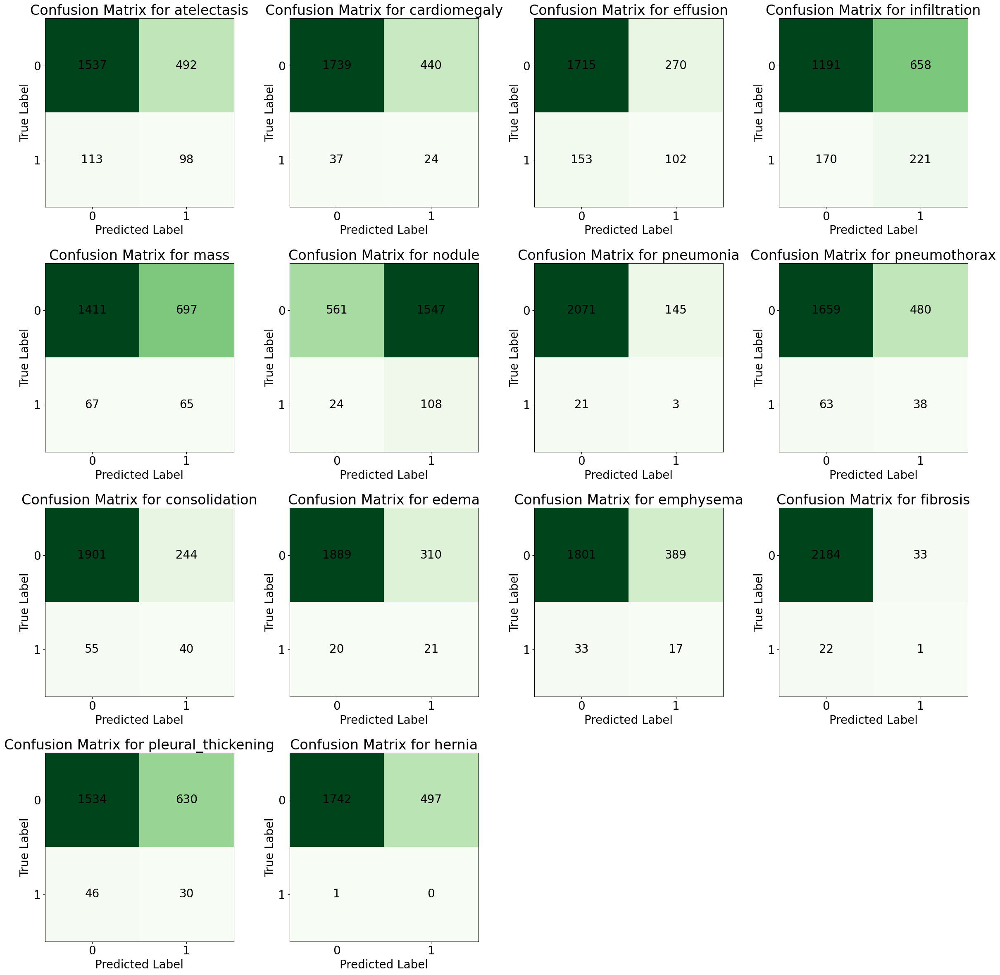

In [ ]:
from sklearn.metrics import classification_report, multilabel_confusion_matrix
from sklearn.metrics import precision_recall_curve

# Set font size for all elements
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_images_64) // batch_size  # Or just test_generator_64.samples / batch_size
evaluation = simple_model_WCE_fusion.evaluate(test_generator, steps=steps_per_epoch)

# Define the class labels manually in the correct order
class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])  # Update to include AUC if available
print("Test Binary Accuracy:", evaluation[1])  # Update if binary accuracy is included

# Generate raw predictions
y_probs = simple_model_WCE_fusion.predict(test_generator, steps=steps_per_epoch)
y_true = test_labels_64  # True labels (multi-label ground truth)

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))  # Adjust based on the number of classes (14 here)
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.0754
Hamming Loss: 0.2442
Macro F1-score: 0.1392
Micro F1-score: 0.1671


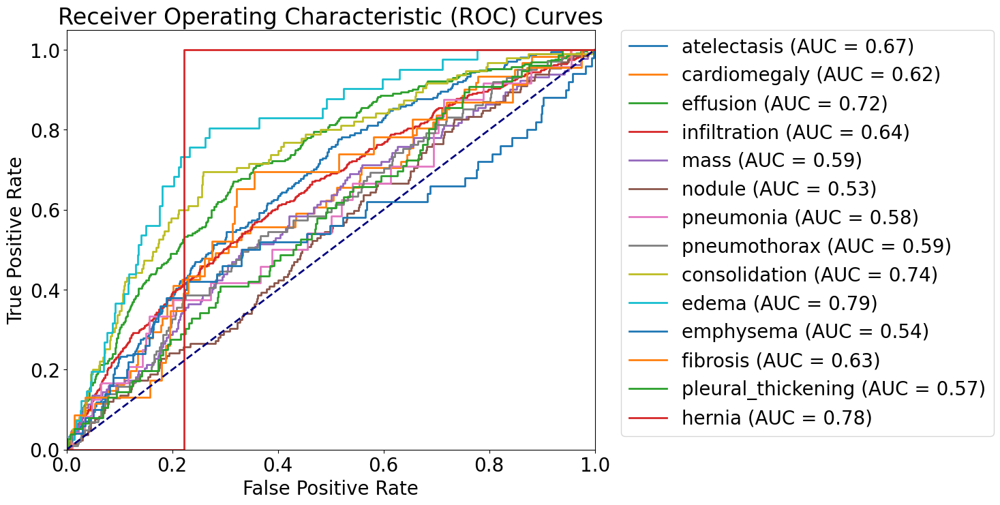

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming y_true and y_probs are defined from the previous code
# y_true: true binary labels (test_labels_64)
# y_probs: predicted probabilities (simple_model_BCE.predict)

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Simple Cnn - 128 - Fusion - loss: Weighted Cross-Entropy

In [ ]:
batch_size = 32
train_generator = dual_data_generator(train_images_128, train_masked_images_128_cnn, train_labels_128, batch_size)
val_generator = dual_data_generator(val_images_128, val_masked_images_128_cnn, val_labels_128, batch_size)
test_generator = dual_data_generator(test_images_128, test_masked_images_128_cnn, test_labels_128, batch_size)

In [ ]:
# Load the pre-trained global and local models
global_branch = load_model('/content/drive/My Drive/ChestMNIST/simple_model_WCE_128.keras',
                           custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})
local_branch = load_model('/content/drive/My Drive/ChestMNIST/simple_model_WCE_128_local.keras',
                          custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})

In [ ]:
# Rename the layers of the global and local models
global_branch = rename_model_layers(global_branch, 'global_')
local_branch = rename_model_layers(local_branch, 'local_')

In [ ]:
global_branch.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ global_input_layer (InputLayer)      │ (None, 128, 128, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d (Conv2D)               │ (None, 128, 128, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization           │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d (MaxPooling2D)  │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_1 (Conv2D)             │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_1         │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_1               │ (None, 32, 32, 128)         │               0 │
│ (MaxPooling2D)                       │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_2 (Conv2D)             │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_2         │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_2               │ (None, 16, 16, 256)         │               0 │
│ (MaxPooling2D)                       │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_3 (Conv2D)             │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_3         │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_4 (Conv2D)             │ (None, 16, 16, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_4         │ (None, 16, 16, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_global_average_pooling2d      │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_dense (Dense)                 │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
local_branch.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ local_input_layer (InputLayer)       │ (None, 128, 128, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d (Conv2D)                │ (None, 128, 128, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization            │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d (MaxPooling2D)   │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_1 (Conv2D)              │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_1          │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d_1 (MaxPooling2D) │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_2 (Conv2D)              │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_2          │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d_2 (MaxPooling2D) │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_3 (Conv2D)              │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_3          │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_4 (Conv2D)              │ (None, 16, 16, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_4          │ (None, 16, 16, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_global_average_pooling2d       │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_dense (Dense)                  │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
simple_model_WCE_128_fusion, simple_model_WCE_128_fusion_history = train_and_save_cnn(
    loss = weighted_cross_entropy_loss,
    batch_size = 32,
    num_epochs = 17,
    model = create_fusion_model(global_branch, local_branch),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_WCE_128_fusion'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ global_input_layer        │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_input_layer         │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d (Conv2D)    │ (None, 128, 128, 64)   │            640 │ global_input_layer[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_conv2d (Conv2D)     │ (None, 128, 128, 64)   │            640 │ local_input_layer[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_batch_normalizati… │ (None, 128, 128, 64)   │            256 │ global_conv2d[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_batch_normalization │ (None, 128, 128, 64)   │            256 │ local_conv2d[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling2d      │ (None, 64, 64, 64)     │              0 │ global_batch_normaliz… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_max_pooling2d       │ (None, 64, 64, 64)     │              0 │ local_batch_normaliza… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d_1 (Conv2D)  │ (None, 64, 64, 128)    │         73,856 │ global_max_pooling2d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_conv2d_1 (Conv2D)   │ (None, 64, 64, 128)    │         73,856 │ local_max_pooling2d[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_batch_normalizati… │ (None, 64, 64, 128)    │            512 │ global_conv2d_1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_batch_normalizatio… │ (None, 64, 64, 128)    │            512 │ local_conv2d_1[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling2d_1    │ (None, 32, 32, 128)    │              0 │ global_batch_normaliz… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_max_pooling2d_1     │ (None, 32, 32, 128)    │              0 │ local_batch_normaliza… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d_2 (Conv

 Total params: 12,583,858 (48.00 MB)

 Trainable params: 29,106 (113.70 KB)

 Non-trainable params: 12,554,752 (47.89 MB)

Epoch 1/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - auc: 0.6749 - binary_accuracy: 0.8281 - loss: 1.0807 - val_auc: 0.7618 - val_binary_accuracy: 0.8901 - val_loss: 1.0412
Epoch 2/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - auc: 0.7581 - binary_accuracy: 0.8719 - loss: 1.0206 - val_auc: 0.7482 - val_binary_accuracy: 0.8641 - val_loss: 1.0235
Epoch 3/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - auc: 0.7586 - binary_accuracy: 0.8517 - loss: 1.0074 - val_auc: 0.7467 - val_binary_accuracy: 0.8385 - val_loss: 0.9995
Epoch 4/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step - auc: 0.7608 - binary_accuracy: 0.8357 - loss: 0.9907 - val_auc: 0.7535 - val_binary_accuracy: 0.8263 - val_loss: 1.0008
Epoch 5/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 21s 84ms/step - auc: 0.7546 - binary_accuracy: 0.8259 - loss: 0.9840 - val_auc: 0.7580 - val_binary_accuracy: 0.8192 - val_loss: 1.0038
Epoch 6/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - auc: 0.7577 - binary_accuracy: 0.8315 - loss: 0.9872 - val_auc: 

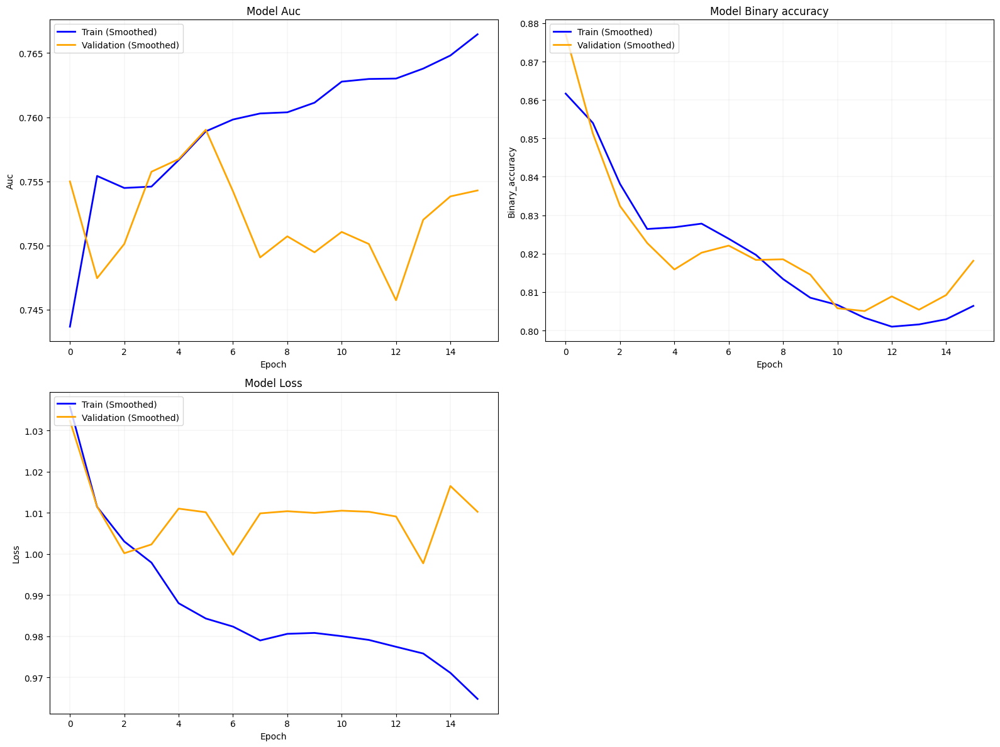

In [ ]:
plot_training_history(simple_model_WCE_128_fusion_history)

#### Model Evaluation

In [ ]:
file_path_simple_model_WCE = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_128_fusion.keras'
file_path_simple_model_WCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_128_fusion_history.pkl'
# Load the model
simple_model_WCE_128_fusion = load_model(file_path_simple_model_WCE,
                              custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})
simple_model_WCE_128_fusion_history = pickle.load(open(file_path_simple_model_WCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = dual_data_generator(train_images_128, train_masked_images_128_cnn, train_labels_128, batch_size)
val_generator = dual_data_generator(val_images_128, val_masked_images_128_cnn, val_labels_128, batch_size)
test_generator = dual_data_generator(test_images_128, test_masked_images_128_cnn, test_labels_128, batch_size)

35/35 ━━━━━━━━━━━━━━━━━━━━ 5s 94ms/step - auc: 0.7465 - binary_accuracy: 0.8138 - loss: 1.1493
Test Loss: 1.140804409980774
Test AUC: 0.7504304051399231
Test Binary Accuracy: 0.8124682307243347
35/35 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step
Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.17      0.44      0.25       211
      cardiomegaly       0.06      0.21      0.09        61
          effusion       0.28      0.41      0.33       255
      infiltration       0.24      0.58      0.34       391
              mass       0.07      0.70      0.13       132
            nodule       0.08      0.61      0.14       132
         pneumonia       0.00      0.00      0.00        24
      pneumothorax       0.17      0.09      0.12       101
     consolidation       0.15      0.45      0.23        95
             edema       0.08      0.07      0.08        41
         emphysema       0.06      0.06      0.06        50
          fibrosis   

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


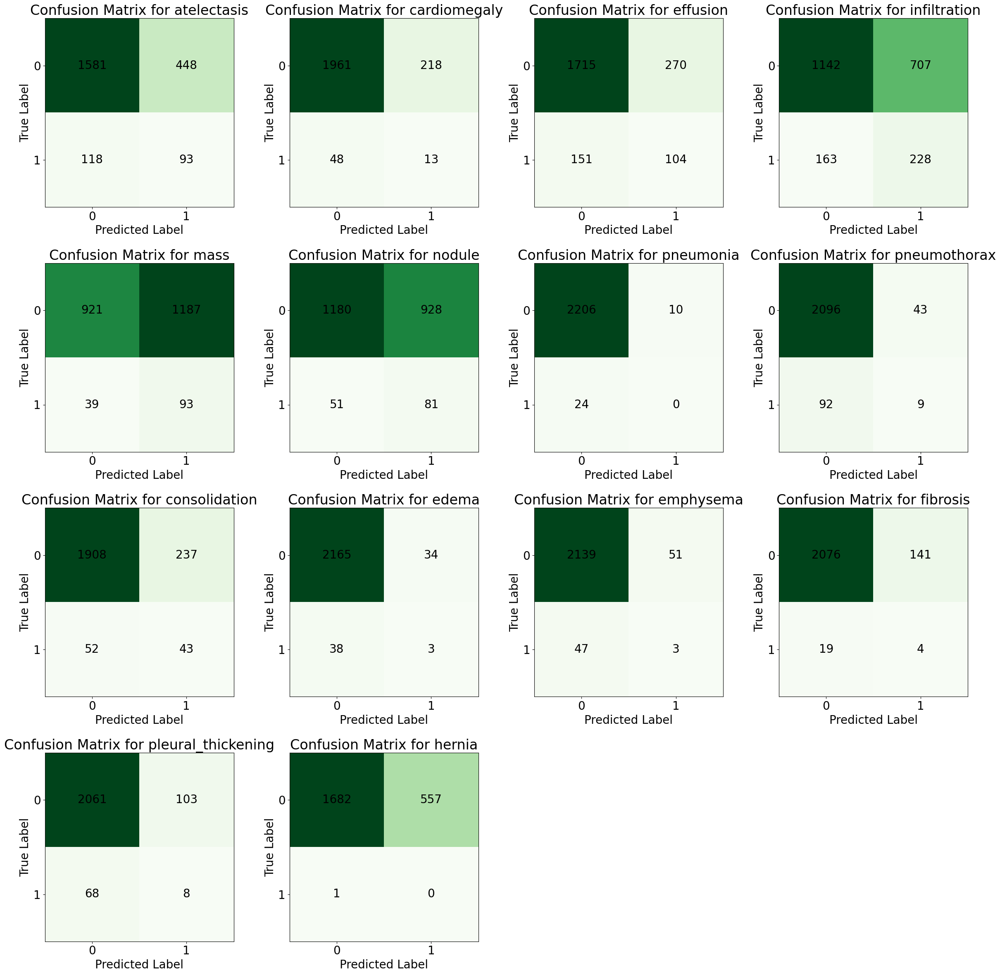

In [ ]:
from sklearn.metrics import classification_report, multilabel_confusion_matrix
from sklearn.metrics import precision_recall_curve

# Set font size for all elements
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_images_64) // batch_size  # Or just test_generator_64.samples / batch_size
evaluation = simple_model_WCE_128_fusion.evaluate(test_generator, steps=steps_per_epoch)

# Define the class labels manually in the correct order
class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])  # Update to include AUC if available
print("Test Binary Accuracy:", evaluation[1])  # Update if binary accuracy is included

# Generate raw predictions
y_probs = simple_model_WCE_128_fusion.predict(test_generator, steps=steps_per_epoch)
y_true = test_labels_64  # True labels (multi-label ground truth)

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))  # Adjust based on the number of classes (14 here)
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.0906
Hamming Loss: 0.1864
Macro F1-score: 0.1357
Micro F1-score: 0.1892


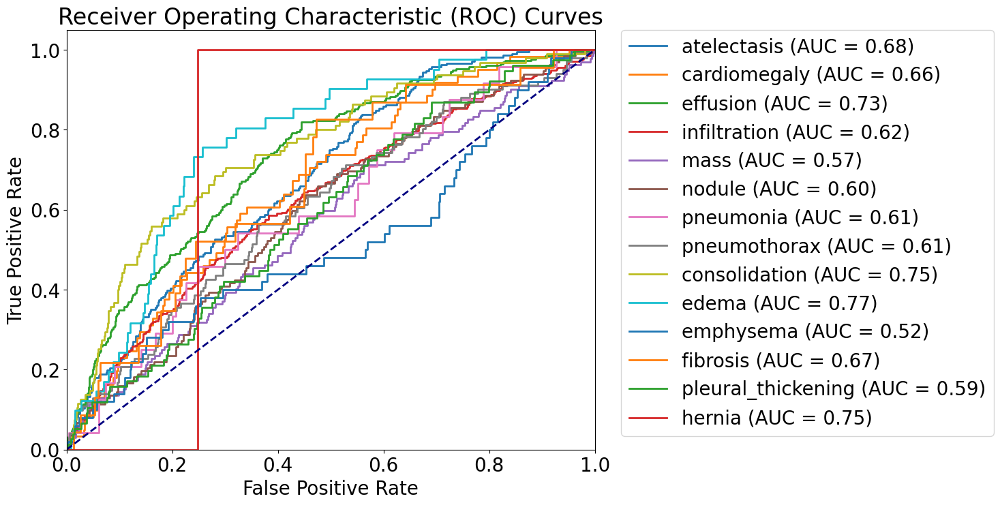

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming y_true and y_probs are defined from the previous code
# y_true: true binary labels (test_labels_64)
# y_probs: predicted probabilities (simple_model_BCE.predict)

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


### Simple CNN - 224 - Fusion - loss: Weighted Cross-Entropy

In [ ]:
batch_size = 32
train_generator = dual_data_generator(train_images_224, train_masked_images_224_cnn, train_labels_224, batch_size)
val_generator = dual_data_generator(val_images_224, val_masked_images_224_cnn, val_labels_224, batch_size)
test_generator = dual_data_generator(test_images_224, test_masked_images_224_cnn, test_labels_224, batch_size)

In [ ]:
# Load the pre-trained global and local models
global_branch = load_model('/content/drive/My Drive/ChestMNIST/simple_model_WCE_224.keras',
                           custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})
local_branch = load_model('/content/drive/My Drive/ChestMNIST/simple_model_WCE_224_local.keras',
                          custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})

In [ ]:
# Rename the layers of the global and local models
global_branch = rename_model_layers(global_branch, 'global_')
local_branch = rename_model_layers(local_branch, 'local_')

In [ ]:
global_branch.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ global_input_layer (InputLayer)      │ (None, 224, 224, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d (Conv2D)               │ (None, 224, 224, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization           │ (None, 224, 224, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d (MaxPooling2D)  │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_1 (Conv2D)             │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_1         │ (None, 112, 112, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_1               │ (None, 56, 56, 128)         │               0 │
│ (MaxPooling2D)                       │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_2 (Conv2D)             │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_2         │ (None, 56, 56, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_max_pooling2d_2               │ (None, 28, 28, 256)         │               0 │
│ (MaxPooling2D)                       │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_3 (Conv2D)             │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_3         │ (None, 28, 28, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_conv2d_4 (Conv2D)             │ (None, 28, 28, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_batch_normalization_4         │ (None, 28, 28, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_global_average_pooling2d      │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_dense (Dense)                 │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
local_branch.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ local_input_layer (InputLayer)       │ (None, 224, 224, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d (Conv2D)                │ (None, 224, 224, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization            │ (None, 224, 224, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d (MaxPooling2D)   │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_1 (Conv2D)              │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_1          │ (None, 112, 112, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d_1 (MaxPooling2D) │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_2 (Conv2D)              │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_2          │ (None, 56, 56, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_max_pooling2d_2 (MaxPooling2D) │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_3 (Conv2D)              │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_3          │ (None, 28, 28, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_conv2d_4 (Conv2D)              │ (None, 28, 28, 1024)        │       4,719,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_batch_normalization_4          │ (None, 28, 28, 1024)        │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_global_average_pooling2d       │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ local_dense (Dense)                  │ (None, 14)                  │          14,350 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,291,726 (24.00 MB)

 Trainable params: 6,287,758 (23.99 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
simple_model_WCE_224_fusion, simple_model_WCE_224_fusion_history = train_and_save_cnn(
    loss = weighted_cross_entropy_loss,
    batch_size = 32,
    num_epochs = 17,
    model = create_fusion_model(global_branch, local_branch),
    train_generator = train_generator,
    val_generator = val_generator,
    model_name = 'simple_model_WCE_224_fusion'
)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ global_input_layer        │ (None, 224, 224, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_input_layer         │ (None, 224, 224, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d (Conv2D)    │ (None, 224, 224, 64)   │            640 │ global_input_layer[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_conv2d (Conv2D)     │ (None, 224, 224, 64)   │            640 │ local_input_layer[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_batch_normalizati… │ (None, 224, 224, 64)   │            256 │ global_conv2d[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_batch_normalization │ (None, 224, 224, 64)   │            256 │ local_conv2d[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling2d      │ (None, 112, 112, 64)   │              0 │ global_batch_normaliz… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_max_pooling2d       │ (None, 112, 112, 64)   │              0 │ local_batch_normaliza… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d_1 (Conv2D)  │ (None, 112, 112, 128)  │         73,856 │ global_max_pooling2d[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_conv2d_1 (Conv2D)   │ (None, 112, 112, 128)  │         73,856 │ local_max_pooling2d[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_batch_normalizati… │ (None, 112, 112, 128)  │            512 │ global_conv2d_1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_batch_normalizatio… │ (None, 112, 112, 128)  │            512 │ local_conv2d_1[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_max_pooling2d_1    │ (None, 56, 56, 128)    │              0 │ global_batch_normaliz… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ local_max_pooling2d_1     │ (None, 56, 56, 128)    │              0 │ local_batch_normaliza… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_conv2d_2 (Conv

 Total params: 12,583,858 (48.00 MB)

 Trainable params: 29,106 (113.70 KB)

 Non-trainable params: 12,554,752 (47.89 MB)

Epoch 1/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 52s 193ms/step - auc: 0.6532 - binary_accuracy: 0.7610 - loss: 1.0894 - val_auc: 0.7389 - val_binary_accuracy: 0.8855 - val_loss: 1.0536
Epoch 2/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 80s 324ms/step - auc: 0.7505 - binary_accuracy: 0.8818 - loss: 1.0376 - val_auc: 0.7333 - val_binary_accuracy: 0.8642 - val_loss: 1.0488
Epoch 3/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 41s 167ms/step - auc: 0.7498 - binary_accuracy: 0.8586 - loss: 1.0111 - val_auc: 0.7480 - val_binary_accuracy: 0.8375 - val_loss: 1.0489
Epoch 4/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - auc: 0.7566 - binary_accuracy: 0.8376 - loss: 0.9997 - val_auc: 0.7437 - val_binary_accuracy: 0.8374 - val_loss: 1.0485
Epoch 5/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - auc: 0.7581 - binary_accuracy: 0.8304 - loss: 1.0056 - val_auc: 0.7373 - val_binary_accuracy: 0.8155 - val_loss: 1.0228
Epoch 6/17
246/246 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - auc: 0.7570 - binary_accuracy: 0.8301 - loss: 0.9823 - val

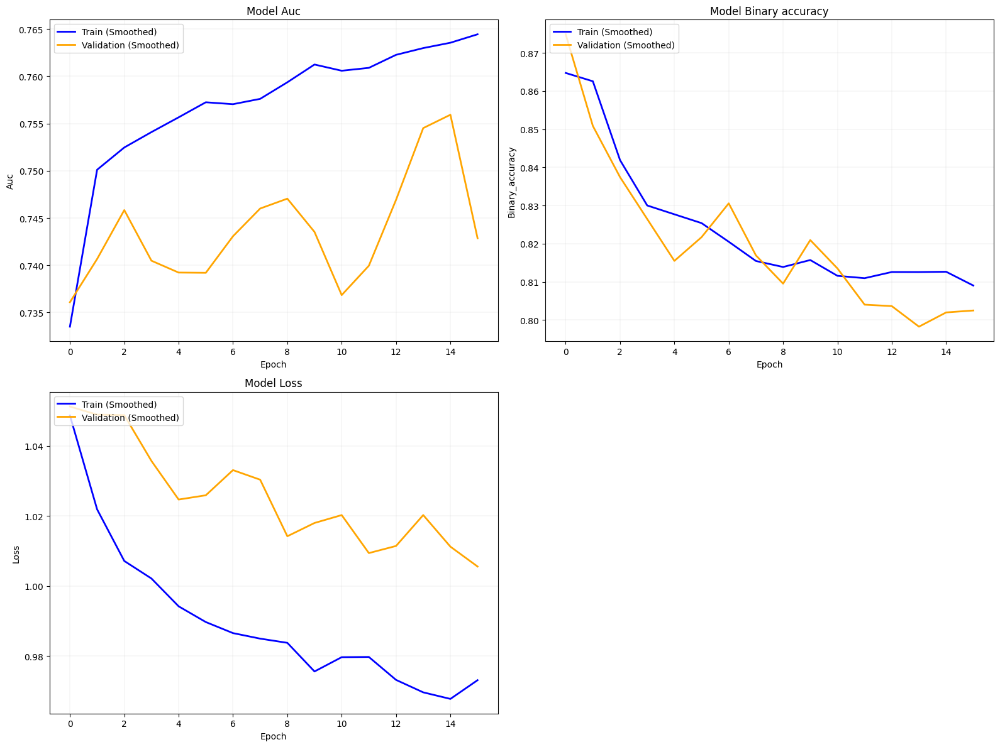

In [ ]:
plot_training_history(simple_model_WCE_224_fusion_history)

#### Model Evaluation

In [ ]:
file_path_simple_model_WCE = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_224_fusion.keras'
file_path_simple_model_WCE_history = '/content/drive/My Drive/ChestMNIST/simple_model_WCE_224_fusion_history.pkl'
# Load the model
simple_model_WCE_224_fusion = load_model(file_path_simple_model_WCE,
                              custom_objects={'weighted_cross_entropy_loss': weighted_cross_entropy_loss})
simple_model_WCE_224_fusion_history = pickle.load(open(file_path_simple_model_WCE_history, 'rb'))

In [ ]:
batch_size = 64
train_generator = dual_data_generator(train_images_224, train_masked_images_224_cnn, train_labels_224, batch_size)
val_generator = dual_data_generator(val_images_224, val_masked_images_224_cnn, val_labels_224, batch_size)
test_generator = dual_data_generator(test_images_224, test_masked_images_224_cnn, test_labels_224, batch_size)

35/35 ━━━━━━━━━━━━━━━━━━━━ 19s 238ms/step - auc: 0.7327 - binary_accuracy: 0.7893 - loss: 1.1453
Test Loss: 1.1364511251449585
Test AUC: 0.7404381632804871
Test Binary Accuracy: 0.7896047234535217
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 240ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
                     precision    recall  f1-score   support

       atelectasis       0.15      0.68      0.24       211
      cardiomegaly       0.07      0.11      0.08        61
          effusion       0.26      0.48      0.34       255
      infiltration       0.24      0.67      0.35       391
              mass       0.09      0.18      0.12       132
            nodule       0.07      0.48      0.12       132
         pneumonia       0.02      0.25      0.04        24
      pneumothorax       0.10      0.27      0.14       101
     consolidation       0.12      0.57      0.20        95
             edema       0.07      0.46      0.12        41
         emphysema       0.08      0.12      0.10        50
          fibrosis       0.02      0.30      0.04        23
pleural_thickening       0.05      0.50      0.09        76
            hernia       0.00      0.00      0.00         1

         micro avg       0.12      0.49      0.20      1593
         macro

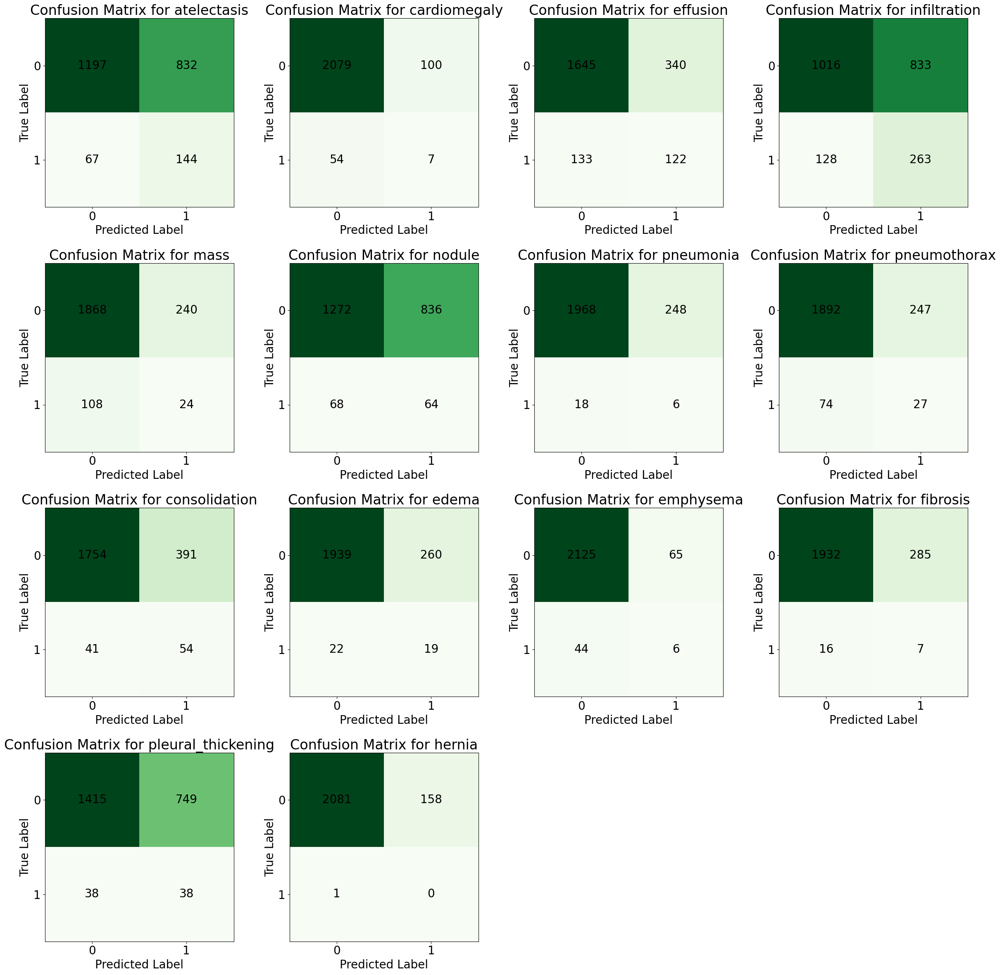

In [ ]:
from sklearn.metrics import classification_report, multilabel_confusion_matrix
from sklearn.metrics import precision_recall_curve

# Set font size for all elements
plt.rcParams.update({'font.size': 20})

batch_size=64
steps_per_epoch = len(test_images_64) // batch_size  # Or just test_generator_64.samples / batch_size
evaluation = simple_model_WCE_224_fusion.evaluate(test_generator, steps=steps_per_epoch)

# Define the class labels manually in the correct order
class_labels = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]

# Print evaluation metrics
print("Test Loss:", evaluation[0])
print("Test AUC:", evaluation[2])  # Update to include AUC if available
print("Test Binary Accuracy:", evaluation[1])  # Update if binary accuracy is included

# Generate raw predictions
y_probs = simple_model_WCE_224_fusion.predict(test_generator, steps=steps_per_epoch)
y_true = test_labels_64  # True labels (multi-label ground truth)

corrected_len = len(y_probs)

# Tune threshold per class using precision-recall curve
optimal_thresholds = []
for i in range(len(class_labels)):
    precision, recall, thresholds = precision_recall_curve(y_true[:corrected_len, i], y_probs[:, i])
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid divide-by-zero
    optimal_thresholds.append(thresholds[np.argmax(f1_scores)])  # Best F1-score threshold

# Generate predictions using the test generator
y_pred = (y_probs > np.array(optimal_thresholds)).astype(int)

# Print classification report (averaged for multi-label data)
print("Classification Report:\n", classification_report(y_true[:corrected_len], y_pred, target_names=class_labels))  # Pass class_labels as target_names

# Generate confusion matrices for each class (multi-label)
confusion_matrices = multilabel_confusion_matrix(y_true[:corrected_len], y_pred)

# Plot confusion matrices for individual classes
fig, axes = plt.subplots(4, 4, figsize=(24, 24))  # Adjust based on the number of classes (14 here)
axes = axes.flatten()

for idx, (cm, label) in enumerate(zip(confusion_matrices, class_labels)):
    ax = axes[idx]
    ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Greens)
    ax.set_title(f"Confusion Matrix for {label}")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    tick_marks = [0, 1]
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)

    # Add values to the confusion matrix
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

# Remove unused subplots
for idx in range(len(class_labels), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

# Exact Match Ratio (Strict accuracy)
exact_match_ratio = accuracy_score(y_true[:corrected_len], y_pred)

# Hamming Loss (fraction of labels incorrectly classified)
hamming = hamming_loss(y_true[:corrected_len], y_pred)

# F1-scores
macro_f1 = f1_score(y_true[:corrected_len], y_pred, average='macro')  # Class-wise F1-score
micro_f1 = f1_score(y_true[:corrected_len], y_pred, average='micro')  # Aggregated F1-score

print(f"Exact Match Ratio: {exact_match_ratio:.4f}")
print(f"Hamming Loss: {hamming:.4f}")
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")


Exact Match Ratio: 0.0991
Hamming Loss: 0.2040
Macro F1-score: 0.1431
Micro F1-score: 0.1963


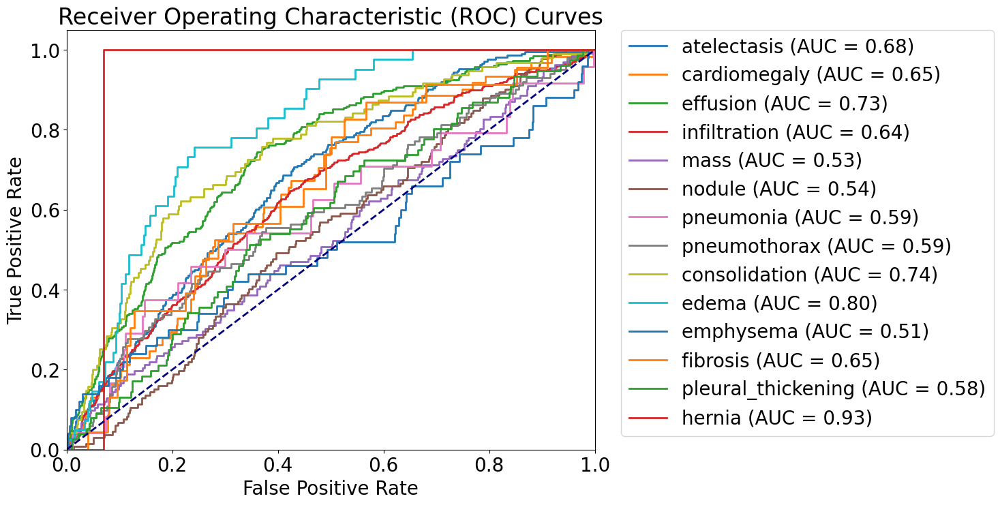

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming y_true and y_probs are defined from the previous code
# y_true: true binary labels (test_labels_64)
# y_probs: predicted probabilities (simple_model_BCE.predict)

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true[:corrected_len, i], y_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(class_labels)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f"{class_labels[i]} (AUC = {roc_auc[i]:.2f})")

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')

# Place legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()


# Results Comparision

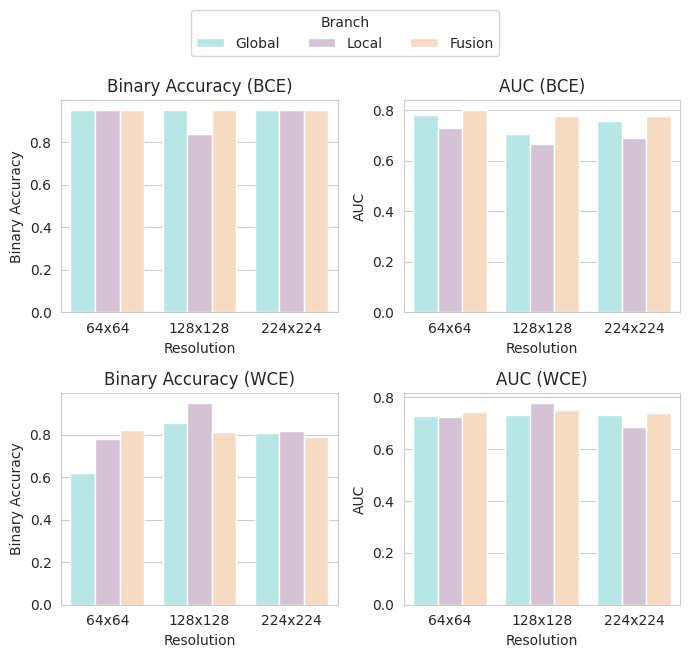

In [ ]:
# Corrected data
data = {
    "Resolution": ["64x64"] * 6 + ["128x128"] * 6 + ["224x224"] * 6,
    "Branch": ["Global", "Global", "Local", "Local", "Fusion", "Fusion"] * 3,
    "Loss": ["BCE", "WCE", "BCE", "WCE", "BCE", "WCE"] * 3,
    "AUC": [0.779, 0.727, 0.729, 0.725, 0.799, 0.745,
            0.704, 0.734, 0.667, 0.779, 0.777, 0.750,
            0.757, 0.732, 0.691, 0.686, 0.776, 0.741],
    "Binary Accuracy": [0.949, 0.619, 0.949, 0.779, 0.949, 0.823,
                         0.949, 0.854, 0.839, 0.949, 0.949, 0.812,
                         0.949, 0.807, 0.949, 0.818, 0.949, 0.789]
}

df = pd.DataFrame(data)
df["Resolution"] = pd.Categorical(df["Resolution"], categories=["64x64", "128x128", "224x224"], ordered=True)
df["Branch"] = pd.Categorical(df["Branch"], categories=["Global", "Local", "Fusion"], ordered=True)

# Separate BCE and WCE data
df_bce = df[df["Loss"] == "BCE"]
df_wce = df[df["Loss"] == "WCE"]

sns.set_style("whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(7, 6))
palette = {"Global": "paleturquoise", "Local": "thistle", "Fusion": "peachpuff"}

# BCE Accuracy
sns.barplot(ax=axes[0, 0], x="Resolution", y="Binary Accuracy", hue="Branch", data=df_bce, palette=palette)
axes[0, 0].set_title("Binary Accuracy (BCE)")
axes[0, 0].set_ylabel("Binary Accuracy")
axes[0, 0].set_xlabel("Resolution")
axes[0, 0].legend_.remove()

# BCE AUC
sns.barplot(ax=axes[0, 1], x="Resolution", y="AUC", hue="Branch", data=df_bce, palette=palette)
axes[0, 1].set_title("AUC (BCE)")
axes[0, 1].set_ylabel("AUC")
axes[0, 1].set_xlabel("Resolution")
axes[0, 1].legend_.remove()

# WCE Accuracy
sns.barplot(ax=axes[1, 0], x="Resolution", y="Binary Accuracy", hue="Branch", data=df_wce, palette=palette)
axes[1, 0].set_title("Binary Accuracy (WCE)")
axes[1, 0].set_ylabel("Binary Accuracy")
axes[1, 0].set_xlabel("Resolution")
axes[1, 0].legend_.remove()

# WCE AUC
sns.barplot(ax=axes[1, 1], x="Resolution", y="AUC", hue="Branch", data=df_wce, palette=palette)
axes[1, 1].set_title("AUC (WCE)")
axes[1, 1].set_ylabel("AUC")
axes[1, 1].set_xlabel("Resolution")
axes[1, 1].legend_.remove()

handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, title="Branch", loc="upper center", bbox_to_anchor=(0.5, 1.1), ncol=3)
plt.tight_layout()
plt.show()